# **Part I: Clustering**

### **Load Data and Libraries**

In [ ]:
from sklearn import datasets
from sklearn.datasets import fetch_covtype
fdata = fetch_covtype()

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import AgglomerativeClustering, Birch, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.pipeline import make_pipeline
from sklearn.mixture import GaussianMixture
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.ensemble import ExtraTreesClassifier, AdaBoostClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import MeanShift
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer, accuracy_score,  balanced_accuracy_score, precision_score, recall_score, f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.metrics import RocCurveDisplay
from sklearn.linear_model import LogisticRegressionCV
from tabulate import tabulate
%matplotlib inline
from sklearn.naive_bayes import GaussianNB
from IPython.display import display
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift
from sklearn.neighbors import KNeighborsClassifier
import scipy.cluster.hierarchy as sch

from google.colab import drive
import csv
import os

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


### **Clustering Methods Used**

* Agglomerative
* Balanced Iterative Reducing and Clustering using Hierarchies (Zhang, Ramakrishnan & Livny, 1996)
* Density-Based Spatial Clustering of Applications with Noise (Ester et al., 1996)
* Gaussian Mixture Model
* Hierarchical
* K-Means
* Mean Shift (Comaniciu and Meer, 2002)

### **Training Code**

##### Agglomerative

In [ ]:
forestdata = fdata.data

# Standardise the features using scaling. Standard Scaler has been chosen.
scaler = StandardScaler()
forestdata_scaled = scaler.fit_transform(forestdata)

# Apply PCA with only 2 components for more robust dimensionality reduction
n_components = 2
pca = PCA(n_components=n_components)
forestdata_pca = pca.fit_transform(forestdata_scaled)

# Define the desired number of batches, calculate the batch size and split data into exactly 20 equal batches
agg_num_batches = 20
agg_batch_size = len(forestdata) // agg_num_batches
agg_batches = [forestdata[i:i + agg_batch_size] for i in range(0, len(forestdata), agg_batch_size)][:agg_num_batches]


# Define a function to perform agglomerative clustering. Start with 2 clusters initially
#Return evaluation metrics
def agg_clustering(data, num_clusters, metric='euclidean', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

##### Balanced Iterative Reducing and Clustering using Hierarchies (BIRCH)

In [ ]:
pca = PCA(n_components=0.95)  # Accounts for 95%
birch = Birch(n_clusters=7) #Adjust as needed
pipeline = make_pipeline(StandardScaler(), pca, birch) #combine scaling and clustering (SciKit Learn, n.d.)

In [ ]:
pipeline.fit(fdata.data)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=0.95)),
                ('birch', Birch(n_clusters=7))])

In [ ]:
results_birch = []

pca_components = [0.90, 0.95]  # Different percentages of variance explained - max 95 before RAM issues
birch_clusters = [5,7,9]

for n_components in pca_components:
    for n_clusters in birch_clusters:

        pca = PCA(n_components=n_components)
        birch = Birch(n_clusters=n_clusters)
        pipeline = make_pipeline(StandardScaler(), pca, birch)
        pipeline.fit(fdata.data)
        labels = pipeline.predict(fdata.data)

        #Evaluation metrics for each pca and cluster (to be stored and printed. Analysis in evaluation)
        silhouette_birch = silhouette_score(fdata.data, labels)
        calinski_birch = calinski_harabasz_score(fdata.data, labels)
        davies_birch = davies_bouldin_score(fdata.data, labels)
        rand_score_birch = adjusted_rand_score(fdata.target, labels)
        mutual_info_birch = adjusted_mutual_info_score(fdata.target, labels)

        result_dict_birch = {
            "PCA Components": n_components,
            "Birch Clusters": n_clusters,
            "Silhouette Score": silhouette_birch,
            "Calinski-Harabasz Score": calinski_birch,
            "Davies-Bouldin Score": davies_birch,
            "Adjusted Rand Score": rand_score_birch,
            "Adjusted Mutual Info Score": mutual_info_birch
        } #save results in a dictionary

        results_birch.append(result_dict_birch)

        # Print results
        print(f"PCA Components: {n_components}, Birch Clusters: {n_clusters}")
        print(f"Silhouette Score: {silhouette_birch}")
        print(f"Calinski-Harabasz Score: {calinski_birch}")
        print(f"Davies-Bouldin Score: {davies_birch}")
        print(f"Adjusted Rand Score: {rand_score_birch}")
        print(f"Adjusted Mutual Info Score: {mutual_info_birch}")
        print()

results_df_birch = pd.DataFrame(results_birch) #save results as new data frame

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE ON PIPELINES: (scikit-learn, n.d.) ##
##############################################################

PCA Components: 0.9, Birch Clusters: 5
Silhouette Score: -0.1991612007832442
Calinski-Harabasz Score: 13973.722198609987
Davies-Bouldin Score: 2.0093864818003175
Adjusted Rand Score: 0.1811425262863056
Adjusted Mutual Info Score: 0.26846381902326877

PCA Components: 0.9, Birch Clusters: 7
Silhouette Score: -0.20210293849782138
Calinski-Harabasz Score: 9420.933039875408
Davies-Bouldin Score: 4.904030439513706
Adjusted Rand Score: 0.1814431712655938
Adjusted Mutual Info Score: 0.2674344325905558

PCA Components: 0.9, Birch Clusters: 9
Silhouette Score: -0.35597782527359256
Calinski-Harabasz Score: 7202.5646613727595
Davies-Bouldin Score: 5.234795961829092
Adjusted Rand Score: 0.19509937526678484
Adjusted Mutual Info Score: 0.2747660114793802

PCA Components: 0.95, Birch Clusters: 5
Silhouette Score: -0.12292766649885364
Calinski-Harabasz Score: 25209.678230540496
Davies-Bouldin Score: 2.137708658621226
Adjusted Rand Score: 0.10372389853186692
Adjusted Mutual Info Score: 0.181017900184419

In [ ]:
results_df_birch

,PCA Components,Birch Clusters,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score,Adjusted Rand Score,Adjusted Mutual Info Score,Overall Score
0,0.90,5,-0.199161,13973.722199,2.009386,0.181143,0.268464,13975.982030
1,0.90,7,-0.202103,9420.933040,4.904030,0.181443,0.267434,9426.083845
2,0.90,9,-0.355978,7202.564661,5.234796,0.195099,0.274766,7207.913345
3,0.95,5,-0.122928,25209.678231,2.137709,0.103724,0.181018,25211.977753
4,0.95,7,-0.211656,16930.569407,4.807348,0.103196,0.180793,16935.449089
5,0.95,9,-0.258898,12975.135052,5.157893,0.110540,0.187821,12980.332408


In [ ]:
file_path_birch_results = '/content/drive/My Drive/birch_clustering_results.2.csv'

In [ ]:
results_df_birch.to_csv(file_path_birch_results, index=False)

##### Density-Based Spatial Clustering of Applications with Noise (DBSCAN)

Number of clusters in Chunk 0: 64


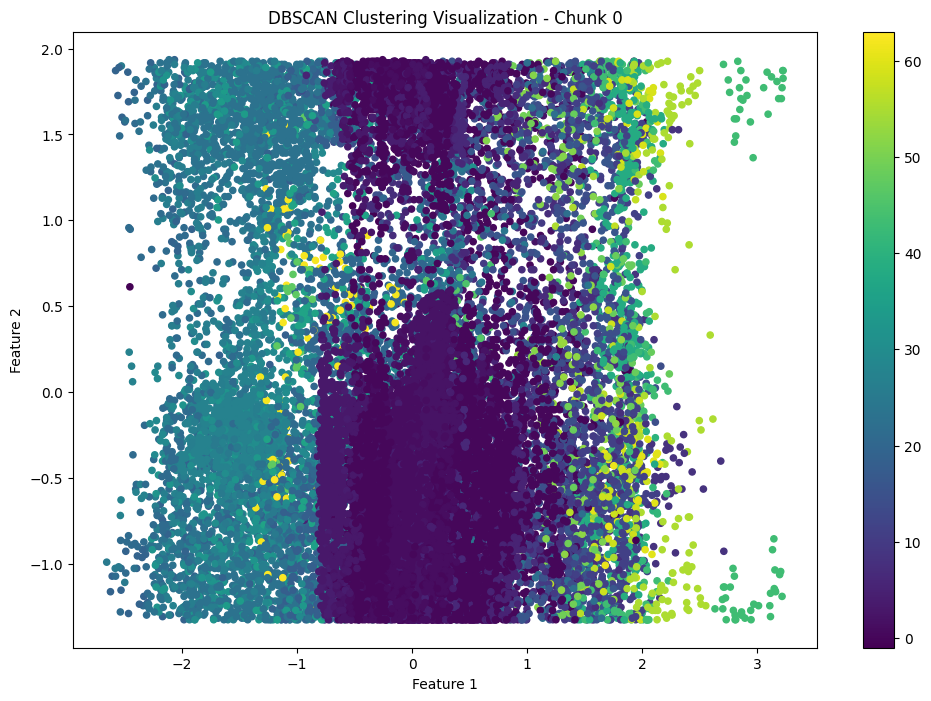

Number of clusters in Chunk 25000: 11


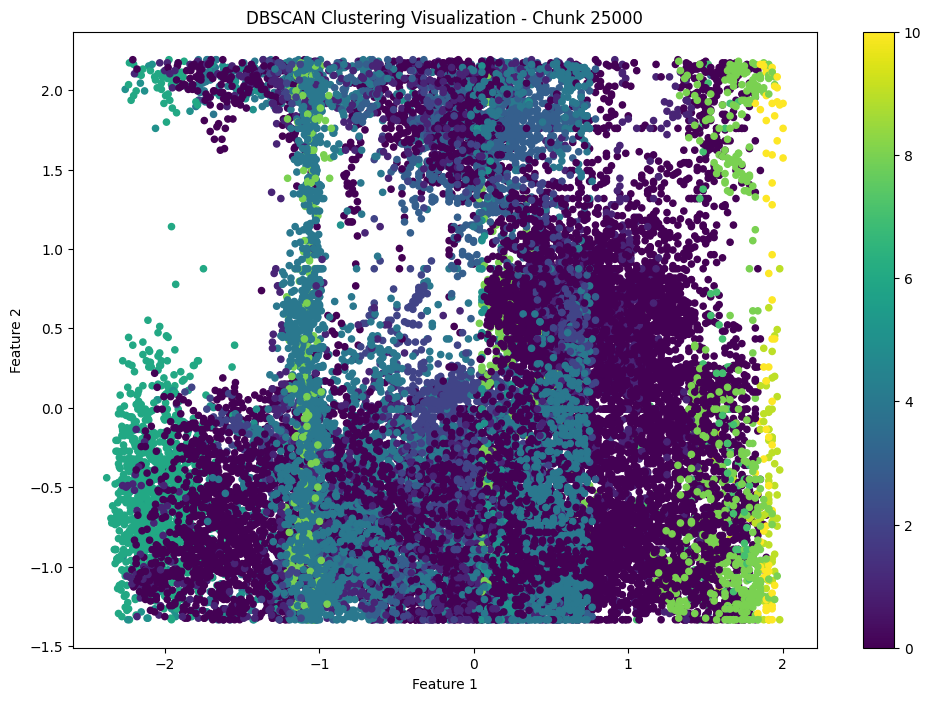

Number of clusters in Chunk 50000: 11


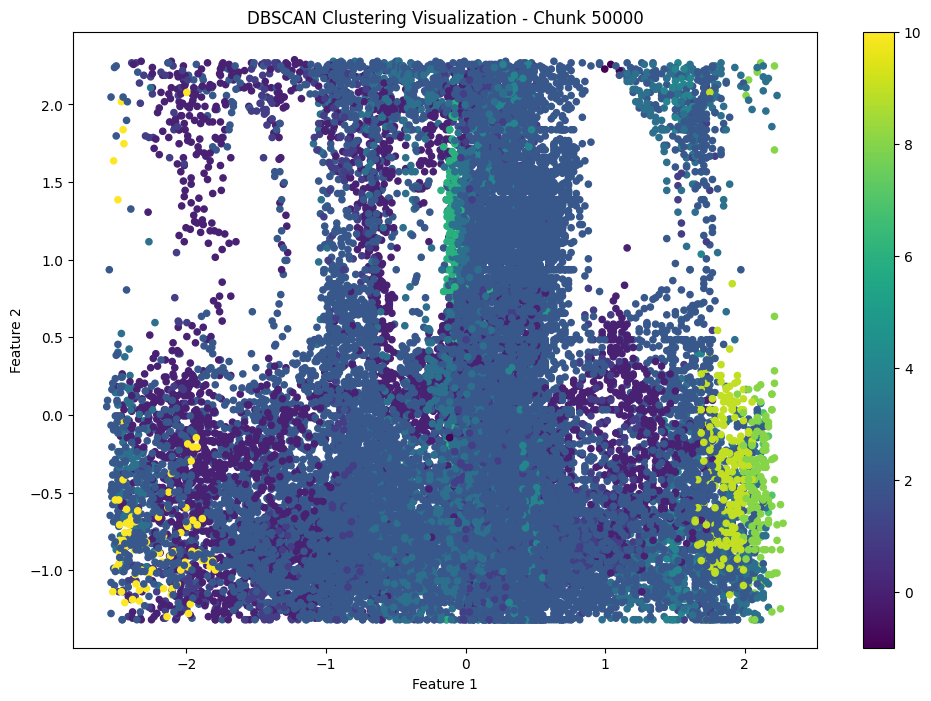

Number of clusters in Chunk 75000: 9


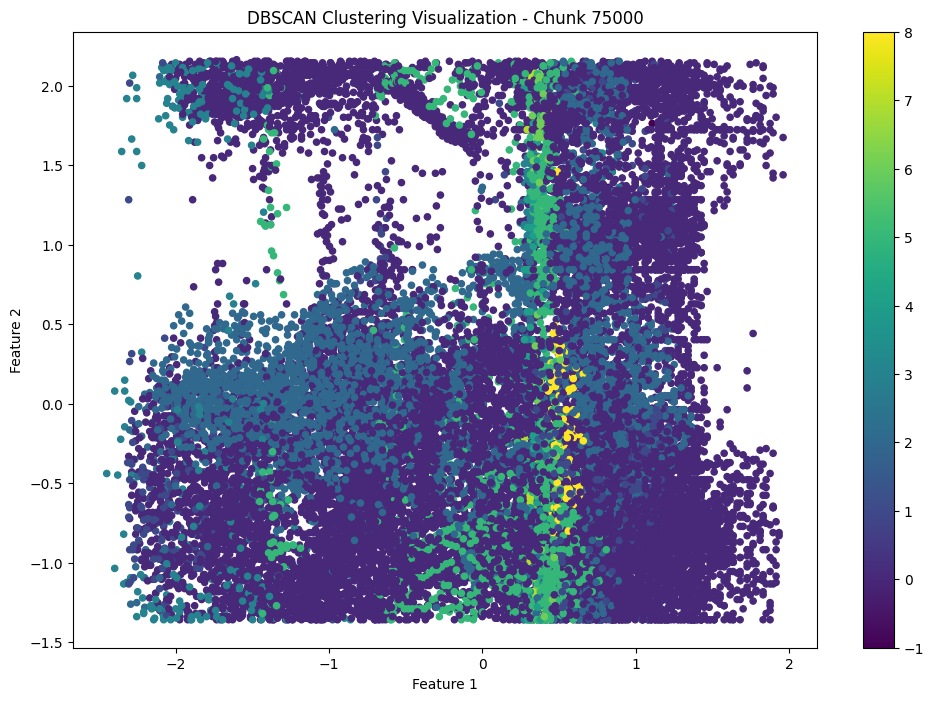

Number of clusters in Chunk 100000: 14


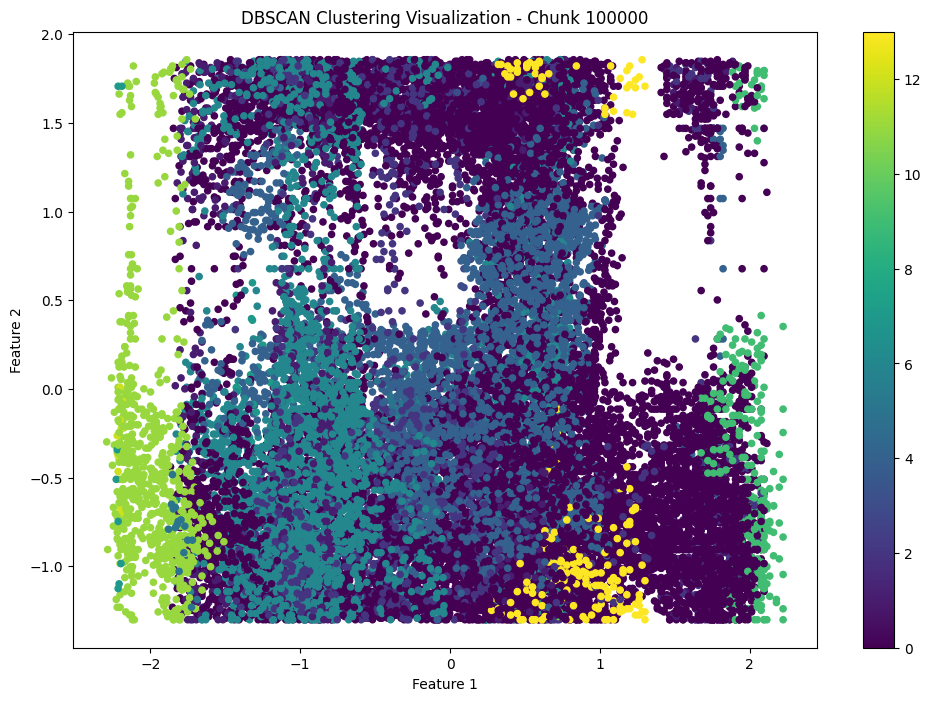

Number of clusters in Chunk 125000: 11


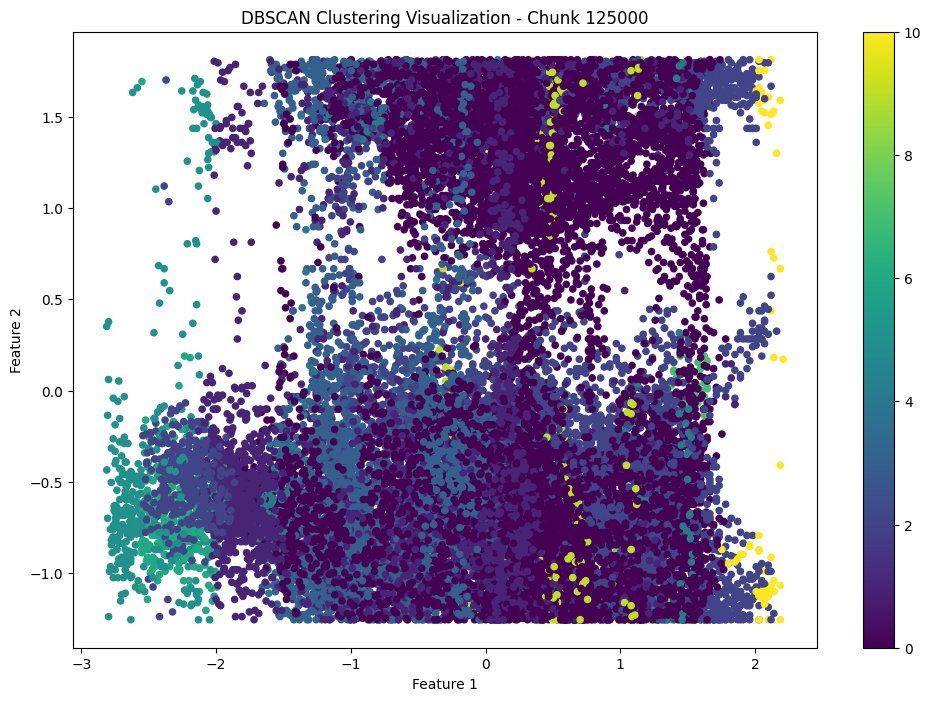

Number of clusters in Chunk 150000: 11


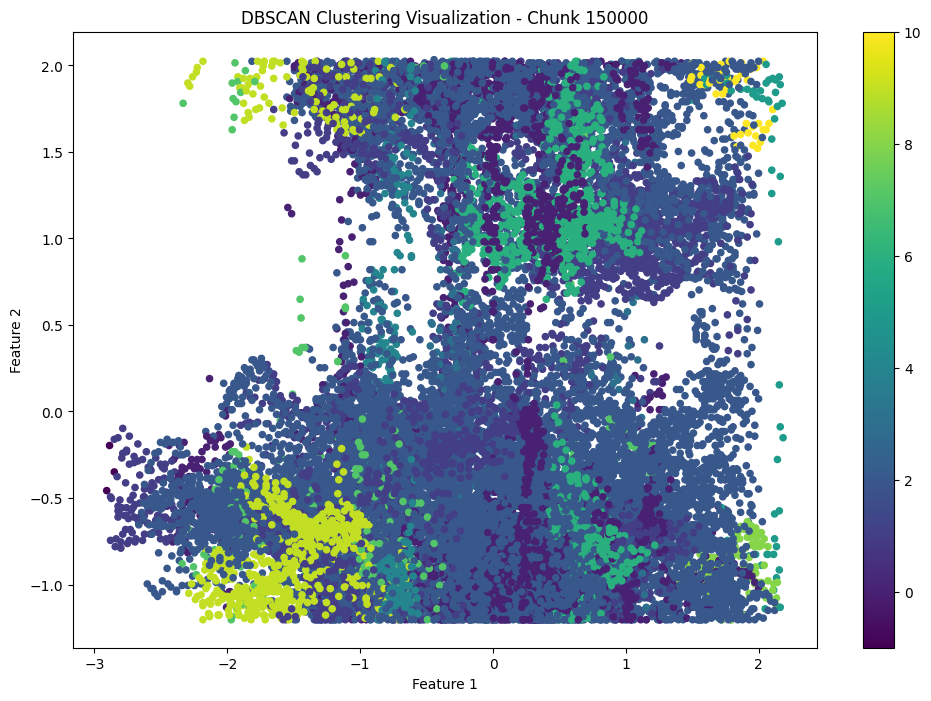

Number of clusters in Chunk 175000: 13


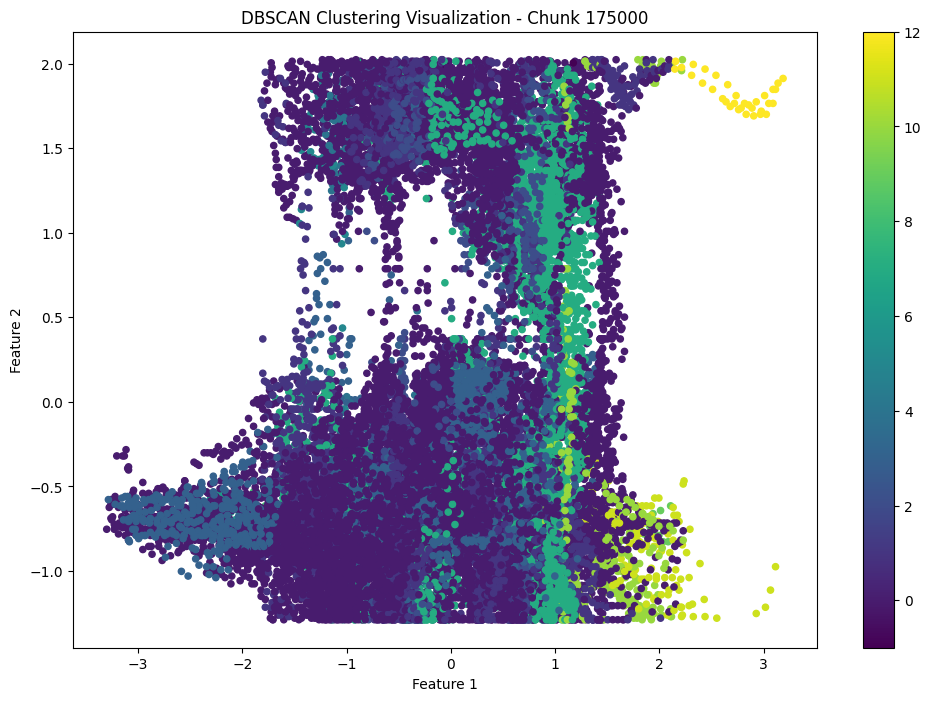

Number of clusters in Chunk 200000: 24


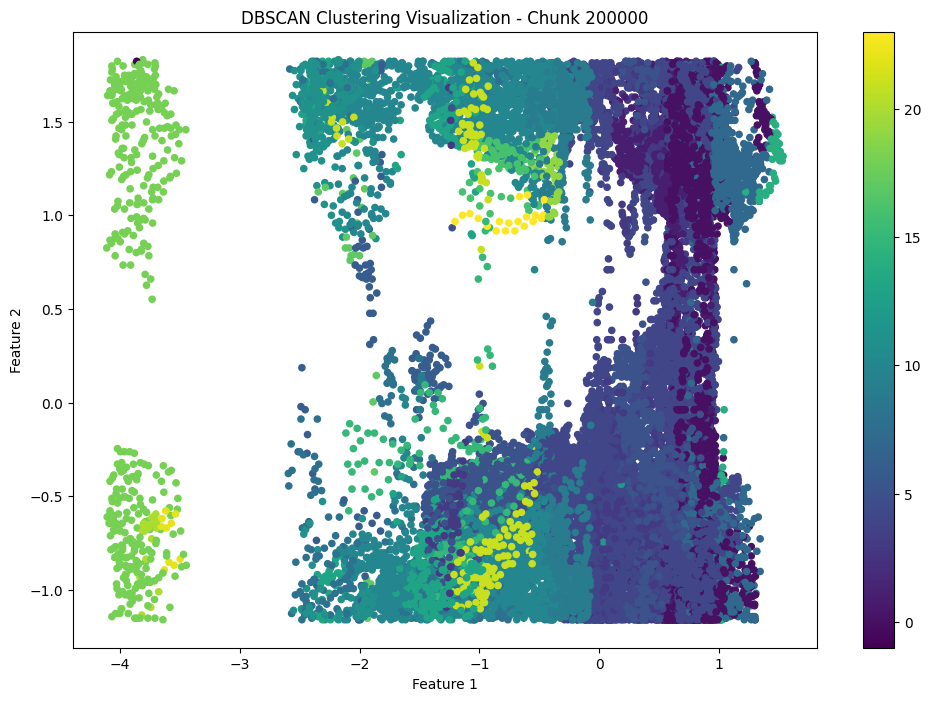

Number of clusters in Chunk 225000: 28


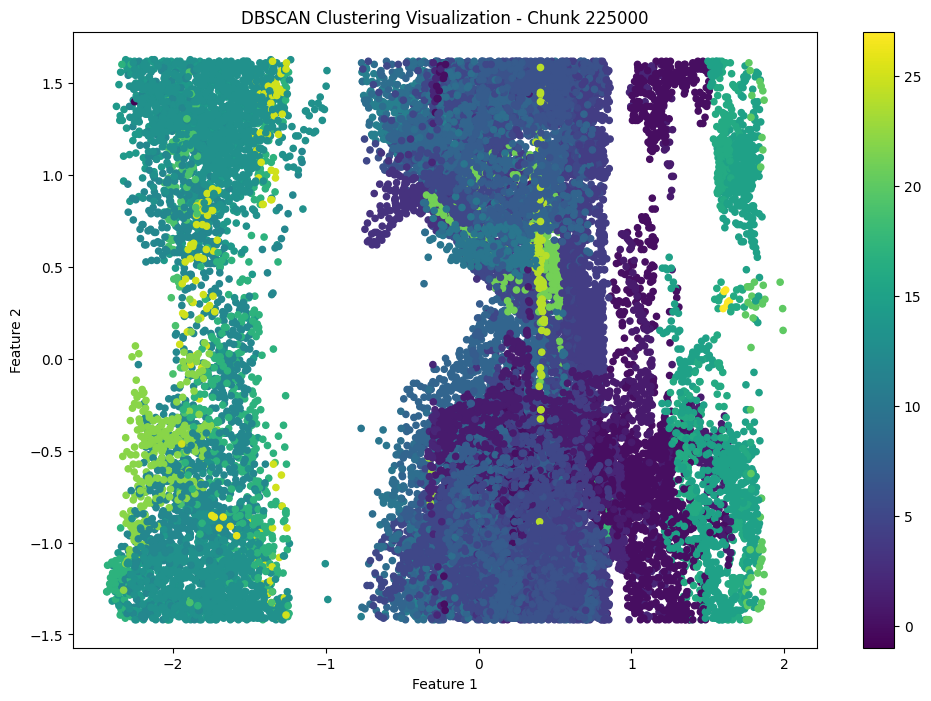

Number of clusters in Chunk 250000: 31


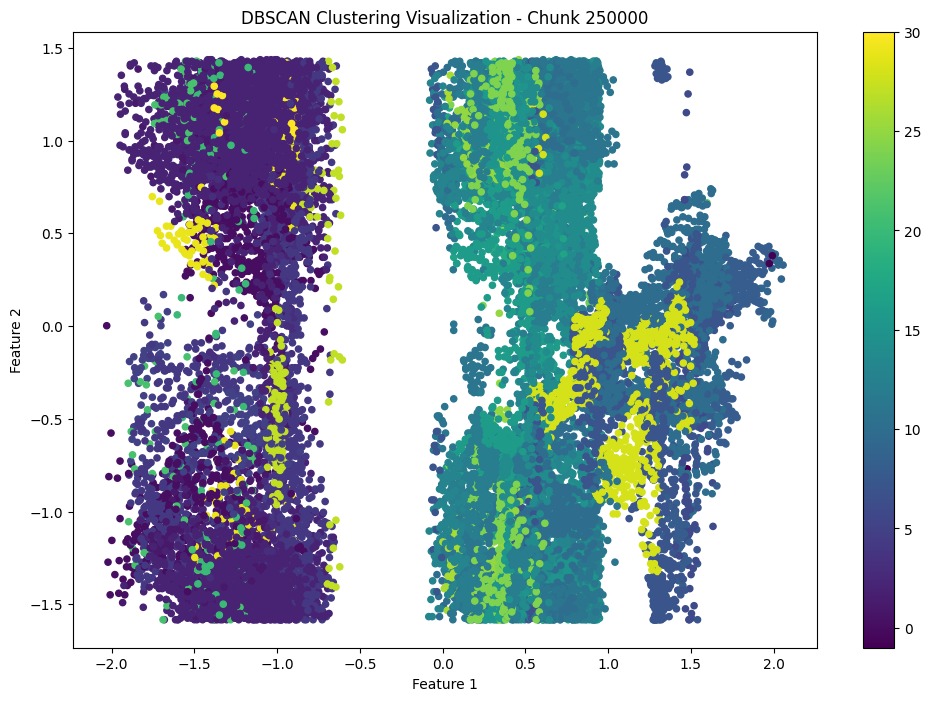

Number of clusters in Chunk 275000: 29


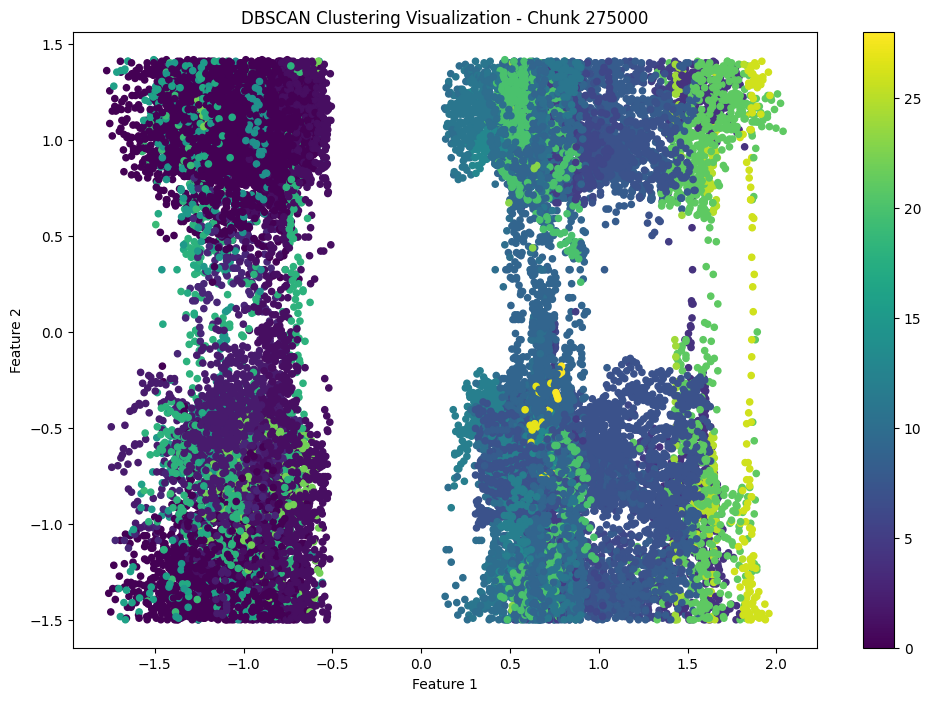

Number of clusters in Chunk 300000: 31


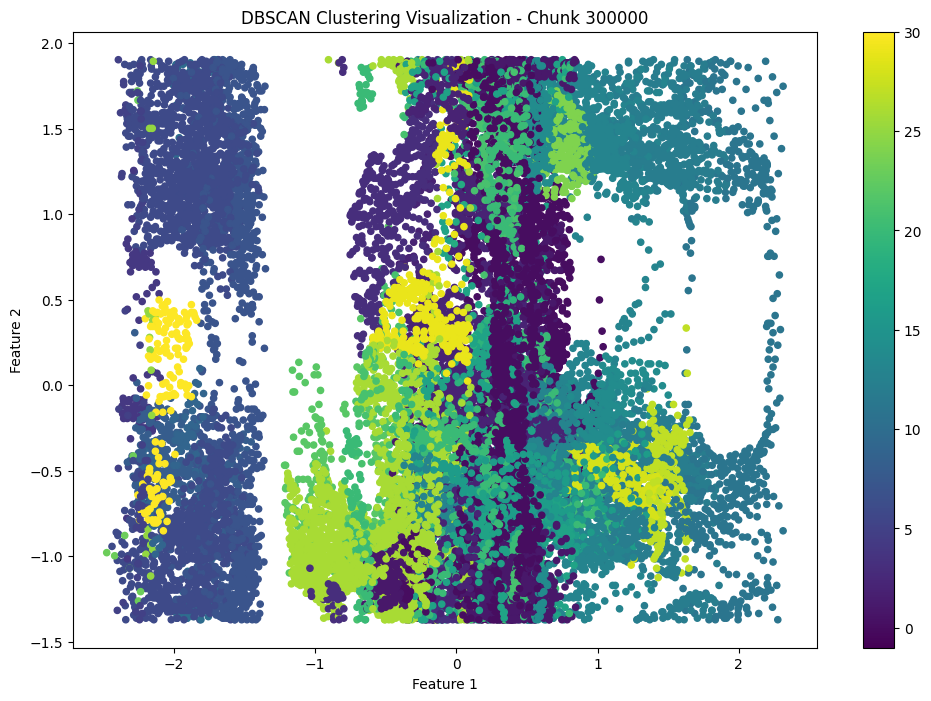

Number of clusters in Chunk 325000: 33


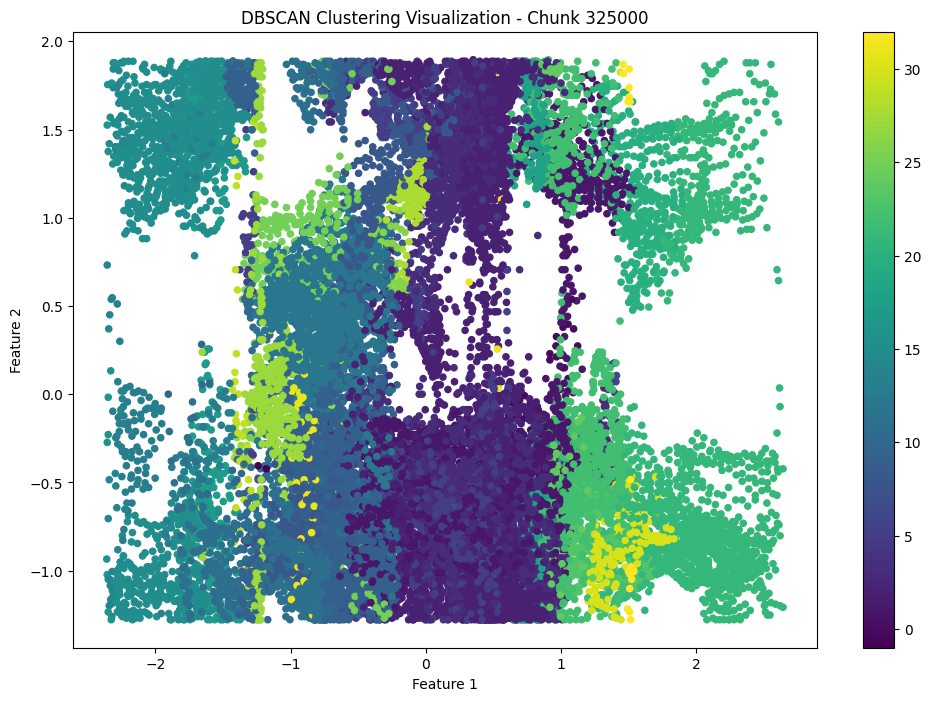

Number of clusters in Chunk 350000: 31


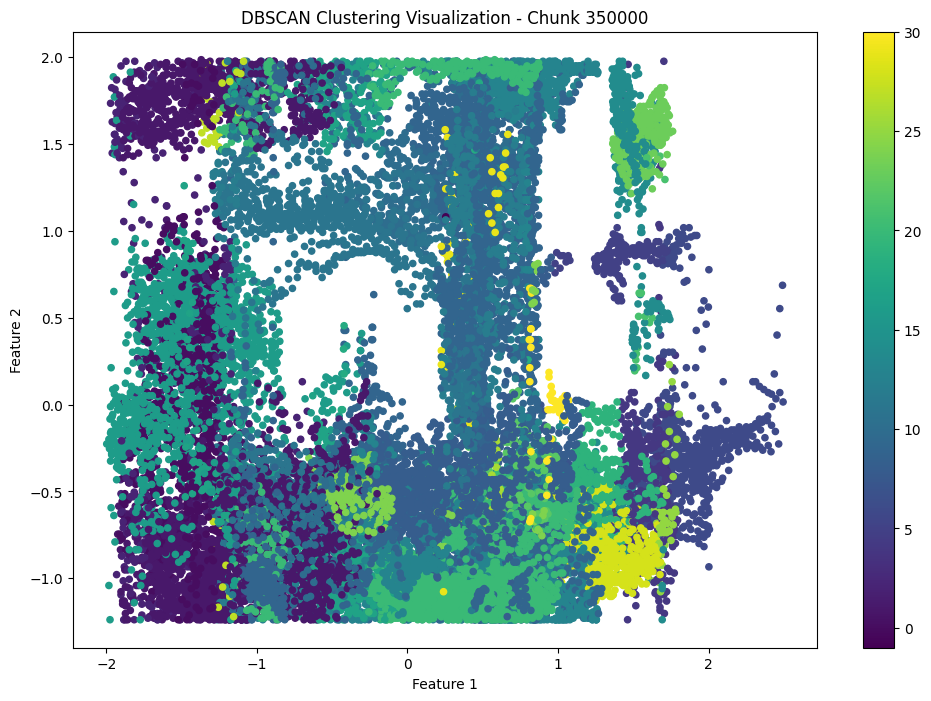

Number of clusters in Chunk 375000: 29


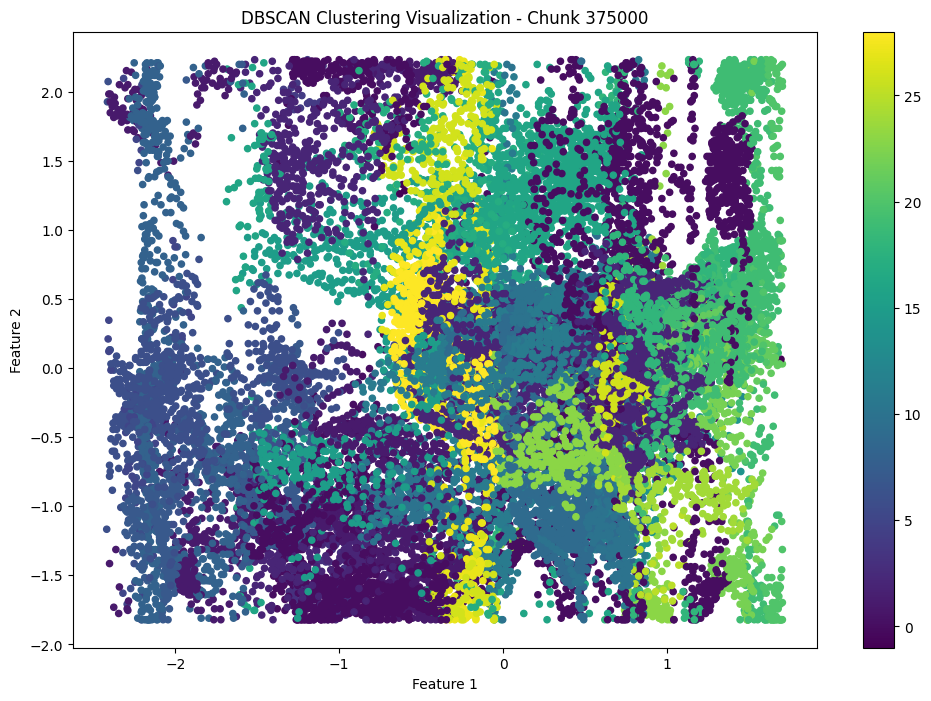

Number of clusters in Chunk 400000: 27


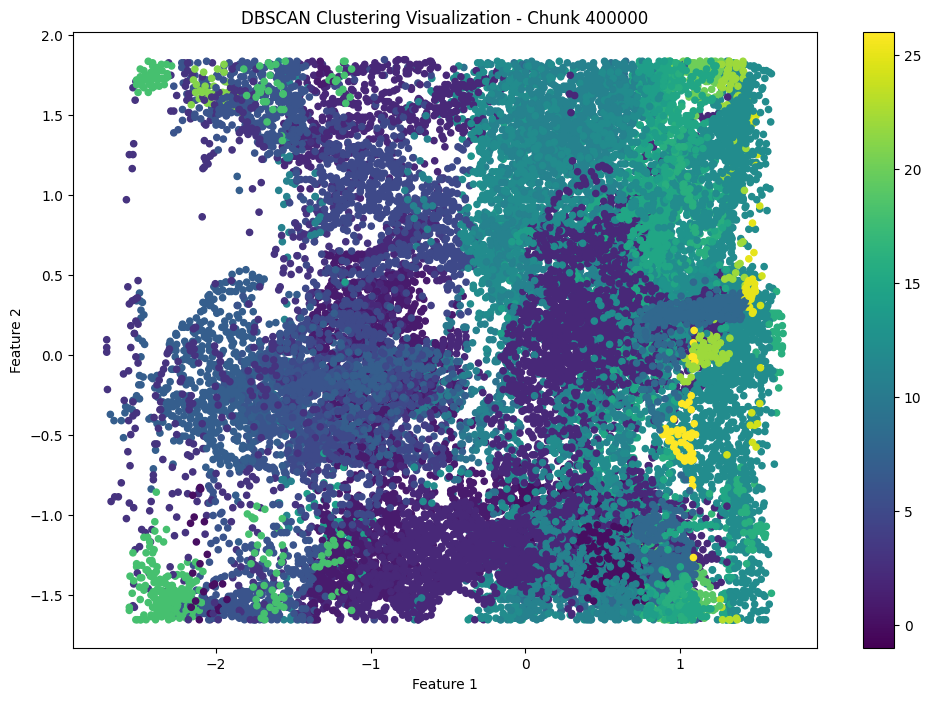

Number of clusters in Chunk 425000: 22


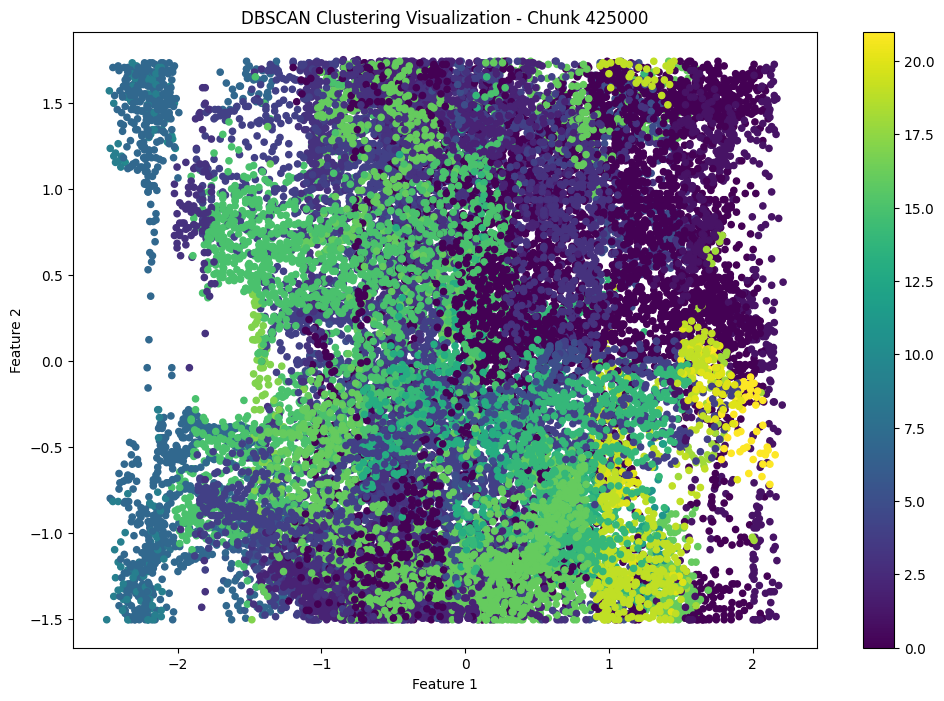

Number of clusters in Chunk 450000: 25


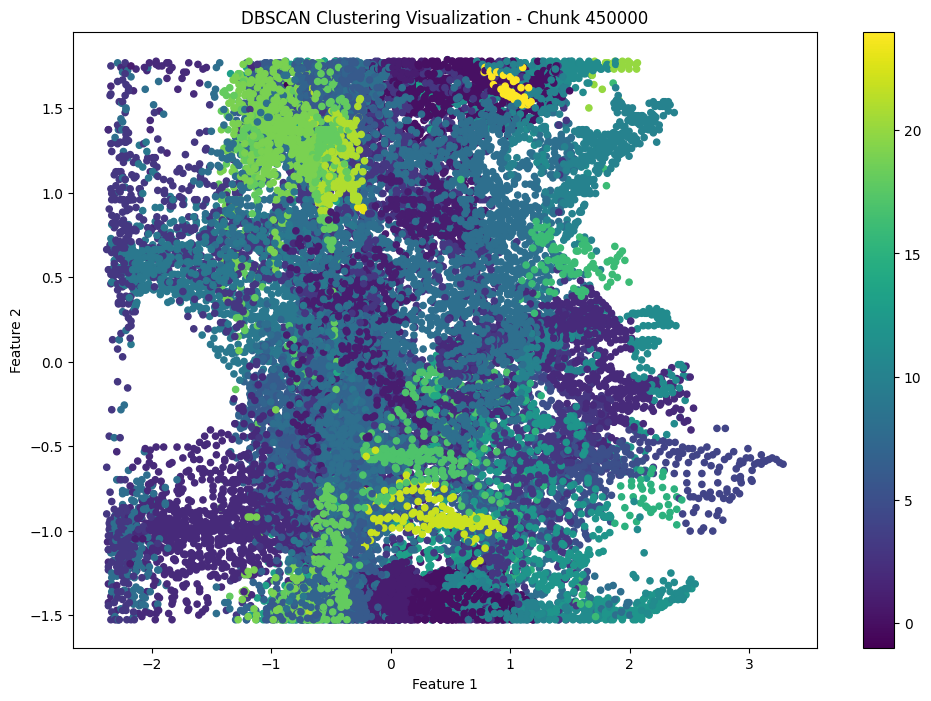

Number of clusters in Chunk 475000: 32


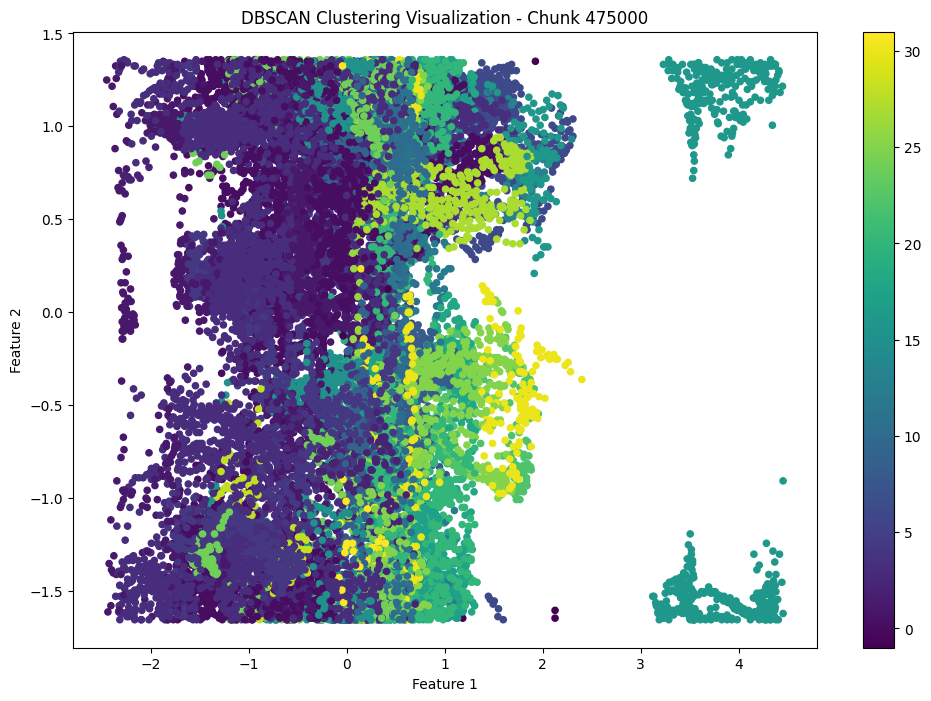

Number of clusters in Chunk 500000: 29


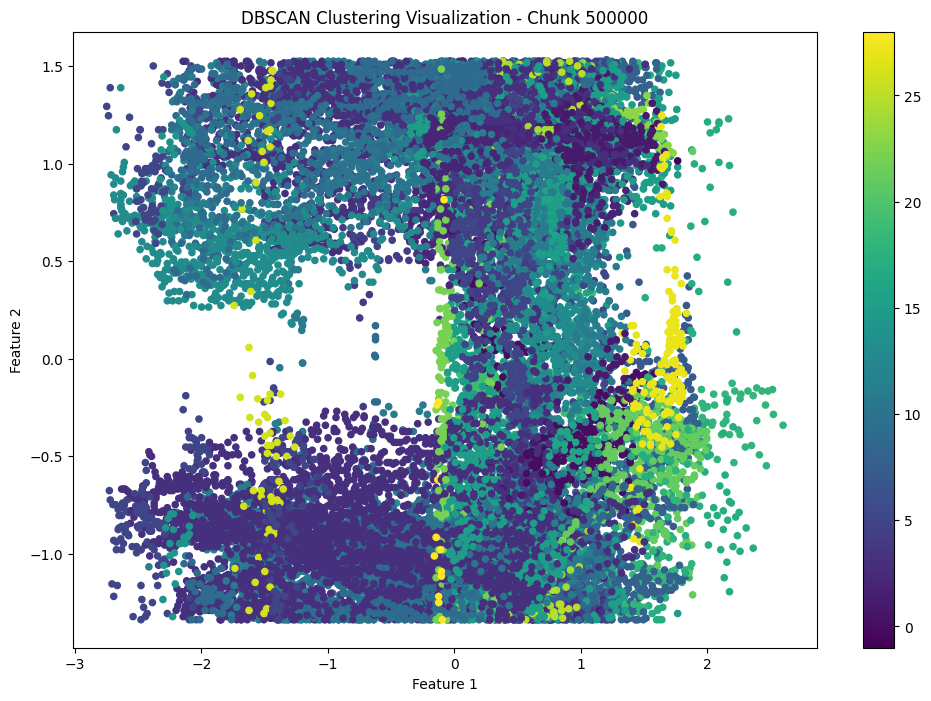

Number of clusters in Chunk 525000: 26


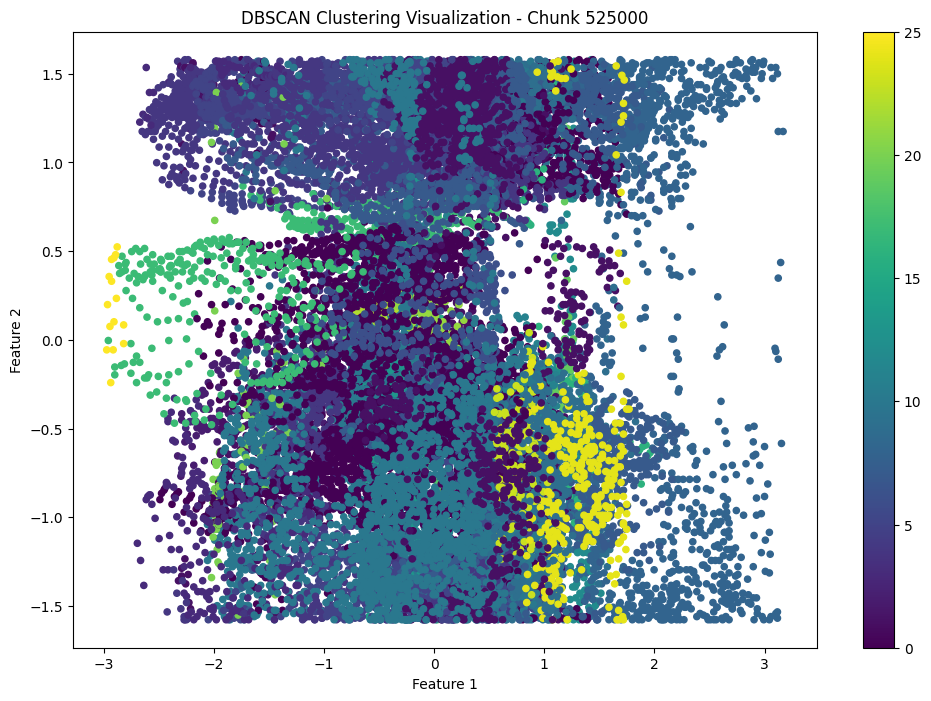

Number of clusters in Chunk 550000: 29


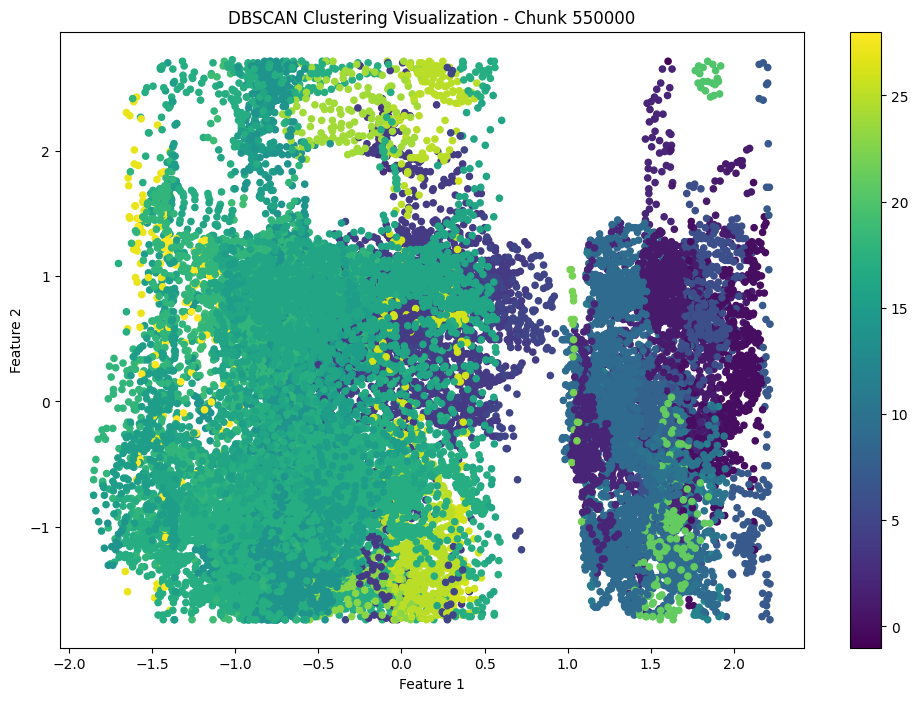

Number of clusters in Chunk 575000: 6


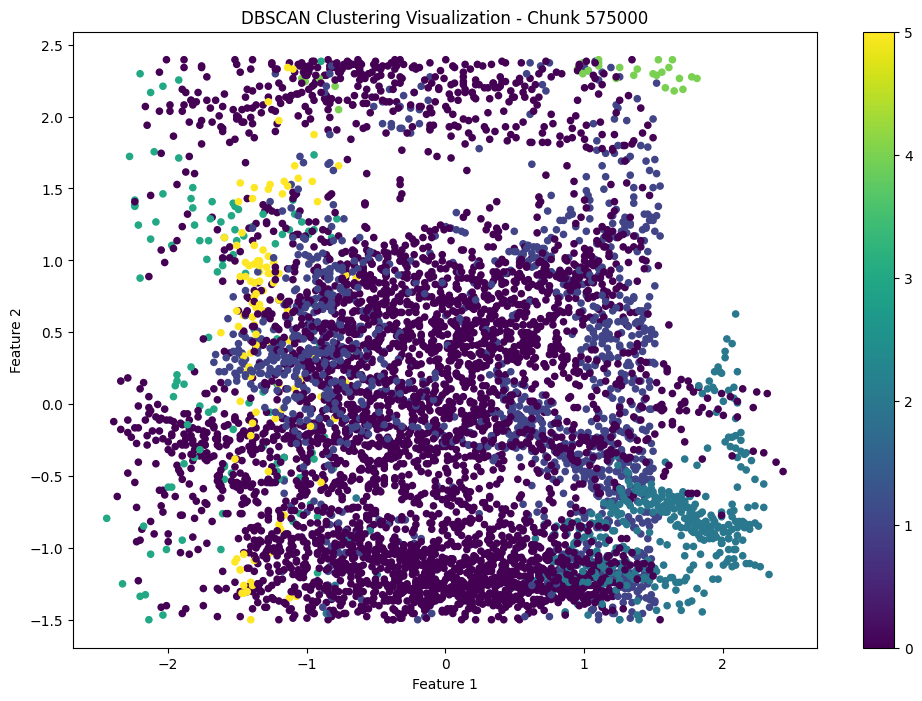

In [ ]:
# Rename dataset
covtype = fdata

# Put the dataset into a Pandas DataFrame
df = pd.DataFrame(covtype.data, columns=covtype.feature_names)
df['target'] = covtype.target

# Specify the chunk size
chunk_size = 25000

# Create a while loop to process the dataset in chunks
start_index = 0
while start_index < len(df):
    end_index = start_index + chunk_size
    chunk = df.iloc[start_index:end_index]

    X = chunk.drop(['target'], axis='columns')

    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Initialize DBSCAN model
    dbscan = DBSCAN(eps=3.1, min_samples=5) #eps level amended during evaluation process

    # Fit the model on the current chunk
    labels = dbscan.fit_predict(X_scaled)

    # Count the number of clusters formed (excluding noise label)
    unique_labels = set(labels)
    num_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
    print(f'Number of clusters in Chunk {start_index}: {num_clusters}')

    # Visualize the clusters for the current chunk
    plt.figure(figsize=(12, 8))
    plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=labels, cmap='viridis', s=20)
    plt.title('DBSCAN Clustering Visualization - Chunk {}'.format(start_index))
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.colorbar()
    plt.show()

    # Move to the next chunk
    start_index = end_index

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (Stack Overflow, 2017) ##
##############################################################

##### Gaussian Mixture Model (GMM)

In [ ]:
# Set a fixed random seed
np.random.seed(42)

# Rename dataset
covtype = fdata
data = covtype.data

# Feature scaling using MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(data)
scaled_data = scaler.transform(data)

# Dimensionality reduction using PCA
pca = PCA(n_components=2)
X_principal = pca.fit_transform(scaled_data)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

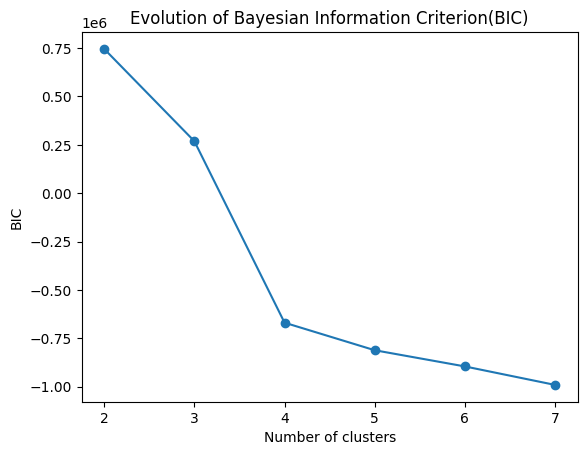

Optimal number of clusters: 7


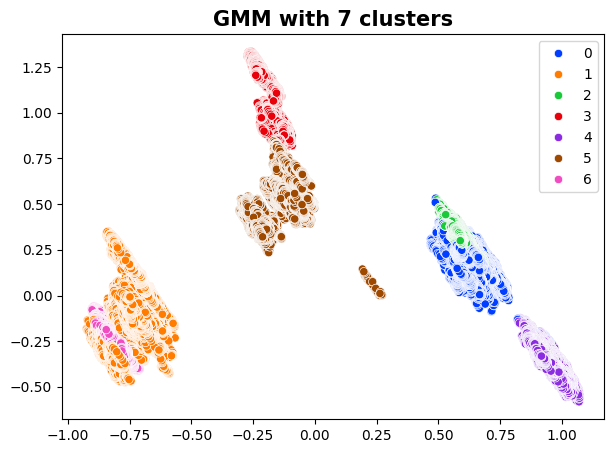

In [ ]:
# Evaluate k with BIC
n_clusters = range(2, 8)
bic = []

for k in n_clusters:
    gmm_model = GaussianMixture(n_components=k, covariance_type='spherical', random_state=42)
    gmm_model.fit(X_principal)
    bic.append(gmm_model.bic(X_principal))

# Plot BIC values
plt.figure()
plt.title("Evolution of Bayesian Information Criterion(BIC)")
plt.plot(n_clusters, bic, marker='o')
plt.ylabel("BIC")
plt.xlabel("Number of clusters")
plt.xticks(n_clusters)
plt.show()

# Optimal number of clusters based on BIC
optimal_clusters = np.argmin(bic) + 2  # Add 2 because range starts from 2
print("Optimal number of clusters:", optimal_clusters)

# Apply Gaussian Mixture with fixed random seed and other parameters
gmm_model = GaussianMixture(n_components=optimal_clusters, covariance_type='spherical', random_state=42)
gmm_model.fit(scaled_data)
pred = gmm_model.predict(scaled_data)

# Visualize the data to show clusters
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)
plt.figure(figsize=(7, 5))
sns.scatterplot(hue=pred, x=pca_result[:, 0], y=pca_result[:, 1], palette="bright")
plt.title("GMM with {} clusters".format(optimal_clusters), fontsize=15, fontweight="bold")
plt.show()

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

##### Hierarchical

In [ ]:
data = fdata.data

In [ ]:
#Define clustering function
def hierarchical_clustering(data, num_clusters, method):
    h_clustering = AgglomerativeClustering(n_clusters=num_clusters, linkage=best_linkage)
    clusters = h_clustering.fit_predict(data)
    return clusters

In [ ]:
#Batch data to avoid RAM issues
batch_size = len(data) // 20  # Can be adjusted but doesn't run on less than 17. 20 used to ensure there are reduce issues with RAM.
batches = [data[i:i + batch_size] for i in range(0, len(data), batch_size)]

In [ ]:
#Find best linkage method
linkage_methods = ['ward', 'complete', 'average', 'single']

best_score = -1
best_linkage = None

for batch in batches:
    for method in linkage_methods:
        clustering = AgglomerativeClustering(n_clusters=2, linkage=method) #error message if clusters are higher than 2 (more clusters than there are samples in your data)
        clustering.fit(batch)

        # Calc. silhouette score
        labels = clustering.labels_
        silhouette = silhouette_score(batch, labels)

        # Print the silhouette score for each method
        print(f"Linkage method: {method}, Silhouette score: {silhouette}")

        # Update the best linkage method if necessary
        if silhouette > best_score:
            best_score = silhouette
            best_linkage = method

print(f"\nBest linkage method: {best_linkage} with silhouette score: {best_score}")

##########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
##########################################

Linkage method: ward, Silhouette score: 0.49900628604744274
Linkage method: complete, Silhouette score: 0.46787159592146793
Linkage method: average, Silhouette score: 0.505864329894453
Linkage method: single, Silhouette score: 0.05104313731267851
Linkage method: ward, Silhouette score: 0.422122726544642
Linkage method: complete, Silhouette score: 0.4125367740838928
Linkage method: average, Silhouette score: 0.4189500543714396
Linkage method: single, Silhouette score: -0.2405947676482045
Linkage method: ward, Silhouette score: 0.5224531690147469
Linkage method: complete, Silhouette score: 0.5602028260679686
Linkage method: average, Silhouette score: 0.5709398924781514
Linkage method: single, Silhouette score: 0.003491449525003971
Linkage method: ward, Silhouette score: 0.46020767135915985
Linkage method: complete, Silhouette score: 0.3755015599150726
Linkage method: average, Silhouette score: 0.435668582613467
Linkage method: single, Silhouette score: -0.18200165931760745
Linkage method

In [ ]:
forestdata = fdata.data
scaler = StandardScaler()
forestdata_scaled = scaler.fit_transform(forestdata)

pca = PCA(n_components=0.95) #explain 95% of variance
forestdata_pca = pca.fit_transform(forestdata_scaled)

In [ ]:
#Run different metrics using the best linkage method
for i, batch in enumerate(batches, start=1):
    batch_scaled = scaler.transform(batch)
    batch_pca = pca.transform(batch_scaled)

    # Hierarchical clustering for different metrics
    hc_euclidean = hierarchical_clustering(batch_pca, 2, 'euclidean')
    hc_manhattan = hierarchical_clustering(batch_pca, 2, 'manhattan')
    hc_cosine = hierarchical_clustering(batch_pca, 2, 'cosine')

##### K-Means

**Intitial medthod and Parameter utilised**
*   Scaling: StandardScaler
*   Dimensionality Reduction: PCA(n_components=2)
*   Batch Processing:num_batches = 20
    batch_KM = len(KM_pca) // num_batches
*  Clustering Algorithm: num_clusters = 3
    kmeans = KMeans(n_clusters=num_clusters)




In [ ]:
##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################


# Load the covtype dataset
covtype = fdata
X = covtype.data


labels_true_KM = covtype.target  # True labels of the data points

# Standardize the features using scaling
scaler = StandardScaler()
KM_scaled = scaler.fit_transform(X)

# Apply PCA with only 2 components for dimensionality reduction
n_components = 2
pca = PCA(n_components=n_components)
KM_pca = pca.fit_transform(KM_scaled)

# Define the desired number of batches and calculate the batch size
num_batches = 20
batch_KM = len(KM_pca) // num_batches

# Create lists to store evaluation metrics for each batch
silhouette_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
adjusted_rand_scores = []
adjusted_mutual_info_scores = []

# Process data in batches
for i in range(0, len(KM_pca), batch_KM ):
    # Select a batch
    KM_batch = KM_pca[i:i+batch_KM ]
    KM_labels_true_batch = labels_true_KM[i:i+batch_KM ]

########Apply KMeans with default parameters###########
    num_clusters = 3
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict( KM_batch)
#######################################################

    # Compute internal evaluation metrics
    silhouette_scores.append(silhouette_score(KM_batch, cluster_labels))
    calinski_harabasz_scores.append(calinski_harabasz_score(KM_batch, cluster_labels))
    davies_bouldin_scores.append(davies_bouldin_score(KM_batch, cluster_labels))

    # Compute external evaluation metrics
    adjusted_rand_scores.append(adjusted_rand_score(KM_labels_true_batch, cluster_labels))
    adjusted_mutual_info_scores.append(adjusted_mutual_info_score(KM_labels_true_batch, cluster_labels))
# Average evaluation metrics over all batches
silhouette_avg = np.mean(silhouette_scores)
calinski_harabasz_avg = np.mean(calinski_harabasz_scores)
davies_bouldin_avg = np.mean(davies_bouldin_scores)
adjusted_rand_avg = np.mean(adjusted_rand_scores)
adjusted_mutual_info_avg = np.mean(adjusted_mutual_info_scores)


# Create a list of lists containing the evaluation results
results_table = [
    ["Silhouette Score", silhouette_avg],
    ["Calinski-Harabasz Score", calinski_harabasz_avg],
    ["Davies-Bouldin Score", davies_bouldin_avg],
    ["Adjusted Rand Index", adjusted_rand_avg],
    ["Adjusted Mutual Information", adjusted_mutual_info_avg]
]

# Print the table
print(tabulate(results_table, headers=["Method 1 : Cluster3", "Average Score"], tablefmt="grid"))



###################################################################
##TGrinberg, R. (2022). K-Means Clustering in Python. Real Python.
##Available at: https://realpython.com/k-means-clustering-python/
##(Accessed: March 3, 2024).##
#####################################################################

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

+-----------------------------+-----------------+
| Method 1 : Cluster3         |   Average Score |
+=============================+=================+
| Silhouette Score            |        0.451519 |
+-----------------------------+-----------------+
| Calinski-Harabasz Score     |    30110.3      |
+-----------------------------+-----------------+
| Davies-Bouldin Score        |        0.810192 |
+-----------------------------+-----------------+
| Adjusted Rand Index         |        0.131259 |
+-----------------------------+-----------------+
| Adjusted Mutual Information |        0.168155 |
+-----------------------------+-----------------+


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


*   Scaling: MinMaxScaler

In [ ]:
##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################


# Load the covtype dataset
covtype = fdata
X = covtype.data


labels_true_KM2 = covtype.target  # True labels of the data points

# Standardize the features using scaling
scaler = MinMaxScaler()
KM2_scaled = scaler.fit_transform(X)

# Apply PCA with only 2 components for dimensionality reduction
n_components = 2
pca = PCA(n_components=n_components)
KM2_pca = pca.fit_transform(KM2_scaled)

# Define the desired number of batches and calculate the batch size
num_batches = 20
batch_KM2 = len(KM2_pca) // num_batches

# Create lists to store evaluation metrics for each batch
silhouette_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
adjusted_rand_scores = []
adjusted_mutual_info_scores = []

# Process data in batches
for i in range(0, len(KM2_pca), batch_KM2 ):
    # Select a batch
    KM2_batch = KM2_pca[i:i+batch_KM ]
    KM2_labels_true_batch = labels_true_KM2[i:i+batch_KM2 ]

    # Apply KMeans with default parameters
    num_clusters = 3
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels2 = kmeans.fit_predict( KM2_batch)

    # Compute internal evaluation metrics
    silhouette_scores.append(silhouette_score(KM2_batch, cluster_labels2))
    calinski_harabasz_scores.append(calinski_harabasz_score(KM2_batch, cluster_labels2))
    davies_bouldin_scores.append(davies_bouldin_score(KM2_batch, cluster_labels2))

    # Compute external evaluation metrics
    adjusted_rand_scores.append(adjusted_rand_score(KM2_labels_true_batch, cluster_labels2))
    adjusted_mutual_info_scores.append(adjusted_mutual_info_score(KM2_labels_true_batch, cluster_labels2))
# Average evaluation metrics over all batches
silhouette_avg = np.mean(silhouette_scores)
calinski_harabasz_avg = np.mean(calinski_harabasz_scores)
davies_bouldin_avg = np.mean(davies_bouldin_scores)
adjusted_rand_avg = np.mean(adjusted_rand_scores)
adjusted_mutual_info_avg = np.mean(adjusted_mutual_info_scores)


# Create a list of lists containing the evaluation results
results_table2 = [
    ["Silhouette Score", silhouette_avg],
    ["Calinski-Harabasz Score", calinski_harabasz_avg],
    ["Davies-Bouldin Score", davies_bouldin_avg],
    ["Adjusted Rand Index", adjusted_rand_avg],
    ["Adjusted Mutual Information", adjusted_mutual_info_avg]
]

# Print the table
print(tabulate(results_table2, headers=["Result Method 2", "Average Score"], tablefmt="grid"))



###################################################################
##TGrinberg, R. (2022). K-Means Clustering in Python. Real Python.
##Available at: https://realpython.com/k-means-clustering-python/
##(Accessed: March 3, 2024).##
#####################################################################

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

+-----------------------------+-----------------+
| Result Method 2             |   Average Score |
+=============================+=================+
| Silhouette Score            |        0.692238 |
+-----------------------------+-----------------+
| Calinski-Harabasz Score     |   240313        |
+-----------------------------+-----------------+
| Davies-Bouldin Score        |        0.438179 |
+-----------------------------+-----------------+
| Adjusted Rand Index         |        0.133009 |
+-----------------------------+-----------------+
| Adjusted Mutual Information |        0.168898 |
+-----------------------------+-----------------+


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**The elbow methods for optimised K means**

In [ ]:
cluster_labels

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [ ]:
standardized_covtype1

array([[-1.29780509, -0.93515698, -1.48281978, ..., -0.16595612,
        -0.15601398, -0.12365355],
       [-1.31923485, -0.89047967, -1.61636259, ..., -0.16595612,
        -0.15601398, -0.12365355],
       [-0.5549068 , -0.14883628, -0.68156292, ..., -0.16595612,
        -0.15601398, -0.12365355],
       ...,
       [-2.04784663,  0.02987297,  0.38677957, ..., -0.16595612,
        -0.15601398, -0.12365355],
       [-2.05498988,  0.12816306,  0.11969395, ..., -0.16595612,
        -0.15601398, -0.12365355],
       [-2.05856151,  0.08348575, -0.14739167, ..., -0.16595612,
        -0.15601398, -0.12365355]])

In [ ]:

def optimise_k_means(standardized_cover1, max_k):
    means = []
    inertias = []

    for k in range(1, max_k):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(standardized_covtype1)

        means.append(k)
        inertias.append(kmeans.inertia_)

    # Generate the elbow plot
    plt.figure(figsize=(10, 5))
    plt.plot(means, inertias, 'o-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal K')
    plt.show()


###################################################################
##TGrinberg, R. (2022). K-Means Clustering in Python. Real Python.
##Available at: https://realpython.com/k-means-clustering-python/
##(Accessed: March 3, 2024).##
#####################################################################

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

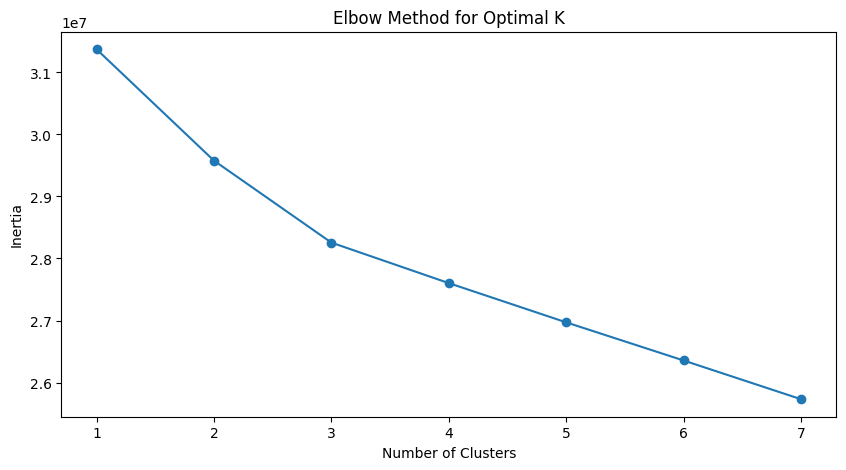

In [ ]:
# Define the value for max_k
max_k = 8  # You can choose any appropriate value

# Assume standardized_cover1 is defined
optimise_k_means(standardized_covtype1, max_k)


The elbow plot above shows that **inertia(sum of the squared distances to the nearest cluster center)** decreases as we incrase the number of cluster. We can see that there is a big change in the inertia and slope from 2 clusters onwards

**Method2: Clusters2 have a better score**

In [ ]:
# Create a dictionary to hold the evaluation results
results_dict2 = {
    "Metric": ["Silhouette Score", "Calinski-Harabasz Score", "Davies-Bouldin Score", "Adjusted Rand Index", "Adjusted Mutual Information"],
    "Average Score": [silhouette_avg, calinski_harabasz_avg, davies_bouldin_avg, adjusted_rand_avg, adjusted_mutual_info_avg]
}

# Create a DataFrame from the dictionary
results_df2 = pd.DataFrame(results_dict2)

# Print the DataFrame
print("Method2: Cluster3:")
print(results_df2)

###################################################################
##TGrinberg, R. (2022). K-Means Clustering in Python. Real Python.
##Available at: https://realpython.com/k-means-clustering-python/
##(Accessed: March 3, 2024).##
#####################################################################

Method2: Cluster3:
                        Metric  Average Score
0             Silhouette Score       0.692212
1      Calinski-Harabasz Score  240319.559475
2         Davies-Bouldin Score       0.438161
3          Adjusted Rand Index       0.133058
4  Adjusted Mutual Information       0.168913


##### Mean Shift

In [ ]:
forestdata = fdata.data

# Standardise the features using scaling. Standard Scaler has been chosen.
scaler = StandardScaler()
forestdata_scaled = scaler.fit_transform(forestdata)

# Apply PCA with only 2 components for more robust dimensionality reduction
n_components = 2
pca = PCA(n_components=n_components)
forestdata_pca = pca.fit_transform(forestdata_scaled)

# Define the desired number of batches, calculate the batch size and split data into exactly 20 equal batches
ms_num_batches = 20
ms_batch_size = len(forestdata) // ms_num_batches
ms_batches = [forestdata[i:i + ms_batch_size] for i in range(0, len(forestdata), ms_batch_size)][:ms_num_batches]

# Create a list to store cluster_centers for each batch
ms_batch_cluster_centers = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Fit the Mean Shift algorithm with set parameters.
for i, batch in enumerate(ms_batches):
    ms_batch_scaled = scaler.transform(batch)
    batch_pca = pca.transform(ms_batch_scaled)
    ms = MeanShift(bandwidth=3, bin_seeding=True, max_iter=300)
    ms.fit(batch_pca)

    # Store cluster labels and centers for the current batch and print
    ms_batch_labels = ms.labels_
    ms_batch_centers = ms.cluster_centers_
    ms_batch_cluster_centers.append(ms_batch_centers)

    print(f"Number of clusters for Batch {i + 1}: {len(np.unique(ms_batch_labels))}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################


Number of clusters for Batch 1: 1
Number of clusters for Batch 2: 1
Number of clusters for Batch 3: 1
Number of clusters for Batch 4: 1
Number of clusters for Batch 5: 1
Number of clusters for Batch 6: 1
Number of clusters for Batch 7: 1
Number of clusters for Batch 8: 1
Number of clusters for Batch 9: 2
Number of clusters for Batch 10: 2
Number of clusters for Batch 11: 1
Number of clusters for Batch 12: 1
Number of clusters for Batch 13: 1
Number of clusters for Batch 14: 1
Number of clusters for Batch 15: 1
Number of clusters for Batch 16: 1
Number of clusters for Batch 17: 1
Number of clusters for Batch 18: 1
Number of clusters for Batch 19: 1
Number of clusters for Batch 20: 1


### **Evaluation Code**

##### Agglomerative

In [ ]:
#####MODEL 1 = 2 CLUSTERS#####

#Define agg_clustering with 2 clusters, default metric and average linkage
def agg_clustering(data, num_clusters, metric='euclidean', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod1_sc = []
agg_mod1_db = []
agg_mod1_ch = []
agg_mod1_ari = []
agg_mod1_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'euclidean', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod1_sc.append(agg_silhouette)
    agg_mod1_db.append(agg_davies_bouldin)
    agg_mod1_ch.append(agg_calinski_harabasz)
    agg_mod1_ari.append(agg_adj_rand)
    agg_mod1_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod1_sc = sum(agg_mod1_sc) / len(agg_mod1_sc)
mean_agg_mod1_db = sum(agg_mod1_db) / len(agg_mod1_db)
mean_agg_mod1_ch = sum(agg_mod1_ch) / len(agg_mod1_ch)
mean_agg_mod1_ari = sum(agg_mod1_ari) / len(agg_mod1_ari)
mean_agg_mod1_ami = sum(agg_mod1_ami) / len(agg_mod1_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod1_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod1_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod1_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod1_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod1_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.4881387073432231
Overall Mean Davies-Bouldin Index: 0.6156242094783188
Overall Mean Calinski-Harabasz Index: 12331.234741733522
Overall Mean Adjusted Rand Index: 0.07199023908983118
Overall Mean Adjusted Mutual Information: 0.1137194126982981


In [ ]:
#####MODEL 2 = 3 CLUSTERS#####

#Define agg_clustering again this time with 3 clusters
def agg_clustering(data, num_clusters, metric='euclidean', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=3, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod2_sc = []
agg_mod2_db = []
agg_mod2_ch = []
agg_mod2_ari = []
agg_mod2_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 3, 'euclidean', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod2_sc.append(agg_silhouette)
    agg_mod2_db.append(agg_davies_bouldin)
    agg_mod2_ch.append(agg_calinski_harabasz)
    agg_mod2_ari.append(agg_adj_rand)
    agg_mod2_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod2_sc = sum(agg_mod2_sc) / len(agg_mod2_sc)
mean_agg_mod2_db = sum(agg_mod2_db) / len(agg_mod2_db)
mean_agg_mod2_ch = sum(agg_mod2_ch) / len(agg_mod2_ch)
mean_agg_mod2_ari = sum(agg_mod2_ari) / len(agg_mod2_ari)
mean_agg_mod2_ami = sum(agg_mod2_ami) / len(agg_mod2_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod2_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod2_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod2_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod2_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod2_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.4017179356344623
Overall Mean Davies-Bouldin Index: 0.683797368727902
Overall Mean Calinski-Harabasz Index: 12790.57894549107
Overall Mean Adjusted Rand Index: 0.09206335790385727
Overall Mean Adjusted Mutual Information: 0.14957249708695958


In [ ]:
#####MODEL 3 = 4 CLUSTERS#####

#Define agg_clustering again this time with 3 clusters
def agg_clustering(data, num_clusters, metric='euclidean', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=4, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod3_sc = []
agg_mod3_db = []
agg_mod3_ch = []
agg_mod3_ari = []
agg_mod3_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 4, 'euclidean', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod3_sc.append(agg_silhouette)
    agg_mod3_db.append(agg_davies_bouldin)
    agg_mod3_ch.append(agg_calinski_harabasz)
    agg_mod3_ari.append(agg_adj_rand)
    agg_mod3_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod3_sc = sum(agg_mod3_sc) / len(agg_mod3_sc)
mean_agg_mod3_db = sum(agg_mod3_db) / len(agg_mod3_db)
mean_agg_mod3_ch = sum(agg_mod3_ch) / len(agg_mod3_ch)
mean_agg_mod3_ari = sum(agg_mod3_ari) / len(agg_mod3_ari)
mean_agg_mod3_ami = sum(agg_mod3_ami) / len(agg_mod3_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod3_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod3_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod3_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod3_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod3_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.38051455496706466
Overall Mean Davies-Bouldin Index: 0.6891844890248595
Overall Mean Calinski-Harabasz Index: 15254.77367315631
Overall Mean Adjusted Rand Index: 0.11631783798329032
Overall Mean Adjusted Mutual Information: 0.16573728750278902


In [ ]:
###OPTIMAL CLUSTERS####

mean_silhouette = 0.4881387073432231
mean_davies_bouldin = 0.6156242094783188
mean_calinski_harabasz = 12331.234741733522
mean_adjusted_rand = 0.07199023908983118
mean_adjusted_mutual_info = 0.1137194126982981

print(f"The optimal number of clusters is 2")
print(f"Overall Mean Silhouette Score: {mean_silhouette}")
print(f"Overall Mean Davies-Bouldin Index: {mean_davies_bouldin}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_calinski_harabasz}")
print(f"Overall Mean Adjusted Rand Index: {mean_adjusted_rand}")
print(f"Overall Mean Adjusted Mutual Information: {mean_adjusted_mutual_info}")
print(f"It was chosen because it improves on the Silhouette and Davies Bouldin scores")
print(f"..other models have slightly better evaluation metric scores")

The optimal number of clusters is 2
Overall Mean Silhouette Score: 0.4881387073432231
Overall Mean Davies-Bouldin Index: 0.6156242094783188
Overall Mean Calinski-Harabasz Index: 12331.234741733522
Overall Mean Adjusted Rand Index: 0.07199023908983118
Overall Mean Adjusted Mutual Information: 0.1137194126982981
It was chosen because it improves on the Silhouette and Davies Bouldin scores
..other models have slightly better evaluation metric scores


In [ ]:
#####MODEL 4 = SINGLE LINKAGE #####

#Define agg_clustering again this time with single linkage
def agg_clustering(data, num_clusters, metric='euclidean', linkage_method='single', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod4_sc = []
agg_mod4_db = []
agg_mod4_ch = []
agg_mod4_ari = []
agg_mod4_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'euclidean', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod4_sc.append(agg_silhouette)
    agg_mod4_db.append(agg_davies_bouldin)
    agg_mod4_ch.append(agg_calinski_harabasz)
    agg_mod4_ari.append(agg_adj_rand)
    agg_mod4_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod4_sc = sum(agg_mod4_sc) / len(agg_mod4_sc)
mean_agg_mod4_db = sum(agg_mod4_db) / len(agg_mod4_db)
mean_agg_mod4_ch = sum(agg_mod4_ch) / len(agg_mod4_ch)
mean_agg_mod4_ari = sum(agg_mod4_ari) / len(agg_mod4_ari)
mean_agg_mod4_ami = sum(agg_mod4_ami) / len(agg_mod4_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod4_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod4_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod4_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod4_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod4_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.45361126334210794
Overall Mean Davies-Bouldin Index: 0.4055964202277796
Overall Mean Calinski-Harabasz Index: 18.327690859395698
Overall Mean Adjusted Rand Index: 3.114599867384315e-05
Overall Mean Adjusted Mutual Information: 0.00013769863898551094


In [ ]:
#####MODEL 5 = WARD LINKAGE #####

#Define agg_clustering again this time with ward linkage
def agg_clustering(data, num_clusters, metric='euclidean', linkage_method='ward', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod5_sc = []
agg_mod5_db = []
agg_mod5_ch = []
agg_mod5_ari = []
agg_mod5_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'euclidean', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod5_sc.append(agg_silhouette)
    agg_mod5_db.append(agg_davies_bouldin)
    agg_mod5_ch.append(agg_calinski_harabasz)
    agg_mod5_ari.append(agg_adj_rand)
    agg_mod5_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod5_sc = sum(agg_mod5_sc) / len(agg_mod5_sc)
mean_agg_mod5_db = sum(agg_mod5_db) / len(agg_mod5_db)
mean_agg_mod5_ch = sum(agg_mod5_ch) / len(agg_mod5_ch)
mean_agg_mod5_ari = sum(agg_mod5_ari) / len(agg_mod5_ari)
mean_agg_mod5_ami = sum(agg_mod5_ami) / len(agg_mod5_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod5_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod5_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod5_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod5_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod5_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.45541623534920533
Overall Mean Davies-Bouldin Index: 0.8475726739682768
Overall Mean Calinski-Harabasz Index: 26932.446484879612
Overall Mean Adjusted Rand Index: 0.1011444126183664
Overall Mean Adjusted Mutual Information: 0.1433622195848867


In [ ]:
#####MODEL 6 = COMPLETE LINKAGE #####

#Define agg_clustering again this time with complete linkage
def agg_clustering(data, num_clusters, metric='euclidean', linkage_method='complete', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod6_sc = []
agg_mod6_db = []
agg_mod6_ch = []
agg_mod6_ari = []
agg_mod6_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'euclidean', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod6_sc.append(agg_silhouette)
    agg_mod6_db.append(agg_davies_bouldin)
    agg_mod6_ch.append(agg_calinski_harabasz)
    agg_mod6_ari.append(agg_adj_rand)
    agg_mod6_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod6_sc = sum(agg_mod6_sc) / len(agg_mod6_sc)
mean_agg_mod6_db = sum(agg_mod6_db) / len(agg_mod6_db)
mean_agg_mod6_ch = sum(agg_mod6_ch) / len(agg_mod6_ch)
mean_agg_mod6_ari = sum(agg_mod6_ari) / len(agg_mod6_ari)
mean_agg_mod6_ami = sum(agg_mod6_ami) / len(agg_mod6_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod6_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod6_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod6_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod6_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod6_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.423550645432233
Overall Mean Davies-Bouldin Index: 0.8248895814963431
Overall Mean Calinski-Harabasz Index: 20018.427314152443
Overall Mean Adjusted Rand Index: 0.08426734829648087
Overall Mean Adjusted Mutual Information: 0.13247609737902907


In [ ]:
####OPTIMAL LINKAGE METHOD###

mean_silhouette = 0.4881387073432231
mean_davies_bouldin = 0.6156242094783188
mean_calinski_harabasz = 12331.234741733522
mean_adjusted_rand = 0.07199023908983118
mean_adjusted_mutual_info = 0.1137194126982981

print(f"The optimal paramter is linkage='average' (Model 1)")
print(f"Overall Mean Silhouette Score: {mean_silhouette}")
print(f"Overall Mean Davies-Bouldin Index: {mean_davies_bouldin}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_calinski_harabasz}")
print(f"Overall Mean Adjusted Rand Index: {mean_adjusted_rand}")
print(f"Overall Mean Adjusted Mutual Information: {mean_adjusted_mutual_info}")
print(f"It was chosen because it has the highest silhouette score and second  second lowest David Bouldin score.")
print(f"Certain models do perfom slightly higher with external evaluation metrics.")

The optimal paramter is linkage='average' (Model 1)
Overall Mean Silhouette Score: 0.4881387073432231
Overall Mean Davies-Bouldin Index: 0.6156242094783188
Overall Mean Calinski-Harabasz Index: 12331.234741733522
Overall Mean Adjusted Rand Index: 0.07199023908983118
Overall Mean Adjusted Mutual Information: 0.1137194126982981
It was chosen because it has the highest silhouette score and second  second lowest David Bouldin score.
Certain models do perfom slightly higher with external evaluation metrics.


In [ ]:
#####MODEL 7 = L2 DISTANCE METRIC#####

#Define agg_clustering again this time with L2 distance metric
def agg_clustering(data, num_clusters, metric='l2', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod7_sc = []
agg_mod7_db = []
agg_mod7_ch = []
agg_mod7_ari = []
agg_mod7_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'l2', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod7_sc.append(agg_silhouette)
    agg_mod7_db.append(agg_davies_bouldin)
    agg_mod7_ch.append(agg_calinski_harabasz)
    agg_mod7_ari.append(agg_adj_rand)
    agg_mod7_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod7_sc = sum(agg_mod7_sc) / len(agg_mod7_sc)
mean_agg_mod7_db = sum(agg_mod7_db) / len(agg_mod7_db)
mean_agg_mod7_ch = sum(agg_mod7_ch) / len(agg_mod7_ch)
mean_agg_mod7_ari = sum(agg_mod7_ari) / len(agg_mod7_ari)
mean_agg_mod7_ami = sum(agg_mod7_ami) / len(agg_mod7_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod7_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod7_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod7_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod7_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod7_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.4881387073432231
Overall Mean Davies-Bouldin Index: 0.6156242094783188
Overall Mean Calinski-Harabasz Index: 12331.234741733522
Overall Mean Adjusted Rand Index: 0.07199023908983118
Overall Mean Adjusted Mutual Information: 0.1137194126982981


In [ ]:
#####MODEL 8 = MANHATTAN DISTANCE METRIC#####

#Define agg_clustering again this time with manhattan distance metric
def agg_clustering(data, num_clusters, metric='manhattan', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info

agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod8_sc = []
agg_mod8_db = []
agg_mod8_ch = []
agg_mod8_ari = []
agg_mod8_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'manhattan', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod8_sc.append(agg_silhouette)
    agg_mod8_db.append(agg_davies_bouldin)
    agg_mod8_ch.append(agg_calinski_harabasz)
    agg_mod8_ari.append(agg_adj_rand)
    agg_mod8_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod8_sc = sum(agg_mod8_sc) / len(agg_mod8_sc)
mean_agg_mod8_db = sum(agg_mod8_db) / len(agg_mod8_db)
mean_agg_mod8_ch = sum(agg_mod8_ch) / len(agg_mod8_ch)
mean_agg_mod8_ari = sum(agg_mod8_ari) / len(agg_mod8_ari)
mean_agg_mod8_ami = sum(agg_mod8_ami) / len(agg_mod8_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod8_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod8_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod8_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod8_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod8_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################


Overall Mean Silhouette Score: 0.47697232082077823
Overall Mean Davies-Bouldin Index: 0.614791715435938
Overall Mean Calinski-Harabasz Index: 10721.37126292761
Overall Mean Adjusted Rand Index: 0.07459529908994397
Overall Mean Adjusted Mutual Information: 0.11204554629583303


In [ ]:
#####MODEL 9 = COSINE DISTANCE METRIC#####

#Define agg_clustering again this time with cosine distance metric
def agg_clustering(data, num_clusters, metric='cosine', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    #Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info


agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod9_sc = []
agg_mod9_db = []
agg_mod9_ch = []
agg_mod9_ari = []
agg_mod9_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'cosine', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod9_sc.append(agg_silhouette)
    agg_mod9_db.append(agg_davies_bouldin)
    agg_mod9_ch.append(agg_calinski_harabasz)
    agg_mod9_ari.append(agg_adj_rand)
    agg_mod9_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod9_sc = sum(agg_mod9_sc) / len(agg_mod9_sc)
mean_agg_mod9_db = sum(agg_mod9_db) / len(agg_mod9_db)
mean_agg_mod9_ch = sum(agg_mod9_ch) / len(agg_mod9_ch)
mean_agg_mod9_ari = sum(agg_mod9_ari) / len(agg_mod9_ari)
mean_agg_mod9_ami = sum(agg_mod9_ami) / len(agg_mod9_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod9_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod9_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod9_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod9_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod9_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################


Overall Mean Silhouette Score: 0.7381969630546528
Overall Mean Davies-Bouldin Index: 0.8078442702948992
Overall Mean Calinski-Harabasz Index: 10300.010889019895
Overall Mean Adjusted Rand Index: 0.055722016769028736
Overall Mean Adjusted Mutual Information: 0.09994116211199565


In [ ]:
#####MODEL 10 = L1 DISTANCE METRIC#####

#Define agg_clustering again this time with L1 distance metric
def agg_clustering(data, num_clusters, metric='l1', linkage_method='average', ground_truth=None):
    agg_cluster_model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage_method)
    agg_clusters = agg_cluster_model.fit_predict(data)
    agg_silhouette = silhouette_score(data, agg_clusters, metric=metric)
    agg_davies_bouldin = davies_bouldin_score(data, agg_clusters)
    agg_calinski_harabasz = calinski_harabasz_score(data, agg_clusters)

    # Calculate Adjusted Rand Index and Adjusted Mutual Information based off ground truth
    agg_adj_rand = adjusted_rand_score(ground_truth, agg_clusters) if ground_truth is not None else None
    agg_adj_mutual_info = adjusted_mutual_info_score(ground_truth, agg_clusters, average_method='arithmetic') if ground_truth is not None else None

    return agg_clusters, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info


agg_ground_truth_labels = fdata.target

# Save external as well as internal evaluation metrics in 5 new variables
agg_mod10_sc = []
agg_mod10_db = []
agg_mod10_ch = []
agg_mod10_ari = []
agg_mod10_ami = []

#Enumerate through the batches, apply scaling and dimensionality reduciton.
#Apply agg_clustering function and print and save evaluation metrics
for i, batch in enumerate(agg_batches):
    agg_batch_scaled = scaler.transform(batch)
    agg_batch_pca = pca.transform(agg_batch_scaled)

    _, agg_silhouette, agg_davies_bouldin, agg_calinski_harabasz, agg_adj_rand, agg_adj_mutual_info = agg_clustering(
        agg_batch_pca, 2, 'l1', ground_truth=agg_ground_truth_labels[i * agg_batch_size : (i + 1) * agg_batch_size]
    )

    agg_mod10_sc.append(agg_silhouette)
    agg_mod10_db.append(agg_davies_bouldin)
    agg_mod10_ch.append(agg_calinski_harabasz)
    agg_mod10_ari.append(agg_adj_rand)
    agg_mod10_ami.append(agg_adj_mutual_info)

# Compute the overall mean scores and print
mean_agg_mod10_sc = sum(agg_mod10_sc) / len(agg_mod10_sc)
mean_agg_mod10_db = sum(agg_mod10_db) / len(agg_mod10_db)
mean_agg_mod10_ch = sum(agg_mod10_ch) / len(agg_mod10_ch)
mean_agg_mod10_ari = sum(agg_mod10_ari) / len(agg_mod10_ari)
mean_agg_mod10_ami = sum(agg_mod10_ami) / len(agg_mod10_ami)
print(f"Overall Mean Silhouette Score: {mean_agg_mod10_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_agg_mod10_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_agg_mod10_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_agg_mod10_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_agg_mod10_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: 0.47697232082077823
Overall Mean Davies-Bouldin Index: 0.614791715435938
Overall Mean Calinski-Harabasz Index: 10721.37126292761
Overall Mean Adjusted Rand Index: 0.07459529908994397
Overall Mean Adjusted Mutual Information: 0.11204554629583303


In [ ]:
#####OPTIMAL MODEL#####

mean_silhouette = 0.7381969630546528
mean_davies_bouldin = 0.8078442702948992
mean_calinski_harabasz = 10300.010889019895
mean_adjusted_rand = 0.055722016769028736
mean_adjusted_mutual_info = 0.09994116211199565

print(f"The optimal model is Model 9 [n_clusters=2, linkage='average', metric='cosine']")
print(f"Overall Mean Silhouette Score: {mean_silhouette}")
print(f"Overall Mean Davies-Bouldin Index: {mean_davies_bouldin}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_calinski_harabasz}")
print(f"Overall Mean Adjusted Rand Index: {mean_adjusted_rand}")
print(f"Overall Mean Adjusted Mutual Information: {mean_adjusted_mutual_info}")
print(f"It was chosen because it has a much higher Silhouette score despite variances in other scores.")


The optimal model is Model 9 [n_clusters=2, linkage='average', metric='cosine']
Overall Mean Silhouette Score: 0.7381969630546528
Overall Mean Davies-Bouldin Index: 0.8078442702948992
Overall Mean Calinski-Harabasz Index: 10300.010889019895
Overall Mean Adjusted Rand Index: 0.055722016769028736
Overall Mean Adjusted Mutual Information: 0.09994116211199565
It was chosen because it has a much higher Silhouette score despite variances in other scores.


##### Balanced Iterative Reducing and Clustering using Hierarchies (BIRCH)

In [ ]:
results_df_birch

,PCA Components,Birch Clusters,Silhouette Score,Calinski-Harabasz Score,Davies-Bouldin Score,Adjusted Rand Score,Adjusted Mutual Info Score,Overall Score
0,0.90,5,-0.199161,13973.722199,2.009386,0.181143,0.268464,13975.982030
1,0.90,7,-0.202103,9420.933040,4.904030,0.181443,0.267434,9426.083845
2,0.90,9,-0.355978,7202.564661,5.234796,0.195099,0.274766,7207.913345
3,0.95,5,-0.122928,25209.678231,2.137709,0.103724,0.181018,25211.977753
4,0.95,7,-0.211656,16930.569407,4.807348,0.103196,0.180793,16935.449089
5,0.95,9,-0.258898,12975.135052,5.157893,0.110540,0.187821,12980.332408


In [ ]:
best_silhouette_birch = results_df.iloc[results_df['Silhouette Score'].idxmax()]
print("Best Silhouette Score:", best_silhouette_birch)

best_calinski_birch = results_df.iloc[results_df['Calinski-Harabasz Score'].idxmax()]
print("Best Calinski-Harabasz Score:", best_calinski_birch)

best_davies_birch = results_df.iloc[results_df['Davies-Bouldin Score'].idxmin()]
print("Best Davis-Bouldin Score:", best_davies_birch)

best_rand_birch = results_df.iloc[results_df['Adjusted Rand Score'].idxmax()]
print("Best Adjusted Rand Score:", best_rand_birch)

best_mutual_birch = results_df.iloc[results_df['Adjusted Mutual Info Score'].idxmax()]
print("Best Adjusted Mutual Info Score:", best_mutual_birch)

results_df['Overall Score'] = results_df.iloc[:, 2:].sum(axis=1)
best_overall_row = results_df.iloc[results_df['Overall Score'].idxmax()]
print("Best Overall Score:",best_overall_row)

Best Silhouette Score: PCA Components                    0.950000
Birch Clusters                    5.000000
Silhouette Score                 -0.122928
Calinski-Harabasz Score       25209.678231
Davies-Bouldin Score              2.137709
Adjusted Rand Score               0.103724
Adjusted Mutual Info Score        0.181018
Name: 3, dtype: float64
Best Calinski-Harabasz Score: PCA Components                    0.950000
Birch Clusters                    5.000000
Silhouette Score                 -0.122928
Calinski-Harabasz Score       25209.678231
Davies-Bouldin Score              2.137709
Adjusted Rand Score               0.103724
Adjusted Mutual Info Score        0.181018
Name: 3, dtype: float64
Best Davis-Bouldin Score: PCA Components                    0.900000
Birch Clusters                    5.000000
Silhouette Score                 -0.199161
Calinski-Harabasz Score       13973.722199
Davies-Bouldin Score              2.009386
Adjusted Rand Score               0.181143
Adjusted Mutu

In [ ]:
pca = PCA(n_components=0.95)  # Accounts for 95%
birch = Birch(n_clusters=5) #Adjust as needed
pipeline = make_pipeline(StandardScaler(), pca, birch) #combine scaling and clustering (SciKit Learn, n.d.)

In [ ]:
pipeline.fit(data.data)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('pca', PCA(n_components=0.95)),
                ('birch', Birch(n_clusters=5))])

In [ ]:
reduced_data = pca.fit_transform(StandardScaler().fit_transform(data.data))

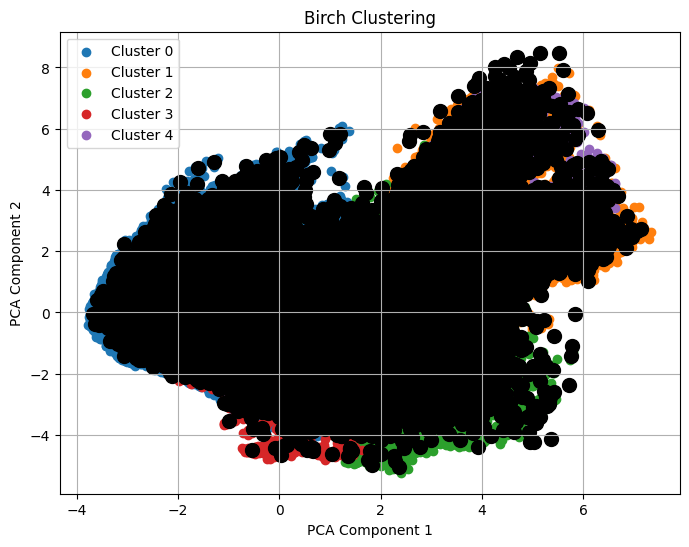

In [ ]:
plt.figure(figsize=(8, 6))

for cluster_label in range(birch.n_clusters):
    plt.scatter(reduced_data[labels == cluster_label, 0], reduced_data[labels == cluster_label, 1], label=f'Cluster {cluster_label}')

# Plot cluster centers
plt.scatter(birch.subcluster_centers_[:, 0], birch.subcluster_centers_[:, 1], marker='o', s=100, color='black')

plt.title('Birch Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.grid(True)
plt.show()

##################################################
## FOR LOOP ERRORS WERE AMENDED USING CHAT GPT ##
##################################################

##### Density-Based Spatial Clustering of Applications with Noise (DBSCAN)

In [ ]:
# Rename dataset
covtype = fdata

# Put the dataset into a Pandas DataFrame
df = pd.DataFrame(covtype.data, columns=covtype.feature_names)
df['target'] = covtype.target

# Specify the chunk size
chunk_size = 25000

# Lists to store clustering results
silhouette_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
adjusted_rand_scores = []
adjusted_mutual_info_scores = []

# Create a while loop to process the dataset in chunks
start_index = 0
while start_index < len(df):
    end_index = start_index + chunk_size
    chunk = df.iloc[start_index:end_index]

    X = chunk.drop(['target'], axis='columns')

    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Initialize DBSCAN model
    dbscan = DBSCAN(eps=3.1, min_samples=5)

    # Fit the model on the current chunk
    labels = dbscan.fit_predict(X_scaled)

    # Evaluate clustering metrics for the current chunk
    silhouette = silhouette_score(X_scaled, labels)
    calinski_harabasz = calinski_harabasz_score(X_scaled, labels)
    davies_bouldin = davies_bouldin_score(X_scaled, labels)
    rand_score = adjusted_rand_score(df['target'].iloc[start_index:end_index], labels)
    mutual_info_score = adjusted_mutual_info_score(df['target'].iloc[start_index:end_index], labels)

    # Append scores to the lists
    silhouette_scores.append(silhouette)
    calinski_harabasz_scores.append(calinski_harabasz)
    davies_bouldin_scores.append(davies_bouldin)
    adjusted_rand_scores.append(rand_score)
    adjusted_mutual_info_scores.append(mutual_info_score)

    # Move to the next chunk
    start_index = end_index

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (Stack Overflow, 2017) ##
##############################################################

In [ ]:
# Calculate average scores across all chunks
average_silhouette = np.mean(silhouette_scores)
average_calinski_harabasz = np.mean(calinski_harabasz_scores)
average_davies_bouldin = np.mean(davies_bouldin_scores)
average_rand_score = np.mean(adjusted_rand_scores)
average_mutual_info_score = np.mean(adjusted_mutual_info_scores)

print('silhouette_score = ', round(average_silhouette, 3), '\ncalinski_harabasz_score = ', round(average_calinski_harabasz , 3), '\ndavies_bouldin_score = ', round(average_davies_bouldin , 3))
print('adjusred_rand_index = ', round(average_rand_score, 3), '\nadjusted_mutual_information = ', round(average_mutual_info_score , 3))

silhouette_score =  0.383 
calinski_harabasz_score =  3289.455 
davies_bouldin_score =  0.948
adjusred_rand_index =  0.083 
adjusted_mutual_information =  0.209


##### Gaussian Mixture Model (GMM)

In [ ]:
print("\n\nInternal Evaluation of GMM Clustering\n")
s_gmm = silhouette_score(scaled_data, pred)
c_gmm = calinski_harabasz_score(scaled_data, pred)
d_gmm = davies_bouldin_score(scaled_data, pred)
print('silhouette_score = ', round(s_gmm, 3), '\ncalinski_harabasz_score = ', round(c_gmm, 3), '\ndavies_bouldin_score = ', round(d_gmm, 3))



Internal Evaluation of GMM Clustering

silhouette_score =  0.265 
calinski_harabasz_score =  113680.209 
davies_bouldin_score =  1.398


In [ ]:
print("\n\nExternal Evaluation of GMM Clustering\n")

# Calculate Adjusted Rand Index
true_labels = covtype.target
ari_gmm = adjusted_rand_score(true_labels, pred)
print("Adjusted Rand Index:", ari_gmm)

# Calculate Adjusted Mutual Information
ami_gmm = adjusted_mutual_info_score(true_labels, pred)
print("Adjusted Mutual Information:", ami_gmm)



External Evaluation of GMM Clustering

Adjusted Rand Index: 0.03134685099831231
Adjusted Mutual Information: 0.14108371815952506


##### Hierarchical

In [ ]:
# Create function to evaluate clustering

def evaluate_h_clustering(batch_pca, y_hd, y_hd_other, metric): #y_hd = ground truth, y_hd_other = compare another set of clusters against ground truth
    silhouette = silhouette_score(batch_pca, y_hd, metric='euclidean')
    davies_bouldin = davies_bouldin_score(batch_pca, y_hd)
    calinski_harabasz = calinski_harabasz_score(batch_pca, y_hd)
    adjusted_rand = adjusted_rand_score(y_hd, y_hd_other)
    adjusted_mutual_info = adjusted_mutual_info_score(y_hd, y_hd_other)

    return silhouette, davies_bouldin, calinski_harabasz, adjusted_rand, adjusted_mutual_info

#######################################################
## GROUND TRUTH LABELLING CODE SUPPORTED BY CHAT GPT ##
#######################################################

In [ ]:
hc_results = []

for i, batch in enumerate(batches, start=1):
    batch_scaled = scaler.transform(batch)
    batch_pca = pca.transform(batch_scaled)

    # Hierarchical clustering for different metrics (done in trainig but doesn't transfer through for evaluation)
    hc_euclidean = hierarchical_clustering(batch_pca, 2, 'euclidean')
    hc_manhattan = hierarchical_clustering(batch_pca, 2, 'manhattan')
    hc_cosine = hierarchical_clustering(batch_pca, 2, 'cosine')

    # Evaluate each metric
    silhouette_euclidean, davies_bouldin_euclidean, calinski_harabasz_euclidean, adjusted_rand_euclidean, adjusted_mutual_info_euclidean = evaluate_h_clustering(batch_pca, hc_euclidean, hc_manhattan, 'euclidean')
    silhouette_manhattan, davies_bouldin_manhattan, calinski_harabasz_manhattan, adjusted_rand_manhattan, adjusted_mutual_info_manhattan = evaluate_h_clustering(batch_pca, hc_manhattan, hc_manhattan, 'euclidean')
    silhouette_cosine, davies_bouldin_cosine, calinski_harabasz_cosine, adjusted_rand_cosine, adjusted_mutual_info_cosine = evaluate_h_clustering(batch_pca, hc_cosine, hc_manhattan, 'euclidean')

    # Update results
    hc_results.append({
        'Batch': i,
        'Silhouette (Euclidean)': silhouette_euclidean,
        'Silhouette (Manhattan)': silhouette_manhattan,
        'Silhouette (Cosine)': silhouette_cosine,
        'Davies-Bouldin (Euclidean)': davies_bouldin_euclidean,
        'Davies-Bouldin (Manhattan)': davies_bouldin_manhattan,
        'Davies-Bouldin (Cosine)': davies_bouldin_cosine,
        'Calinski-Harabasz (Euclidean)': calinski_harabasz_euclidean,
        'Calinski-Harabasz (Manhattan)': calinski_harabasz_manhattan,
        'Calinski-Harabasz (Cosine)': calinski_harabasz_cosine,
        'Adjusted Rand (Euclidean)': adjusted_rand_euclidean,
        'Adjusted Rand (Manhattan)': adjusted_rand_manhattan,
        'Adjusted Rand (Cosine)': adjusted_rand_cosine,
        'Adjusted Mutual Info (Euclidean)': adjusted_mutual_info_euclidean,
        'Adjusted Mutual Info (Manhattan)': adjusted_mutual_info_manhattan,
        'Adjusted Mutual Info (Cosine)': adjusted_mutual_info_cosine
    })

hc_df = pd.DataFrame(hc_results) #save as new data frame


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path_hc_results = '/content/drive/My Drive/hc_results.csv'

In [ ]:
hc_df.to_csv(file_path_hc_results, index=False)

In [ ]:
hc_df

,Batch,Silhouette (Euclidean),Silhouette (Manhattan),Silhouette (Cosine),Davies-Bouldin (Euclidean),Davies-Bouldin (Manhattan),Davies-Bouldin (Cosine),Calinski-Harabasz (Euclidean),Calinski-Harabasz (Manhattan),Calinski-Harabasz (Cosine),Adjusted Rand (Euclidean),Adjusted Rand (Manhattan),Adjusted Rand (Cosine),Adjusted Mutual Info (Euclidean),Adjusted Mutual Info (Manhattan),Adjusted Mutual Info (Cosine)
0,1,0.851773,0.851773,0.851773,0.110631,0.110631,0.110631,690.550971,690.550971,690.550971,1.0,1.0,1.0,1.0,1.0,1.0
1,2,0.671344,0.671344,0.671344,0.295481,0.295481,0.295481,9677.653756,9677.653756,9677.653756,1.0,1.0,1.0,1.0,1.0,1.0
2,3,0.915155,0.915155,0.915155,0.071891,0.071891,0.071891,16074.033303,16074.033303,16074.033303,1.0,1.0,1.0,1.0,1.0,1.0
3,4,0.925008,0.925008,0.925008,0.056086,0.056086,0.056086,1810.569849,1810.569849,1810.569849,1.0,1.0,1.0,1.0,1.0,1.0
4,5,0.774899,0.774899,0.774899,0.215598,0.215598,0.215598,33201.915908,33201.915908,33201.915908,1.0,1.0,1.0,1.0,1.0,1.0
5,6,0.792582,0.792582,0.792582,0.187619,0.187619,0.187619,1322.928843,1322.928843,1322.928843,1.0,1.0,1.0,1.0,1.0,1.0
6,7,0.624822,0.624822,0.624822,0.404677,0.404677,0.404677,11193.585497,11193.585497,11193.585497,1.0,1.0,1.0,1.0,1.0,1.0
7,8,0.705398,0.705398,0.705398,0.293362,0.293362,0.293362,5020.015811,5020.015811,5020.015811,1.0,1.0,1.0,1.0,1.0,1.0
8,9,0.976549,0.976549,0.976549,0.018436,0.018436,0.018436,8709.840994,8709.840994,8709.840994,1.0,1.0,1.0,1.0,1.0,1.0
9,10,0.715374,0.715374,0.715374,0.271141,0.271141,0.271141,2420.900781,2420.900781,2420.900781,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
#Find the average silhoutte score for each metric and compare

mean_silhouette_euclidean = np.mean(silhouette_euclidean)
mean_silhouette_manhattan = np.mean(silhouette_manhattan)
mean_silhouette_cosine = np.mean(silhouette_cosine)

mean_silhouette_scores = {
    'Euclidean': mean_silhouette_euclidean,
    'Manhattan': mean_silhouette_manhattan,
    'Cosine': mean_silhouette_cosine}

best_metric = max(mean_silhouette_scores, key=mean_silhouette_scores.get)
max_value = mean_silhouette_scores[best_metric]
print("Best Metric for Silhouette Score:", best_metric, "-", max_value)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Best Metric for Silhouette Score: Euclidean - 0.5374029046713399


In [ ]:
#Find the average calinski harabasz score for each metric and compare

mean_calinski_euclidean = np.mean(calinski_harabasz_euclidean)
mean_calinski_manhattan = np.mean(calinski_harabasz_manhattan)
mean_calinski_cosine = np.mean(calinski_harabasz_cosine)

mean_calinski_scores = {
    'Euclidean': mean_calinski_euclidean,
    'Manhattan': mean_calinski_manhattan,
    'Cosine': mean_calinski_cosine}

best_metric_calinski = max(mean_calinski_scores, key=mean_calinski_scores.get)
max_value_calinski = mean_calinski_scores[best_metric_calinski]
print("Best Metric for Calinski-Harabasz:", best_metric_calinski, "-", max_value_calinski)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Best Metric for Calinski-Harabasz: Euclidean - 16.25981753745765


In [ ]:
#Find the average davies-bouldin score for each metric and compare

mean_davies_bouldin_euclidean = np.mean(davies_bouldin_euclidean)
mean_davies_bouldin_manhattan = np.mean(davies_bouldin_manhattan)
mean_davies_bouldin_cosine = np.mean(davies_bouldin_cosine)

mean_davies_bouldin_scores = {
    'Euclidean': mean_davies_bouldin_euclidean,
    'Manhattan': mean_davies_bouldin_manhattan,
    'Cosine': mean_davies_bouldin_cosine}

best_metric_davies_bouldin = max(mean_davies_bouldin_scores, key=mean_davies_bouldin_scores.get)
max_value_davies_bouldin = mean_davies_bouldin_scores[best_metric_davies_bouldin]
print("Best Metric for Davies-Bouldin:", best_metric_davies_bouldin, ",", max_value_davies_bouldin)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Best Metric for Davies-Bouldin: Euclidean , 0.5898840570894264


In [ ]:
#Find the average adjusted rand score for each metric and compare

mean_rand_score_euclidean = np.mean(adjusted_rand_euclidean)
mean_rand_score_manhattan = np.mean(adjusted_rand_manhattan)
mean_rand_score_cosine = np.mean(adjusted_rand_cosine)

mean_rand_score = {
    'Euclidean': mean_rand_score_euclidean,
    'Manhattan': mean_rand_score_manhattan,
    'Cosine': mean_rand_score_cosine}

best_metric_rand = max(mean_rand_score, key=mean_rand_score.get)
max_value_rand = mean_rand_score[best_metric_rand]
print("Best Metric for Adjusted Rand Score:", best_metric_rand, "-",max_value_rand)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Best Metric for Adjusted Rand Score: Euclidean - 1.0


In [ ]:
#Find the average adjusted mutual info score for each metric and compare
mean_mutual_info_euclidean = np.mean(adjusted_mutual_info_euclidean)
mean_mutual_info_manhattan = np.mean(adjusted_mutual_info_manhattan)
mean_mutual_info_cosine = np.mean(adjusted_mutual_info_cosine)

mean_mutual_info = {
    'Euclidean': mean_mutual_info_euclidean,
    'Manhattan': mean_mutual_info_manhattan,
    'Cosine': mean_mutual_info_cosine}

best_metric_mutual_info = max(mean_mutual_info, key=mean_mutual_info.get)
max_value_mutual_info = mean_mutual_info[best_metric_mutual_info]
print("Best Metric for Adjusted Mutual Information Score:", best_metric_mutual_info, "-", max_value_mutual_info)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Best Metric for Adjusted Mutual Information Score: Euclidean - 1.0


In [ ]:
#Find the average for each metric and compare overall

mean_silhouette = np.mean([mean_silhouette_euclidean, mean_silhouette_manhattan, mean_silhouette_cosine])
mean_calinski = np.mean([mean_calinski_euclidean, mean_calinski_manhattan, mean_calinski_cosine])
mean_davies_bouldin = np.mean([mean_davies_bouldin_euclidean, mean_davies_bouldin_manhattan, mean_davies_bouldin_cosine])
mean_rand_score = np.mean([mean_rand_score_euclidean, mean_rand_score_manhattan, mean_rand_score_cosine])
mean_mutual_info = np.mean([mean_mutual_info_euclidean, mean_mutual_info_manhattan, mean_mutual_info_cosine])

mean_of_means = {
    'Euclidean': np.mean([mean_silhouette_euclidean, mean_calinski_euclidean, mean_davies_bouldin_euclidean, mean_rand_score_euclidean, mean_mutual_info_euclidean]),
    'Manhattan': np.mean([mean_silhouette_manhattan, mean_calinski_manhattan, mean_davies_bouldin_manhattan, mean_rand_score_manhattan, mean_mutual_info_manhattan]),
    'Cosine': np.mean([mean_silhouette_cosine, mean_calinski_cosine, mean_davies_bouldin_cosine, mean_rand_score_cosine, mean_mutual_info_cosine])}

best_metric_overall = max(mean_of_means, key=mean_of_means.get)
max_value_overall = mean_of_means[best_metric_overall]
print("Best Overall Metric:", best_metric_overall, "-",max_value_overall)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################


Best Overall Metric: Euclidean - 3.8774208998436834


##### K-Means

**Implement parameter with random_state=0)
cluster_labels3 = kmeans7.fit_predict(KM_batch)**

In [ ]:
##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

# Apply KMeans parameter with random_state=0##################
num_clusters = 3
kmeans7 = KMeans(n_clusters=num_clusters,random_state=0)
cluster_labels3 = kmeans7.fit_predict(KM_batch)
###############################################################


# Compute internal evaluation metrics
silhouette_scores.append(silhouette_score(KM_batch, cluster_labels3))
calinski_harabasz_scores.append(calinski_harabasz_score(KM_batch, cluster_labels3))
davies_bouldin_scores.append(davies_bouldin_score(KM_batch, cluster_labels3))

# Compute external evaluation metrics
adjusted_rand_scores.append(adjusted_rand_score(KM_labels_true_batch, cluster_labels3))
adjusted_mutual_info_scores.append(adjusted_mutual_info_score(KM_labels_true_batch, cluster_labels3))

# Average evaluation metrics over all batches
silhouette_avg = np.mean(silhouette_scores)
calinski_harabasz_avg = np.mean(calinski_harabasz_scores)
davies_bouldin_avg = np.mean(davies_bouldin_scores)
adjusted_rand_avg = np.mean(adjusted_rand_scores)
adjusted_mutual_info_avg = np.mean(adjusted_mutual_info_scores)


# Create a list of lists containing the evaluation results
results_table2 = [
    ["Silhouette Score", silhouette_avg],
    ["Calinski-Harabasz Score", calinski_harabasz_avg],
    ["Davies-Bouldin Score", davies_bouldin_avg],
    ["Adjusted Rand Index", adjusted_rand_avg],
    ["Adjusted Mutual Information", adjusted_mutual_info_avg]
]

# Print the table
print(tabulate(results_table2, headers=["Result Method 2", "Average Score"], tablefmt="grid"))


###################################################################
##TGrinberg, R. (2022). K-Means Clustering in Python. Real Python.
##Available at: https://realpython.com/k-means-clustering-python/
##(Accessed: March 3, 2024).##
#####################################################################

+-----------------------------+-----------------+
| Result Method 2             |   Average Score |
+=============================+=================+
| Silhouette Score            |        0.678987 |
+-----------------------------+-----------------+
| Calinski-Harabasz Score     |   229401        |
+-----------------------------+-----------------+
| Davies-Bouldin Score        |        0.449127 |
+-----------------------------+-----------------+
| Adjusted Rand Index         |        0.126855 |
+-----------------------------+-----------------+
| Adjusted Mutual Information |        0.161347 |
+-----------------------------+-----------------+


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**Implement parameter with (ax_iter=300, tol=1e-4,init="random", random_state=42,n_init=10)
cluster_labels4 = kmeans7.fit_predict(KM_batch)**

In [ ]:
######################################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
######################################################################

# Apply KMeans parameter with max_iter=7, random_state=0#################################################
num_clusters = 7
kmeans7 = KMeans(n_clusters=num_clusters, max_iter=300, tol=1e-4,init="random", random_state=42,n_init=10)
cluster_labels4 = kmeans7.fit_predict(KM_batch)
#########################################################################################################
# Compute internal evaluation metrics
silhouette_scores.append(silhouette_score(KM_batch, cluster_labels4))
calinski_harabasz_scores.append(calinski_harabasz_score(KM_batch, cluster_labels4))
davies_bouldin_scores.append(davies_bouldin_score(KM_batch, cluster_labels4))

# Compute external evaluation metrics
adjusted_rand_scores.append(adjusted_rand_score(KM_labels_true_batch, cluster_labels4))
adjusted_mutual_info_scores.append(adjusted_mutual_info_score(KM_labels_true_batch, cluster_labels4))

# Average evaluation metrics over all batches
silhouette_avg = np.mean(silhouette_scores)
calinski_harabasz_avg = np.mean(calinski_harabasz_scores)
davies_bouldin_avg = np.mean(davies_bouldin_scores)
adjusted_rand_avg = np.mean(adjusted_rand_scores)
adjusted_mutual_info_avg = np.mean(adjusted_mutual_info_scores)

# Create a list of lists containing the evaluation results
results_table2 = [
    ["Silhouette Score", silhouette_avg],
    ["Calinski-Harabasz Score", calinski_harabasz_avg],
    ["Davies-Bouldin Score", davies_bouldin_avg],
    ["Adjusted Rand Index", adjusted_rand_avg],
    ["Adjusted Mutual Information", adjusted_mutual_info_avg]
]

# Print the table
print(tabulate(results_table2, headers=["Result Method 2", "Average Score"], tablefmt="grid"))

#################################################################
##Grinberg, R. (2022). K-Means Clustering in Python. Real Python.
##Available at: https://realpython.com/k-means-clustering-python/
 ##(Accessed: Feb25, 2024). ##
#####################################################################


+-----------------------------+-----------------+
| Result Method 2             |   Average Score |
+=============================+=================+
| Silhouette Score            |        0.652005 |
+-----------------------------+-----------------+
| Calinski-Harabasz Score     |   210286        |
+-----------------------------+-----------------+
| Davies-Bouldin Score        |        0.457304 |
+-----------------------------+-----------------+
| Adjusted Rand Index         |        0.116284 |
+-----------------------------+-----------------+
| Adjusted Mutual Information |        0.147902 |
+-----------------------------+-----------------+


**Implement parameter with (n_clusters=num_clusters, init='k-means++', random_state=0)
cluster_labels3 = kmeans7.fit_predict(KM_batch)**

In [ ]:
######################################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
######################################################################

# Apply KMeans parameter with random_state=0###############################
num_clusters = 3
kmeans7 = KMeans(n_clusters=num_clusters, init='k-means++', random_state=0)
cluster_labels3 = kmeans7.fit_predict(KM_batch)
#############################################################################

# Compute internal evaluation metrics
silhouette_scores.append(silhouette_score(KM_batch, cluster_labels3))
calinski_harabasz_scores.append(calinski_harabasz_score(KM_batch, cluster_labels3))
davies_bouldin_scores.append(davies_bouldin_score(KM_batch, cluster_labels3))

# Compute external evaluation metrics
adjusted_rand_scores.append(adjusted_rand_score(KM_labels_true_batch, cluster_labels3))
adjusted_mutual_info_scores.append(adjusted_mutual_info_score(KM_labels_true_batch, cluster_labels3))

# Average evaluation metrics over all batches
silhouette_avg = np.mean(silhouette_scores)
calinski_harabasz_avg = np.mean(calinski_harabasz_scores)
davies_bouldin_avg = np.mean(davies_bouldin_scores)
adjusted_rand_avg = np.mean(adjusted_rand_scores)
adjusted_mutual_info_avg = np.mean(adjusted_mutual_info_scores)

# Create a list of lists containing the evaluation results
results_table2 = [
    ["Silhouette Score", silhouette_avg],
    ["Calinski-Harabasz Score", calinski_harabasz_avg],
    ["Davies-Bouldin Score", davies_bouldin_avg],
    ["Adjusted Rand Index", adjusted_rand_avg],
    ["Adjusted Mutual Information", adjusted_mutual_info_avg]
]

# Print the table
print(tabulate(results_table2, headers=["Result Method 2", "Average Score"], tablefmt="grid"))


#################################################################
##Grinberg, R. (2022). K-Means Clustering in Python. Real Python.
##Available at: https://realpython.com/k-means-clustering-python/
 ##(Accessed: Feb25, 2024). ##
#####################################################################


+-----------------------------+-----------------+
| Result Method 2             |   Average Score |
+=============================+=================+
| Silhouette Score            |        0.666976 |
+-----------------------------+-----------------+
| Calinski-Harabasz Score     |   219428        |
+-----------------------------+-----------------+
| Davies-Bouldin Score        |        0.459044 |
+-----------------------------+-----------------+
| Adjusted Rand Index         |        0.12134  |
+-----------------------------+-----------------+
| Adjusted Mutual Information |        0.154332 |
+-----------------------------+-----------------+


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**Best  K-means : Silhouette Score at 3 clusters**

In [ ]:

# Create a dictionary to hold the evaluation results
results_dict2 = {
    "Metric": ["Silhouette Score", "Calinski-Harabasz Score", "Davies-Bouldin Score", "Adjusted Rand Index", "Adjusted Mutual Information"],
    "Average Score": [silhouette_avg, calinski_harabasz_avg, davies_bouldin_avg, adjusted_rand_avg, adjusted_mutual_info_avg]
}

# Create a DataFrame from the dictionary
results_df2 = pd.DataFrame(results_dict2)

# Print the DataFrame
print("Method2: Cluster3:")
print(results_df2)

Method2: Cluster3:
                        Metric  Average Score
0             Silhouette Score       0.692212
1      Calinski-Harabasz Score  240319.559475
2         Davies-Bouldin Score       0.438161
3          Adjusted Rand Index       0.133058
4  Adjusted Mutual Information       0.168913


##### Mean Shift

In [ ]:
######MODEL 1: BANDWIDTH = 3##############

# Create a list to store both internal and external evaluation metrics for each batch
ms_mod1_sc = []
ms_mod1_db = []
ms_mod1_ch = []
ms_mod1_ari = []
ms_mod1_ami = []

# Enumerate through the batches, apply scaling and dimensionality reduction.
# Fit the Mean Shift algorithm changing parameters bandwidth=3.
for i, batch in enumerate(ms_batches):
    ms_batch_scaled = scaler.transform(batch)
    ms_batch_pca = pca.transform(ms_batch_scaled)
    ms = MeanShift(bandwidth=3, bin_seeding=True, max_iter=300, cluster_all=True)
    ms_labels = ms.fit_predict(ms_batch_scaled)

    # Calculate internal and external evaluation metrics for each batch and append them to variables
    ms_silhouette = silhouette_score(ms_batch_pca, ms_labels, metric='euclidean')
    ms_davies_bouldin = davies_bouldin_score(ms_batch_pca, ms_labels)
    ms_calinski_harabasz = calinski_harabasz_score(ms_batch_pca, ms_labels)

    # Ensure that ground_truth_labels has the correct length for the current batch
    ms_ground_truth_labels = fdata.target[i * ms_batch_size: (i + 1) * ms_batch_size]
    ms_adj_rand = adjusted_rand_score(ms_ground_truth_labels, ms_labels) if ms_ground_truth_labels is not None else None
    ms_mutual_info = adjusted_mutual_info_score(ms_ground_truth_labels, ms_labels, average_method='arithmetic') if ms_ground_truth_labels is not None else None

    ms_mod1_sc.append(ms_silhouette)
    ms_mod1_db.append(ms_davies_bouldin)
    ms_mod1_ch.append(ms_calinski_harabasz)
    ms_mod1_ari.append(ms_adj_rand)
    ms_mod1_ami.append(ms_mutual_info)

# Print the overall mean scores
mean_ms_mod1_sc = sum(ms_mod1_sc) / len(ms_mod1_sc)
mean_ms_mod1_db = sum(ms_mod1_db) / len(ms_mod1_db)
mean_ms_mod1_ch = sum(ms_mod1_ch) / len(ms_mod1_ch)
mean_ms_mod1_ari = sum(ms_mod1_ari) / len(ms_mod1_ari)
mean_ms_mod1_ami = sum(ms_mod1_ami) / len(ms_mod1_ami)
print(f"Overall Mean Silhouette Score: {mean_ms_mod1_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_ms_mod1_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_ms_mod1_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_ms_mod1_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_ms_mod1_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: -0.23715198558723913
Overall Mean Davies-Bouldin Index: 6.422865921000725
Overall Mean Calinski-Harabasz Index: 2619.571740373496
Overall Mean Adjusted Rand Index: 0.07569174914983502
Overall Mean Adjusted Mutual Information: 0.2043735553743516


In [ ]:
######MODEL 2: BANDWIDTH = 4##############

# Create a list to store both internal and external evaluation metrics for each batch
ms_mod2_sc = []
ms_mod2_db = []
ms_mod2_ch = []
ms_mod2_ari = []
ms_mod2_ami = []

# Enumerate through the batches, apply scaling and dimensionality reduction.
# Fit the Mean Shift algorithm changing parameters to bandwidth=4.
for i, batch in enumerate(ms_batches):
    ms_batch_scaled = scaler.transform(batch)
    ms_batch_pca = pca.transform(ms_batch_scaled)
    ms = MeanShift(bandwidth=4, bin_seeding=True, max_iter=300, cluster_all=True)
    ms_labels = ms.fit_predict(ms_batch_scaled)

    # Calculate internal and external evaluation metrics for each batch and append them to variables
    ms_silhouette = silhouette_score(ms_batch_pca, ms_labels, metric='euclidean')
    ms_davies_bouldin = davies_bouldin_score(ms_batch_pca, ms_labels)
    ms_calinski_harabasz = calinski_harabasz_score(ms_batch_pca, ms_labels)

    # Ensure that ground_truth_labels has the correct length for the current batch
    ms_ground_truth_labels = fdata.target[i * ms_batch_size: (i + 1) * ms_batch_size]
    ms_adj_rand = adjusted_rand_score(ms_ground_truth_labels, ms_labels) if ms_ground_truth_labels is not None else None
    ms_mutual_info = adjusted_mutual_info_score(ms_ground_truth_labels, ms_labels, average_method='arithmetic') if ms_ground_truth_labels is not None else None

    ms_mod2_sc.append(ms_silhouette)
    ms_mod2_db.append(ms_davies_bouldin)
    ms_mod2_ch.append(ms_calinski_harabasz)
    ms_mod2_ari.append(ms_adj_rand)
    ms_mod2_ami.append(ms_mutual_info)

# Print the overall mean scores
mean_ms_mod2_sc = sum(ms_mod2_sc) / len(ms_mod2_sc)
mean_ms_mod2_db = sum(ms_mod2_db) / len(ms_mod2_db)
mean_ms_mod2_ch = sum(ms_mod2_ch) / len(ms_mod2_ch)
mean_ms_mod2_ari = sum(ms_mod2_ari) / len(ms_mod2_ari)
mean_ms_mod2_ami = sum(ms_mod2_ami) / len(ms_mod2_ami)
print(f"Overall Mean Silhouette Score: {mean_ms_mod2_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_ms_mod2_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_ms_mod2_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_ms_mod2_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_ms_mod2_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: -0.2737500984075172
Overall Mean Davies-Bouldin Index: 7.346633121622472
Overall Mean Calinski-Harabasz Index: 2041.0388624003815
Overall Mean Adjusted Rand Index: 0.08846612163047012
Overall Mean Adjusted Mutual Information: 0.21631334082352524


In [ ]:
######MODEL 3: BANDWIDTH = 5##############

# Create a list to store both internal and external evaluation metrics for each batch
ms_mod3_sc = []
ms_mod3_db = []
ms_mod3_ch = []
ms_mod3_ari = []
ms_mod3_ami = []

# Enumerate through the batches, apply scaling and dimensionality reduction.
# Fit the Mean Shift algorithm changing parameters to bandwidth=5.
for i, batch in enumerate(ms_batches):
    ms_batch_scaled = scaler.transform(batch)
    ms_batch_pca = pca.transform(ms_batch_scaled)
    ms = MeanShift(bandwidth=5, bin_seeding=True, max_iter=300, cluster_all=True)
    ms_labels = ms.fit_predict(ms_batch_scaled)

    # Calculate internal and external evaluation metrics for each batch and append them to variables
    ms_silhouette = silhouette_score(ms_batch_pca, ms_labels, metric='euclidean')
    ms_davies_bouldin = davies_bouldin_score(ms_batch_pca, ms_labels)
    ms_calinski_harabasz = calinski_harabasz_score(ms_batch_pca, ms_labels)

    # Ensure that ground_truth_labels has the correct length for the current batch
    ms_ground_truth_labels = fdata.target[i * ms_batch_size: (i + 1) * ms_batch_size]
    ms_adj_rand = adjusted_rand_score(ms_ground_truth_labels, ms_labels) if ms_ground_truth_labels is not None else None
    ms_mutual_info = adjusted_mutual_info_score(ms_ground_truth_labels, ms_labels, average_method='arithmetic') if ms_ground_truth_labels is not None else None

    ms_mod3_sc.append(ms_silhouette)
    ms_mod3_db.append(ms_davies_bouldin)
    ms_mod3_ch.append(ms_calinski_harabasz)
    ms_mod3_ari.append(ms_adj_rand)
    ms_mod3_ami.append(ms_mutual_info)

# Print the overall mean scores
mean_ms_mod3_sc = sum(ms_mod3_sc) / len(ms_mod3_sc)
mean_ms_mod3_db = sum(ms_mod3_db) / len(ms_mod3_db)
mean_ms_mod3_ch = sum(ms_mod3_ch) / len(ms_mod3_ch)
mean_ms_mod3_ari = sum(ms_mod3_ari) / len(ms_mod3_ari)
mean_ms_mod3_ami = sum(ms_mod3_ami) / len(ms_mod3_ami)
print(f"Overall Mean Silhouette Score: {mean_ms_mod3_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_ms_mod3_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_ms_mod3_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_ms_mod3_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_ms_mod3_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: -0.31204337600262777
Overall Mean Davies-Bouldin Index: 6.980564630312381
Overall Mean Calinski-Harabasz Index: 1582.5809091632093
Overall Mean Adjusted Rand Index: 0.10509418836163428
Overall Mean Adjusted Mutual Information: 0.2208231934357748


In [ ]:
####OPTIMAL BANDWIDTH###

mean_silhouette =-0.23715198558723913
mean_davies_bouldin = 6.422865921000725
mean_calinski_harabasz = 2619.571740373496
mean_adjusted_rand = 0.07569174914983502
mean_adjusted_mutual_info = 0.2043735553743516


print(f"The optimal bandwidth is 3")
print(f"Overall Mean Silhouette Score: {mean_silhouette}")
print(f"Overall Mean Davies-Bouldin Index: {mean_davies_bouldin}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_calinski_harabasz}")
print(f"Overall Mean Adjusted Rand Index: {mean_adjusted_rand}")
print(f"Overall Mean Adjusted Mutual Information: {mean_adjusted_mutual_info}")
print(f"It was chosen to optimise the internal metrics despite other bandwiths")
print(f"..that have slightly better external metrics")


The optimal bandwidth is 3
Overall Mean Silhouette Score: -0.23715198558723913
Overall Mean Davies-Bouldin Index: 6.422865921000725
Overall Mean Calinski-Harabasz Index: 2619.571740373496
Overall Mean Adjusted Rand Index: 0.07569174914983502
Overall Mean Adjusted Mutual Information: 0.2043735553743516
It was chosen to optimise the internal metrics despite other bandwiths
..that have slightly better external metrics


In [ ]:
######MODEL 4: MAX_ITER = 100##############

# Create a list to store both internal and external evaluation metrics for each batch
ms_mod4_sc = []
ms_mod4_db = []
ms_mod4_ch = []
ms_mod4_ari = []
ms_mod4_ami = []

# Enumerate through the batches, apply scaling and dimensionality reduction.
# Fit the Mean Shift algorithm changing parameters to max_iter=100
for i, batch in enumerate(ms_batches):
    ms_batch_scaled = scaler.transform(batch)
    ms_batch_pca = pca.transform(ms_batch_scaled)
    ms = MeanShift(bandwidth=3, bin_seeding=True, max_iter=100, cluster_all=True)
    ms_labels = ms.fit_predict(ms_batch_scaled)

    # Calculate internal and external evaluation metrics for each batch and append them to variables
    ms_silhouette = silhouette_score(ms_batch_pca, ms_labels, metric='euclidean')
    ms_davies_bouldin = davies_bouldin_score(ms_batch_pca, ms_labels)
    ms_calinski_harabasz = calinski_harabasz_score(ms_batch_pca, ms_labels)

    # Ensure that ground_truth_labels has the correct length for the current batch
    ms_ground_truth_labels = fdata.target[i * ms_batch_size: (i + 1) * ms_batch_size]
    ms_adj_rand = adjusted_rand_score(ms_ground_truth_labels, ms_labels) if ms_ground_truth_labels is not None else None
    ms_mutual_info = adjusted_mutual_info_score(ms_ground_truth_labels, ms_labels, average_method='arithmetic') if ms_ground_truth_labels is not None else None

    ms_mod4_sc.append(ms_silhouette)
    ms_mod4_db.append(ms_davies_bouldin)
    ms_mod4_ch.append(ms_calinski_harabasz)
    ms_mod4_ari.append(ms_adj_rand)
    ms_mod4_ami.append(ms_mutual_info)

# Print the overall mean scores
mean_ms_mod4_sc = sum(ms_mod4_sc) / len(ms_mod4_sc)
mean_ms_mod4_db = sum(ms_mod4_db) / len(ms_mod4_db)
mean_ms_mod4_ch = sum(ms_mod4_ch) / len(ms_mod4_ch)
mean_ms_mod4_ari = sum(ms_mod4_ari) / len(ms_mod4_ari)
mean_ms_mod4_ami = sum(ms_mod4_ami) / len(ms_mod4_ami)
print(f"Overall Mean Silhouette Score: {mean_ms_mod4_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_ms_mod4_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_ms_mod4_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_ms_mod4_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_ms_mod4_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: -0.23715198558723913
Overall Mean Davies-Bouldin Index: 6.422865921000725
Overall Mean Calinski-Harabasz Index: 2619.571740373496
Overall Mean Adjusted Rand Index: 0.07569174914983502
Overall Mean Adjusted Mutual Information: 0.2043735553743516


In [ ]:
######MODEL 5: MAX_ITER = 500##############

# Create a list to store both internal and external evaluation metrics for each batch
ms_mod5_sc = []
ms_mod5_db = []
ms_mod5_ch = []
ms_mod5_ari = []
ms_mod5_ami = []

# Enumerate through the batches, apply scaling and dimensionality reduction.
# Fit the Mean Shift algorithm changing parameters to max_iter=500
for i, batch in enumerate(ms_batches):
    ms_batch_scaled = scaler.transform(batch)
    ms_batch_pca = pca.transform(ms_batch_scaled)
    ms = MeanShift(bandwidth=3, bin_seeding=True, max_iter=500, cluster_all=True)
    ms_labels = ms.fit_predict(ms_batch_scaled)

    # Calculate internal and external evaluation metrics for each batch and append them to variables
    ms_silhouette = silhouette_score(ms_batch_pca, ms_labels, metric='euclidean')
    ms_davies_bouldin = davies_bouldin_score(ms_batch_pca, ms_labels)
    ms_calinski_harabasz = calinski_harabasz_score(ms_batch_pca, ms_labels)

    # Ensure that ground_truth_labels has the correct length for the current batch
    ms_ground_truth_labels = fdata.target[i * ms_batch_size: (i + 1) * ms_batch_size]
    ms_adj_rand = adjusted_rand_score(ms_ground_truth_labels, ms_labels) if ms_ground_truth_labels is not None else None
    ms_mutual_info = adjusted_mutual_info_score(ms_ground_truth_labels, ms_labels, average_method='arithmetic') if ms_ground_truth_labels is not None else None

    ms_mod5_sc.append(ms_silhouette)
    ms_mod5_db.append(ms_davies_bouldin)
    ms_mod5_ch.append(ms_calinski_harabasz)
    ms_mod5_ari.append(ms_adj_rand)
    ms_mod5_ami.append(ms_mutual_info)

# Print the overall mean scores
mean_ms_mod5_sc = sum(ms_mod5_sc) / len(ms_mod5_sc)
mean_ms_mod5_db = sum(ms_mod5_db) / len(ms_mod5_db)
mean_ms_mod5_ch = sum(ms_mod5_ch) / len(ms_mod5_ch)
mean_ms_mod5_ari = sum(ms_mod5_ari) / len(ms_mod5_ari)
mean_ms_mod5_ami = sum(ms_mod5_ami) / len(ms_mod5_ami)
print(f"Overall Mean Silhouette Score: {mean_ms_mod5_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_ms_mod5_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_ms_mod5_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_ms_mod5_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_ms_mod5_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: -0.23715198558723913
Overall Mean Davies-Bouldin Index: 6.422865921000725
Overall Mean Calinski-Harabasz Index: 2619.571740373496
Overall Mean Adjusted Rand Index: 0.07569174914983502
Overall Mean Adjusted Mutual Information: 0.2043735553743516


In [ ]:
print(f"Increasing and decreasing the max_iter value does not seem to have an effect on the model. The default value has been chosen")

Increasing and decreasing the max_iter value does not seem to have an effect on the model. The default value has been chosen


In [ ]:
######MODEL 6: CLUSTER_ALL= FALSE #############

# Create a list to store both internal and external evaluation metrics for each batch
ms_mod6_sc = []
ms_mod6_db = []
ms_mod6_ch = []
ms_mod6_ari = []
ms_mod6_ami = []

# Enumerate through the batches, apply scaling and dimensionality reduction.
# Fit the Mean Shift algorithm changing parameters to cluster_all=False
for i, batch in enumerate(ms_batches):
    ms_batch_scaled = scaler.transform(batch)
    ms_batch_pca = pca.transform(ms_batch_scaled)
    ms = MeanShift(bandwidth=3, bin_seeding=True, max_iter=300, cluster_all=False)
    ms_labels = ms.fit_predict(ms_batch_scaled)

    # Calculate internal and external evaluation metrics for each batch and append them to variables
    ms_silhouette = silhouette_score(ms_batch_pca, ms_labels, metric='euclidean')
    ms_davies_bouldin = davies_bouldin_score(ms_batch_pca, ms_labels)
    ms_calinski_harabasz = calinski_harabasz_score(ms_batch_pca, ms_labels)

    # Ensure that ground_truth_labels has the correct length for the current batch
    ms_ground_truth_labels = fdata.target[i * ms_batch_size: (i + 1) * ms_batch_size]
    ms_adj_rand = adjusted_rand_score(ms_ground_truth_labels, ms_labels) if ms_ground_truth_labels is not None else None
    ms_mutual_info = adjusted_mutual_info_score(ms_ground_truth_labels, ms_labels, average_method='arithmetic') if ms_ground_truth_labels is not None else None

    ms_mod6_sc.append(ms_silhouette)
    ms_mod6_db.append(ms_davies_bouldin)
    ms_mod6_ch.append(ms_calinski_harabasz)
    ms_mod6_ari.append(ms_adj_rand)
    ms_mod6_ami.append(ms_mutual_info)

# Print the overall mean scores
mean_ms_mod6_sc = sum(ms_mod6_sc) / len(ms_mod6_sc)
mean_ms_mod6_db = sum(ms_mod6_db) / len(ms_mod6_db)
mean_ms_mod6_ch = sum(ms_mod6_ch) / len(ms_mod6_ch)
mean_ms_mod6_ari = sum(ms_mod6_ari) / len(ms_mod6_ari)
mean_ms_mod6_ami = sum(ms_mod6_ami) / len(ms_mod6_ami)
print(f"Overall Mean Silhouette Score: {mean_ms_mod6_sc}")
print(f"Overall Mean Davies-Bouldin Index: {mean_ms_mod6_db}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_ms_mod6_ch}")
print(f"Overall Mean Adjusted Rand Index: {mean_ms_mod6_ari}")
print(f"Overall Mean Adjusted Mutual Information: {mean_ms_mod6_ami}")

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Overall Mean Silhouette Score: -0.2542767783304099
Overall Mean Davies-Bouldin Index: 7.426252409696628
Overall Mean Calinski-Harabasz Index: 1504.0539894709777
Overall Mean Adjusted Rand Index: 0.05578106398508503
Overall Mean Adjusted Mutual Information: 0.18216035923633125


In [ ]:
####OPTIMAL MODEL###

mean_silhouette =-0.23715198558723913
mean_davies_bouldin = 6.422865921000725
mean_calinski_harabasz = 2619.571740373496
mean_adjusted_rand = 0.07569174914983502
mean_adjusted_mutual_info = 0.2043735553743516

print(f"The optimal model is [bandwidth=3, bin_seeding=True, max_iter=300, cluster_all=True]")
print(f"Overall Mean Silhouette Score: {mean_silhouette}")
print(f"Overall Mean Davies-Bouldin Index: {mean_davies_bouldin}")
print(f"Overall Mean Calinski-Harabasz Index: {mean_calinski_harabasz}")
print(f"Overall Mean Adjusted Rand Index: {mean_adjusted_rand}")
print(f"Overall Mean Adjusted Mutual Information: {mean_adjusted_mutual_info}")
print(f"It was chosen because it has better internal evaluation scores than cluster all=false")
print(f"..although other models do perform slightly better when looking at evaluation metrics")
print(f"18 batches have 1 cluster, and 2 batches have 2 clusters each which can be seen in the training code.")


The optimal model is [bandwidth=3, bin_seeding=True, max_iter=300, cluster_all=True]
Overall Mean Silhouette Score: -0.23715198558723913
Overall Mean Davies-Bouldin Index: 6.422865921000725
Overall Mean Calinski-Harabasz Index: 2619.571740373496
Overall Mean Adjusted Rand Index: 0.07569174914983502
Overall Mean Adjusted Mutual Information: 0.2043735553743516
It was chosen because it has better internal evaluation scores than cluster all=false
..although other models do perform slightly better when looking at evaluation metrics
18 batches have 1 cluster, and 2 batches have 2 clusters each which can be seen in the training code.


# **Part II: Classification**

### **Classification Methods Used**

* Ada Boost
* Decision Trees
* Extra Trees (Geurts et al., 2006)
* Gaussian Naive Bytes (Kononenko, 1991)
* K-Nearest Neighbours (Cover & Hart, 1967)
* Logistic Regression (Cox, 1958)
* Random Forest

### **Training Code**

##### Ada Boost

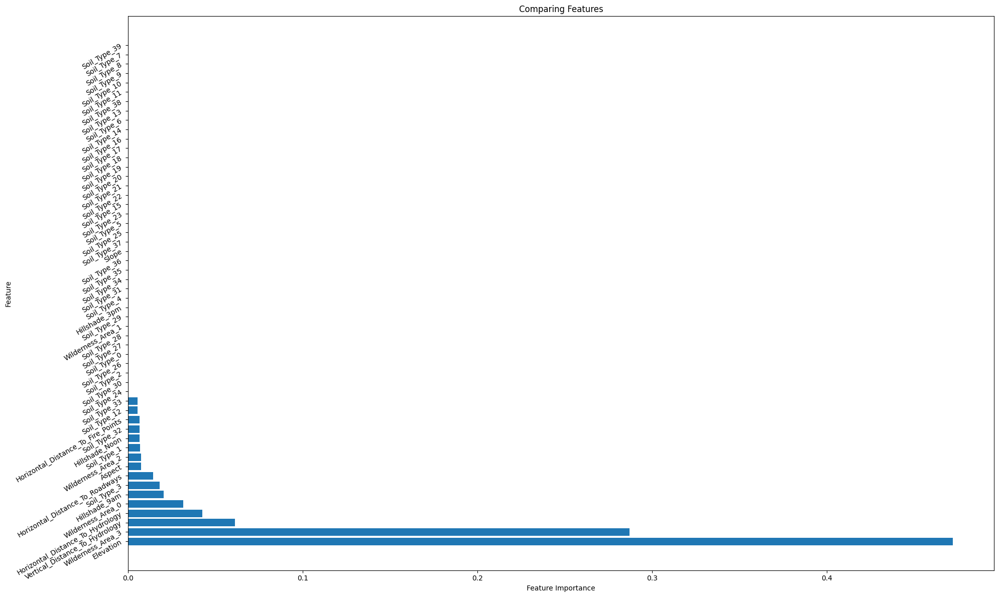

In [ ]:
# Load the Forest Cover Type dataset
data = fdata

# Split the data into labels and features
X = data.data
y = data.target

# Feature scaling
scaler = StandardScaler()
X_scaled_ada = scaler.fit_transform(X)

# Split data into training and testing sets
X_train_ada, X_test_ada, y_train_ada, y_test_ada = train_test_split(X_scaled_ada, y, test_size=0.25, random_state=42)

# Training the model
adaboost_classifier = AdaBoostClassifier(n_estimators=150, algorithm='SAMME', random_state=42)
adaboost_classifier.fit(X_train_ada, y_train_ada)

# Function to plot feature importances
def plot_feature_importances(classifier, feature_names):
    plt.figure(figsize=(20, 12))
    n_features = len(feature_names)

    # Sort feature importances and feature names by importance value
    sorted_indices = np.argsort(classifier.feature_importances_)[::-1]
    sorted_feature_importances = classifier.feature_importances_[sorted_indices]
    sorted_feature_names = [feature_names[i] for i in sorted_indices]

    # Feature importance barplot
    plt.barh(range(n_features), sorted_feature_importances, align='center')
    plt.yticks(np.arange(n_features), sorted_feature_names, rotation=30)
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature')
    plt.title('Comparing Features')
    plt.tight_layout()
    plt.show()

# Get feature names
feature_names = data.feature_names

# Plot feature importances
plot_feature_importances(adaboost_classifier, feature_names)

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

##### Decision Trees

In [ ]:
# Split data (75% training, 25% testing)
X_dt, y_dt = fdata.data, fdata.target  # split the data into labels and features
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(X_dt, y_dt,
                                                    test_size=0.25,  # test size as 25% (requested)
                                                    random_state=123) #optional but ensures that it's the same output each time it's run (a fixed seed of 123 is common, def. value is 0)

In [ ]:
dtree = DecisionTreeClassifier()
dtree = dtree.fit(X_train_dt, y_train_dt)

In [ ]:
param_grid = {
    'max_depth': [1, 2, 3, 4, 5],  # Max depth ranging from 1 to 5
    'criterion': ['gini', 'entropy'],  # Criterion for splitting
    'ccp_alpha': [0.0, 0.1, 0.2, 0.3, 0.4]  # Complexity parameter for pruning (Scikit Learn, n.d)
}


In [ ]:
scorers = {
    'balanced_accuracy': make_scorer(balanced_accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1_score': make_scorer(f1_score, average='weighted'),
    'roc_auc': make_scorer(roc_auc_score, needs_proba=True, multi_class='ovr')
}

In [ ]:
grid_search_dt = GridSearchCV(estimator=DecisionTreeClassifier(random_state=123),
                           param_grid=param_grid,
                           cv=5,
                           scoring=scorers,
                           refit='f1_score')

In [ ]:
grid_search_dt.fit(X_train_dt, y_train_dt)

###########################################################################################
## This code was developed with existing code on how to fit a grid search (Github, n.d.) ##
###########################################################################################

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=123),
             param_grid={'ccp_alpha': [0.0, 0.1, 0.2, 0.3, 0.4],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5]},
             refit='f1_score',
             scoring={'balanced_accuracy': make_scorer(balanced_accuracy_score),
                      'f1_score': make_scorer(f1_score, average=weighted),
                      'precision': make_scorer(precision_score, average=weighted),
                      'recall': make_scorer(recall_score, average=weighted),
                      'roc_auc': make_scorer(roc_auc_score, needs_proba=True, multi_class=ovr)})

In [ ]:
best_dtree = grid_search_dt.best_estimator_

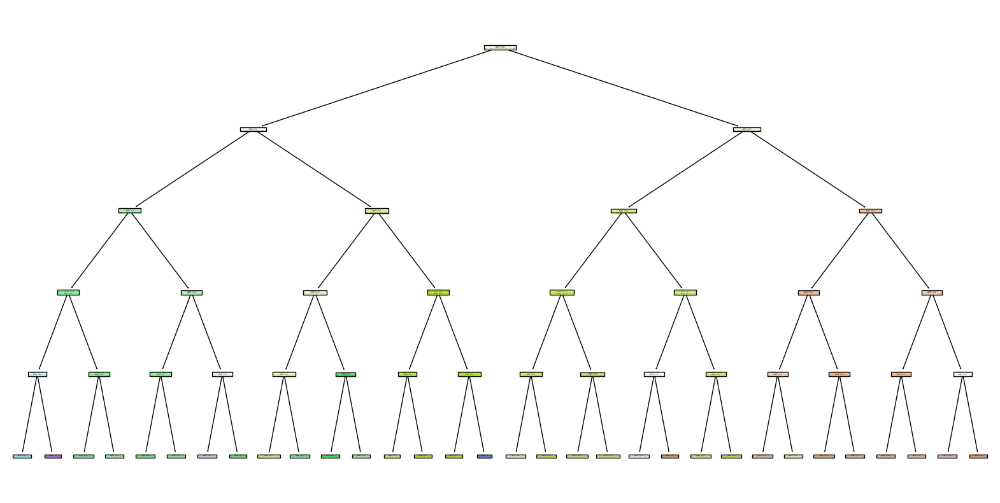

In [ ]:
plt.figure(figsize=(20,10))
plot_tree(best_dtree, filled=True, feature_names=fdata.feature_names)
plt.show()

##### Extra Trees

In [ ]:
X_et, y_et = fdata.data, fdata.target  # split the data into labels and features
X_train_et, X_test_et, y_train_et, y_test_et = train_test_split(X_et, y_et,
                                                    test_size=0.25,  # test size as 25% (requested)
                                                    random_state=123) #optional but ensures that it's the same output each time it's run (a fixed seed of 123 is common, def. value is 0)


In [ ]:
extra_trees = ExtraTreesClassifier(random_state=123) #random state keeps it fixed
extra_trees.fit(X_train_et, y_train_et)

ExtraTreesClassifier(random_state=123)

In [ ]:
param_grid_et = {
    'n_estimators': [50, 100, 150],
    'class_weight': [None, 'balanced']
}

In [ ]:
scorers_et = {
    'balanced_accuracy': make_scorer(balanced_accuracy_score),
    'precision': make_scorer(precision_score, average='weighted'),
    'recall': make_scorer(recall_score, average='weighted'),
    'f1_score': make_scorer(f1_score, average='weighted'),
    'roc_auc': make_scorer(roc_auc_score, needs_proba=True, multi_class='ovr')
}

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py:548: FutureWarning: The `needs_threshold` and `needs_proba` parameter are deprecated in version 1.4 and will be removed in 1.6. You can either let `response_method` be `None` or set it to `predict` to preserve the same behaviour.
  warnings.warn(


In [ ]:
grid_search_et = GridSearchCV(extra_trees, param_grid_et)
grid_search_et.fit(X_train_et, y_train_et)

###########################################################################################
## This code was developed with existing code on how to fit a grid search (Github, n.d.) ##
###########################################################################################

GridSearchCV(estimator=ExtraTreesClassifier(random_state=123),
             param_grid={'class_weight': [None, 'balanced'],
                         'n_estimators': [50, 100, 150]})

In [ ]:
best_etree = grid_search_et.best_estimator

In [ ]:
def plot_feature_importance(best_etree, feature_names):
    feature_importance_levels = best_etree.feature_importances_
    sorted_features = np.argsort(importances)[::-1]
    names = [feature_names[i] for i in sorted_features]

    plt.figure(figsize=(20, 12))
    plt.title("Feature Importance")
    plt.bar(range(len(feature_names)), feature_importance_levels[sorted_features])
    plt.xticks(range(len(feature_names)), names, rotation=90)
    plt.show()

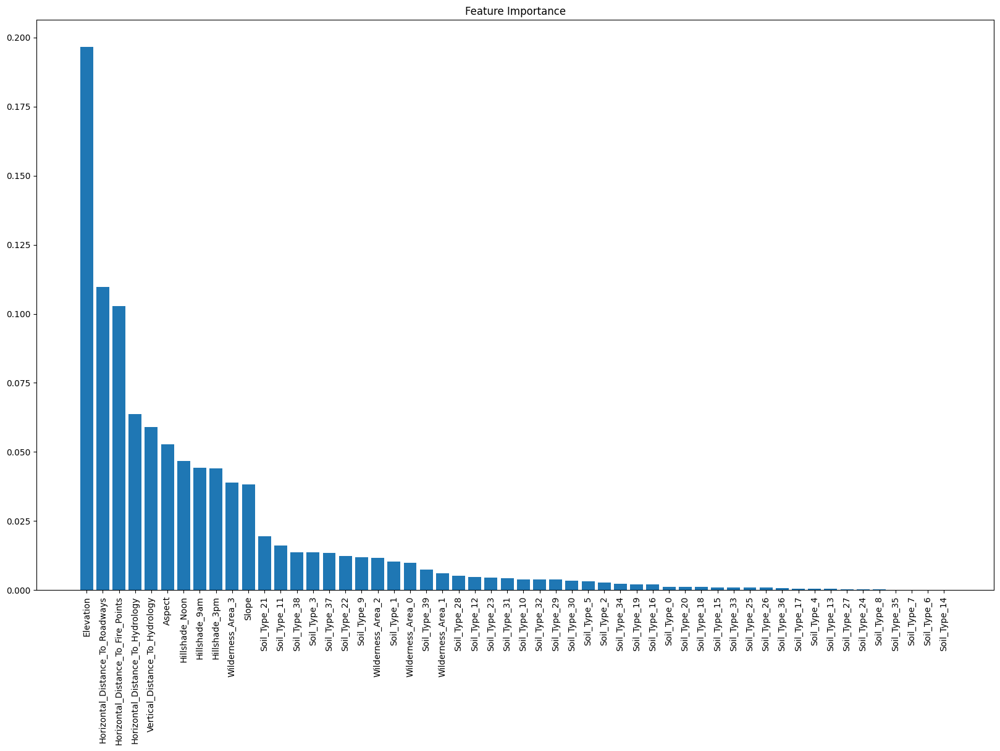

In [ ]:
plot_feature_importance(best_etree, feature_names=fdata.feature_names)


##### Gaussian Naive Bytes


**Intitial medthod and Parameter utilised**
*   Scaling: tandardScaler
*   Dimensionality Reduction: PCA(n_components=2)
*  Clustering Algorithm: Set Parameter as gnb_model = GaussianNB(var_smoothing=1e-9)



In [ ]:
# Load dataset (example using covtype dataset)
covtype = fdata
X_gnb = covtype.data
y_gnb = covtype.target

# Split the data into training and testing sets - 75/25
X_train, X_test, y_train, y_test = train_test_split(X_gnb , y_gnb, test_size=0.25, random_state=123)

# Standardize for scaling the dataset
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
X_train_gnb= pca.fit_transform(X_train_scaled)
X_test_gnb = pca.transform(X_test_scaled)

#######Create a Gaussian Naive Bayes classifier set as var_smoothing=1e-9############
gnb_model = GaussianNB(var_smoothing=1e-9)
#####################################################################################

# Fit the model to the training data
gnb_model.fit(X_train_gnb, y_train)

# Make predictions on the scaled test set using PCA-transformed data
y_pred_gnb = gnb_model.predict(X_test_gnb)
y_prob_gnb = gnb_model.predict_proba(X_test_gnb)

# Calculate precision, recall, F1-score, balanced accuracy, and ROC-AUC
precision_gnb = precision_score(y_test, y_pred_gnb, average='weighted')
recall_gnb = recall_score(y_test, y_pred_gnb, average='weighted')
f1_score_gnb = f1_score(y_test, y_pred_gnb, average='weighted')
balanced_acc_gnb = balanced_accuracy_score(y_test, y_pred_gnb)
roc_auc_gnb = roc_auc_score(y_test, y_prob_gnb, multi_class='ovr')

# Print the calculated metrics
print("Precision:", precision_gnb)
print("Recall:", recall_gnb)
print("F1-Score:", f1_score_gnb)
print("Balanced Accuracy:", balanced_acc_gnb)
print("ROC-AUC Score:", roc_auc_gnb)

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.5010604406489605
Recall: 0.5539025011531603
F1-Score: 0.5090377776741538
Balanced Accuracy: 0.25239340400858007
ROC-AUC Score: 0.8262539594386743


##### K-Nearest Neighbours


**Initial method and Parameter utilised**
*   Scaling: StandardScaler
*   Dimensionality Reduction: PCA(n_components=2)
*  Clustering Algorithm: knn_model2 = KNeighborsClassifier(n_neighbors=7)


In [ ]:
# Load dataset (example using covtype dataset)
covtype = fdata
X_knn = covtype.data
y_knn = covtype.target

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

# Split the data into training and testing sets - 75/25
X_train, X_test, y_train, y_test = train_test_split(X_knn, y_knn, test_size=0.25, random_state=123)

# Standardise for scaling the dataset
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)


###########K-nearest neighbors classifier parameter set as and set n_neighbors=2##########
knn_model1 = KNeighborsClassifier(n_neighbors=2)
###########################################################################################

# Set the model for training data
knn_model1.fit(X_train_pca, y_train)

# Make predictions on the scaled test set using PCA-transformed data
y_pred_knn1 = knn_model1.predict(X_test_pca)
y_prob_knn1 = knn_model1.predict_proba(X_test_pca)

# Calculate precision, recall, F1-score, balanced accuracy, and ROC-AUC
precision_knn = precision_score(y_test, y_pred_knn1, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn1, average='weighted')
f1_score_knn = f1_score(y_test, y_pred_knn1, average='weighted')
balanced_acc_knn = balanced_accuracy_score(y_test, y_pred_knn1)



roc_auc_knn = roc_auc_score(y_test, y_prob_knn1, multi_class='ovr')

# Print the calculated metrics
print("Precision:", precision_knn)
print("Recall:", recall_knn)
print("F1-Score:", f1_score_knn)
print("Balanced Accuracy:", balanced_acc_knn)
print("ROC-AUC Score:", roc_auc_knn)



##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

Precision: 0.5001106566139536
Recall: 0.490172320020929
F1-Score: 0.4722695819544371
Balanced Accuracy: 0.27454378987178485
ROC-AUC Score: 0.6434380527958684


##### Logistic Regression

In [ ]:
# Split the data into feature and target variables
X = fdata.data
y = fdata.target

# Split the data into training and testing sets - 75/25
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

# Standardise the features using scaling. Standard Scaler has been chosen.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Design the first model to fit Logistic Regression with cross validation
#Set the initial parameters as well
model1 = LogisticRegressionCV(cv=2, random_state=0)
model1.fit(X_train_scaled, y_train)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

LogisticRegressionCV(cv=2, random_state=0)

##### Random Forest

In [ ]:
# Split the data into feature and target variables
X = fdata.data
y = fdata.target

# Split the data into training and testing sets using 25% and 75% split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

# Standardise the features using scaling. Standard Scaler has been chosen.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Random Forest classifier using recommended metrics from sci-Kit learn API
rf_clf1 = RandomForestClassifier(n_estimators=7, max_features=0.3, min_samples_split=2, max_depth=2, random_state=0)

# Fit the classifier to the scaled training data
rf_clf1.fit(X_train_scaled, y_train)

# Get predictions on the scaled test set
y_pred_rf1 = rf_clf1.predict(X_test_scaled)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

### **Evaluation**

##### Ada Boost

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Metrics for AdaBoost Classifier:
Accuracy: 0.6208133394835219
Precision: 0.6163372282300326
Recall: 0.6208133394835219
F1-Score: 0.6168527456761853
Balanced Accuracy: 0.3729869887065989
ROC AUC Score: 0.8472261415138386


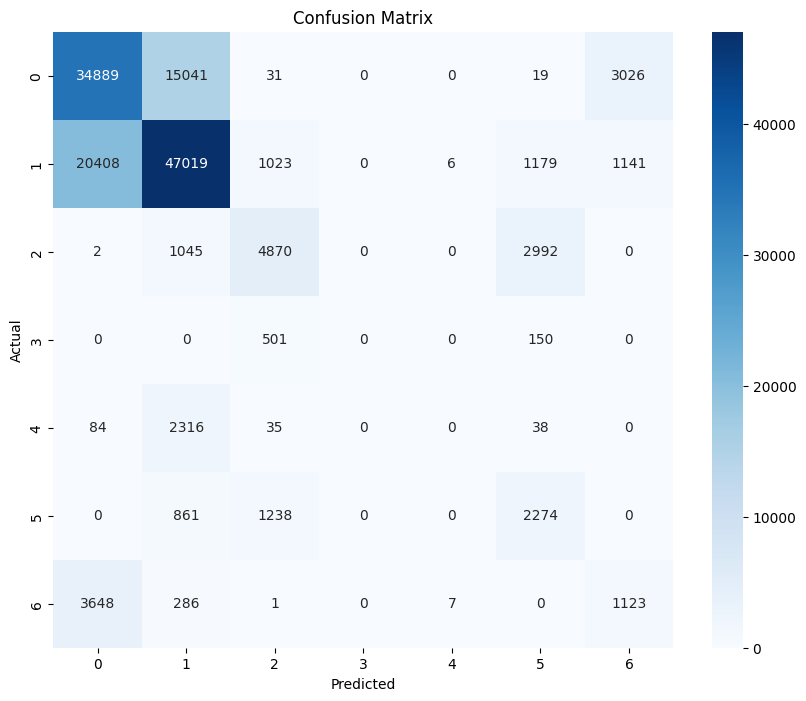

In [ ]:
# Split the data into labels and features
X = fdata.data
y = fdata.target

# Feature scaling
scaler = StandardScaler()
X_scaled_ada = scaler.fit_transform(X)

# Split data into training and testing sets
X_train_ada, X_test_ada, y_train_ada, y_test_ada = train_test_split(X_scaled_ada, y, test_size=0.25, random_state=42)

# Model training
adaboost_classifier = AdaBoostClassifier(n_estimators=150, algorithm='SAMME', random_state=42)
adaboost_classifier.fit(X_train_ada, y_train_ada)

# Model evaluation
y_pred_ada = adaboost_classifier.predict(X_test_ada)
y_probs_ada = adaboost_classifier.predict_proba(X_test_ada)

# Use 'ovr' strategy for multiclass ROC AUC
roc_auc_ada = roc_auc_score(y_test_ada, y_probs_ada, multi_class='ovr')

# Other Evaluation Metrics
accuracy_ada = accuracy_score(y_test_ada, y_pred_ada)
precision_ada = precision_score(y_test_ada, y_pred_ada, average='weighted')
recall_ada = recall_score(y_test_ada, y_pred_ada, average='weighted')
f1_ada = f1_score(y_test_ada, y_pred_ada, average='weighted')
balanced_acc_ada = balanced_accuracy_score(y_test_ada, y_pred_ada)

print("Metrics for AdaBoost Classifier:")
print("Accuracy:", accuracy_ada)
print("Precision:", precision_ada)
print("Recall:", recall_ada)
print("F1-Score:", f1_ada)
print("Balanced Accuracy:", balanced_acc_ada)
print("ROC AUC Score:", roc_auc_ada)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test_ada, y_pred_ada)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

     Class  ROC AUC Score
0  Class 1       0.684830
1  Class 2       0.633409
2  Class 3       0.834250
3  Class 4       0.027148
4  Class 5       0.748536
5  Class 6       0.215097


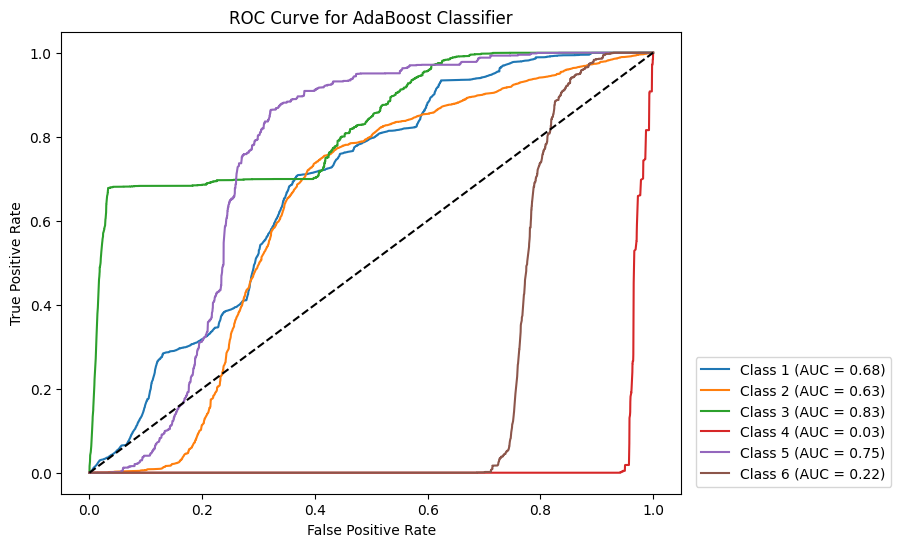

In [ ]:
#CURVE PRESENTED HERE AND SAVED. SUBPLOTS OF ALL ROCS TO BE SHOWN LATER IN NOTEBOOK
# Split the data into labels and features
X = fdata.data
y = fdata.target

# Feature scaling
scaler = StandardScaler()
X_scaled_ada = scaler.fit_transform(X)

# Split data into training and testing sets
X_train_ada, X_test_ada, y_train_ada, y_test_ada = train_test_split(X_scaled_ada, y, test_size=0.25, random_state=42)

# Model training
adaboost_classifier = AdaBoostClassifier(n_estimators=150, algorithm='SAMME',  random_state=42)
adaboost_classifier.fit(X_train_ada, y_train_ada)

# ROC Curve
y_probs_ada = adaboost_classifier.predict_proba(X_test_ada)

# Compute ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(np.unique(y))):
    if sum(y_test_ada == i) > 0:  # Checks if there are samples for this class
        fpr[i], tpr[i], _ = roc_curve((y_test_ada == i), y_probs_ada[:, i])
        roc_auc[i] = roc_auc_score((y_test_ada == i), y_probs_ada[:, i])

# Create a DataFrame to display ROC AUC scores for each class
roc_auc_df = pd.DataFrame({'Class': [f'Class {i}' for i in range(len(np.unique(y))) if i in roc_auc],
                           'ROC AUC Score': [roc_auc[i] for i in roc_auc]})

# Display the DataFrame
print(roc_auc_df)

# Plot ROC curve
plt.figure(figsize=(8, 6))

# Plot ROC curve for each class
for i in range(len(np.unique(y))):
    if i in roc_auc:  # Check if ROC AUC score is available for this class
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for AdaBoost Classifier')

# Place legend outside the plot
plt.legend(loc="lower right", bbox_to_anchor=(1.35, 0))

plt.show()

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

##### Decision Trees

In [ ]:
# Eval metrics on test model
y_pred_dt = best_dtree.predict(X_test_dt)

precision_dt = precision_score(y_test_dt, y_pred_dt, average='weighted')
print("Precision:", precision_dt)

recall_dt = recall_score(y_test_dt, y_pred_dt, average='weighted')
print("Recall:", recall_dt)

f1_score_dt = f1_score(y_test_dt, y_pred_dt, average='weighted')
print("F1-Score:", f1_score_dt)

balanced_acc_dt = balanced_accuracy_score(y_test_dt, y_pred_dt)
print("Balanced Accuracy:", balanced_acc_dt)

roc_auc_dt = roc_auc_score(y_test_dt, best_dtree.predict_proba(X_test_dt), multi_class='ovr')
print("ROC_AUC:", roc_auc_dt)

Precision: 0.6956422626064707
Recall: 0.6992764349101224
F1-Score: 0.6869168755218892
Balanced Accuracy: 0.4592140705317322
ROC_AUC: 0.9208886548094993


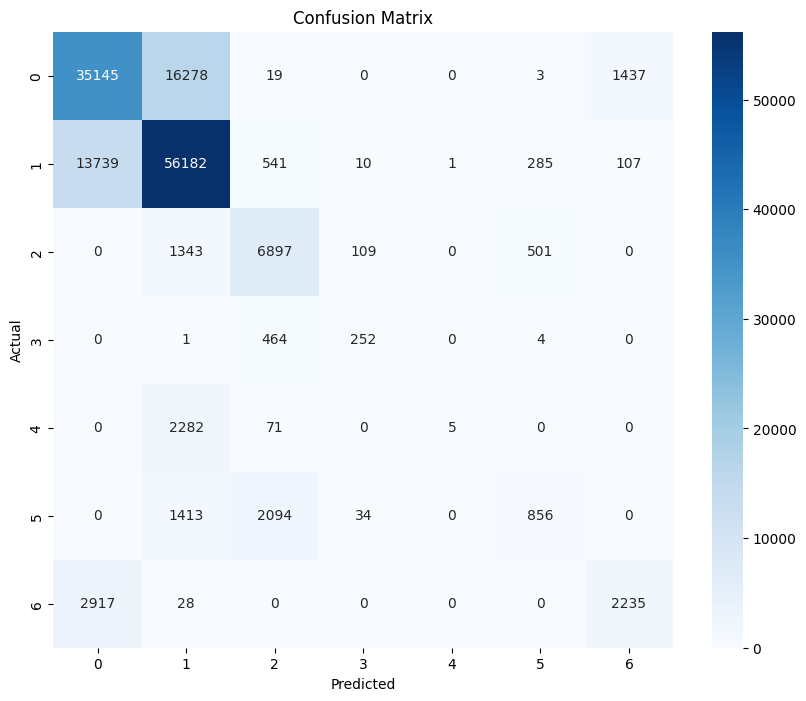

In [ ]:
conf_matrix_dt = confusion_matrix(y_test_dt, y_pred_dt)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


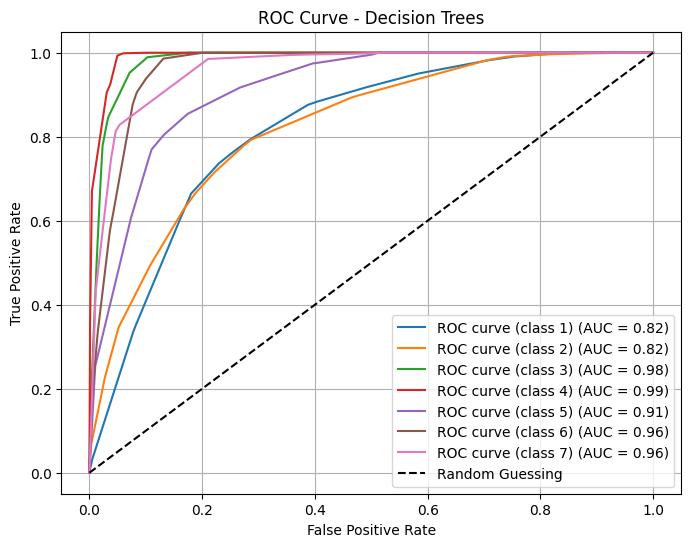

In [ ]:
#CURVE PRESENTED HERE AND SAVED. SUBPLOTS OF ALL ROCS TO BE SHOWN LATER IN NOTEBOOK
y_pred_proba_dt = best_dtree.predict_proba(X_test_dt)

# Calculate ROC curve and ROC AUC score
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(best_dtree.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test_dt, y_pred_proba[:, i], pos_label=best_dtree.classes_[i])
    roc_auc[i] = roc_auc_score(y_test_dt == best_dtree.classes_[i], y_pred_proba[:, i])

# Plot ROC curve
plt.figure(figsize=(8, 6))
for i in range(len(best_dtree.classes_)):
    plt.plot(fpr[i], tpr[i], label='ROC curve (class {}) (AUC = {:.2f})'.format(best_dtree.classes_[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Trees')
plt.legend(loc='best')
plt.grid(True)
plt.show()


######################################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
######################################################################

##### Extra Trees

In [ ]:
y_pred_et = best_etree.predict(X_test_et)

In [ ]:
precision_et = precision_score(y_test_et, y_pred_et, average='weighted')
print("Precision:", precision_et)

recall_et = recall_score(y_test_et, y_pred_et, average='weighted')
print("Recall:", recall_et)

f1_score_et = f1_score(y_test_et, y_pred_et, average='weighted')
print("F1-Score:", f1_score_et)

balanced_acc_et = balanced_accuracy_score(y_test_et, y_pred_et)
print("Balanced Accuracy:", balanced_acc_et)

roc_auc_et = roc_auc_score(y_test_et, best_etree.predict_proba(X_test_et), multi_class='ovr')
print("ROC_AUC:", roc_auc_et)


Precision: 0.951655903118639
Recall: 0.9515879190102786
F1-Score: 0.9513591630622291
Balanced Accuracy: 0.9054797098680414
ROC_AUC: 0.9975637034010383


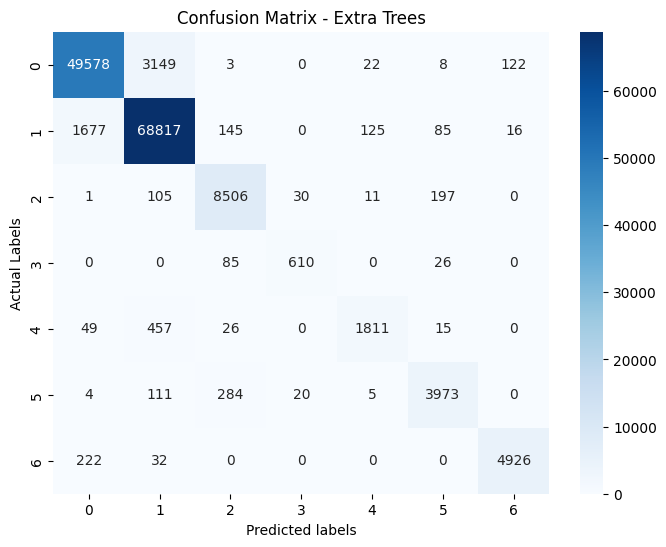

In [ ]:
conf_matrix_et = confusion_matrix(y_test_et, y_pred_et)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_et, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted labels')
plt.ylabel('Actual Labels')
plt.title('Confusion Matrix - Extra Trees')
plt.show()


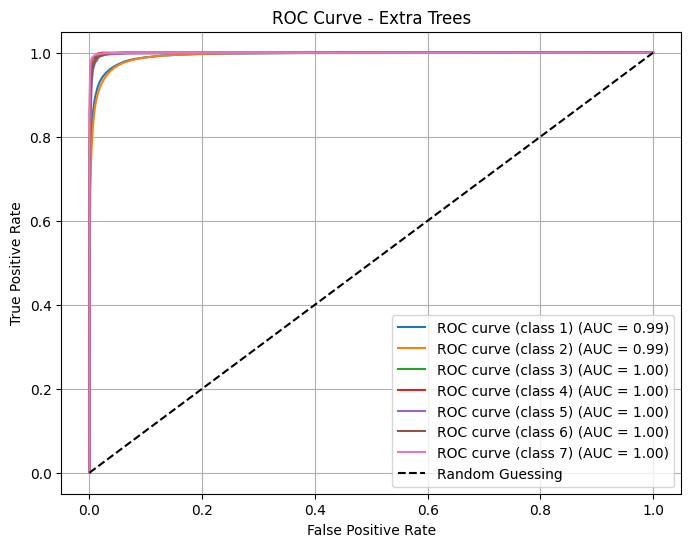

In [ ]:
#CURVE PRESENTED HERE AND SAVED. SUBPLOTS OF ALL ROCS TO BE SHOWN LATER IN NOTEBOOK
y_pred_proba_et = best_etree.predict_proba(X_test_et)

# Compute ROC curve and ROC AUC score
fpr_et = dict()
tpr_et = dict()
roc_auc_et = dict()
for i in range(len(best_etree.classes_)):
    fpr_et[i], tpr_et[i], _ = roc_curve(y_test_et, y_pred_proba_et[:, i], pos_label=best_etree.classes_[i])
    roc_auc_et[i] = roc_auc_score(y_test_et == best_etree.classes_[i], y_pred_proba_et[:, i])

# Plot ROC curve
plt.figure(figsize=(8, 6))
for i in range(len(best_etree.classes_)):
    plt.plot(fpr_et[i], tpr_et[i], label='ROC curve (class {}) (AUC = {:.2f})'.format(best_etree.classes_[i], roc_auc_et[i]))
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Extra Trees')
plt.legend(loc='best')
plt.grid(True)
plt.show()

######################################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
######################################################################

##### Gaussian Naive Bytes

**Implement parameter from initial medthod as priors=priors, var_smoothing=1e-9**

In [ ]:
# Create a Gaussian Naive Bayes classifier with priors
n_classes = len(np.unique(y_train))
priors = np.ones(n_classes) / n_classes

##### Implemwnt parameter from initial medthod as priors=priors, var_smoothing=1e-9########
gnb_model2 = GaussianNB(priors=priors, var_smoothing=1e-9)
###########################################################################################

# Fit the model to the training data
gnb_model2.fit(X_train_gnb, y_train)

# Make predictions on the scaled test set using PCA-transformed data
y_pred_gnb2 = gnb_model2.predict(X_test_gnb)
y_prob_gnb2 = gnb_model2.predict_proba(X_test_gnb)

# Calculate precision, recall, F1-score, balanced accuracy, and ROC-AUC
precision_gnb = precision_score(y_test, y_pred_gnb2, average='weighted')
recall_gnb = recall_score(y_test, y_pred_gnb2, average='weighted')
f1_score_gnb = f1_score(y_test, y_pred_gnb2, average='weighted')
balanced_acc_gnb = balanced_accuracy_score(y_test, y_pred_gnb)
roc_auc_gnb = roc_auc_score(y_test, y_prob_gnb2, multi_class='ovr')

# Print the calculated metrics
print("Precision:", precision_gnb)
print("Recall:", recall_gnb)
print("F1-Score:", f1_score_gnb)
print("Balanced Accuracy:", balanced_acc_gnb)
print("ROC-AUC Score:", roc_auc_gnb)
##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

Precision: 0.5303733451306308
Recall: 0.2888890418786531
F1-Score: 0.34353923136407144
Balanced Accuracy: 0.25239340400858007
ROC-AUC Score: 0.8131780417815901


**Report for best parameter**

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, balanced_accuracy_score, roc_auc_score

# initial parameterhas higher ROC-AUC Score:
gnb_model = GaussianNB(var_smoothing=1e-9)

# Set the model for training data
gnb_model.fit(X_train_gnb, y_train)

# Make predictions on the scaled test
y_pred_gnb = gnb_model.predict(X_test_gnb)
y_prob_gnb = gnb_model.predict_proba(X_test_gnb)

# Print the classification report
print("Classification Report: Initial model:")
print(classification_report(y_test, y_pred_gnb))

# Generate and print balanced accuracy and ROC-AUC for the GNB model
balanced_acc = balanced_accuracy_score(y_test, y_pred_gnb)
roc_auc = roc_auc_score(y_test, y_prob_gnb, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)


Classification Report: Initial model:
              precision    recall  f1-score   support

           1       0.53      0.34      0.41     52882
           2       0.56      0.80      0.66     70865
           3       0.53      0.62      0.57      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.55    145253
   macro avg       0.23      0.25      0.24    145253
weighted avg       0.50      0.55      0.51    145253



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Balanced Accuracy: 0.25239340400858007
ROC-AUC Score: 0.8262539594386743


**Present Confusion matrix**

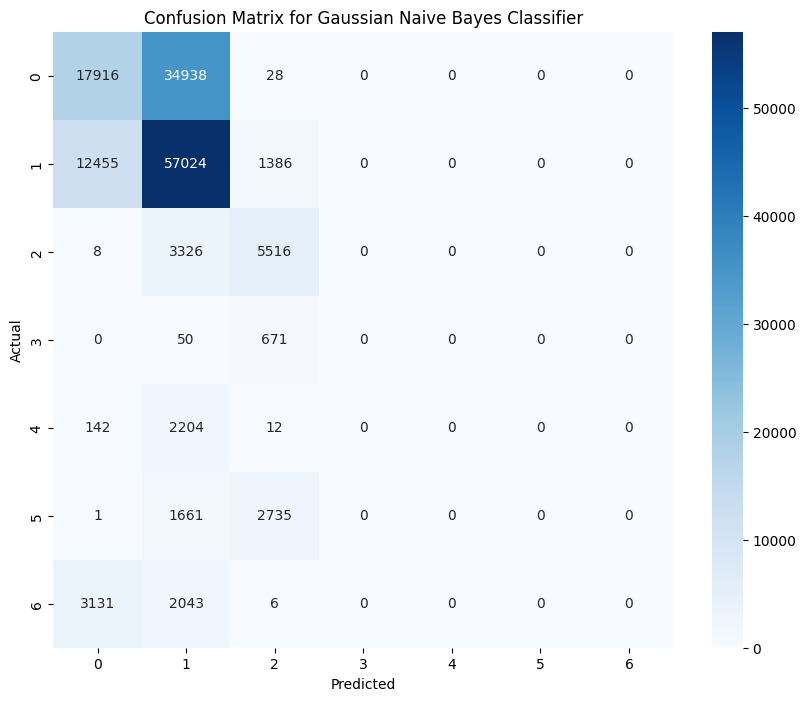

In [ ]:
# Create a Gaussian Naive Bayes classifier
gnb_model = GaussianNB(var_smoothing=1e-9)

# Fit the GNB model to the training data
gnb_model.fit(X_train_gnb,y_train)

# Make predictions on the test set
y_pred_gnb = gnb_model.predict(X_test_gnb)

# Ensure that y_test and y_pred_gnb1 have the same number of samples
y_test_subset = y_test[:len(y_pred_gnb1)]

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_subset, y_pred_gnb1)

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gaussian Naive Bayes Classifier')
plt.show()

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

**Present ROC AUC Score**

     Class  ROC AUC Score
0  Class 1       0.457379
1  Class 2       0.454010
2  Class 3       0.943928
3  Class 4       0.395916
4  Class 5       0.692420
5  Class 6       0.099797


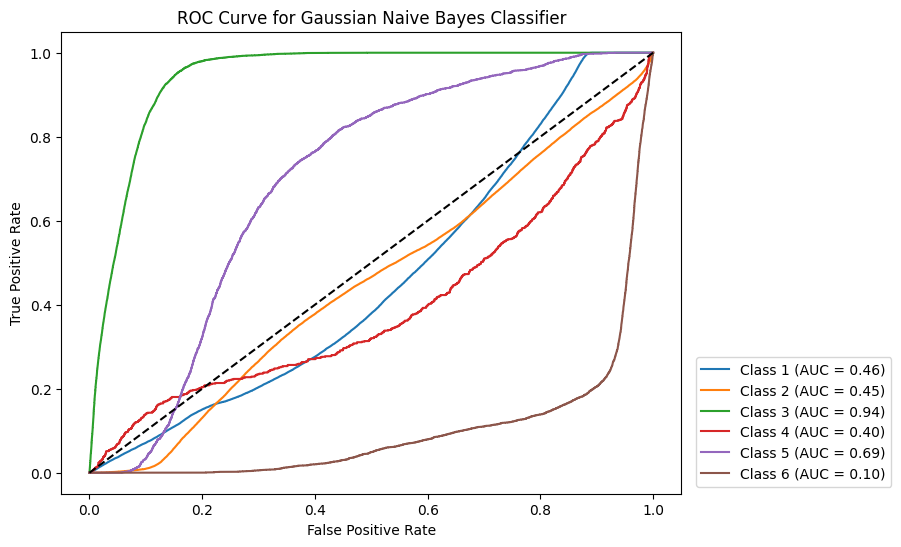

In [ ]:
#CURVE RAN HERE AND SAVED FOR SUBPLOT.
# Fit the Gaussian Naive Bayes model to the training data
gnb_model = GaussianNB(var_smoothing=1e-9)
gnb_model.fit(X_train_gnb, y_train)

# Predict probabilities for the test set
y_pred_gnb1 = gnb_model.predict(X_test_gnb)


# Compute ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(np.unique(y_test))):
    if sum(y_test == i) > 0:  # Checks if there are samples for this class
        fpr[i], tpr[i], _ = roc_curve((y_test == i), y_probs_gnb[:, i])
        roc_auc[i] = roc_auc_score((y_test == i), y_probs_gnb[:, i])

# Create a DataFrame to display ROC AUC scores for each class
roc_auc_df = pd.DataFrame({'Class': [f'Class {i}' for i in range(len(np.unique(y_test))) if i in roc_auc],
                           'ROC AUC Score': [roc_auc[i] for i in roc_auc]})

# Display the DataFrame
print(roc_auc_df)

# Plot ROC curve
plt.figure(figsize=(8, 6))

# Plot ROC curve for each class
for i in range(len(np.unique(y_test))):
    if i in roc_auc:  # Check if ROC AUC score is available for this class
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Gaussian Naive Bayes Classifier')

# Place legend outside the plot
plt.legend(loc="lower right", bbox_to_anchor=(1.35, 0))

plt.show()


##########################################################################################################
#####REFERENCE###########################################################################################
##Nantasenamat, c., 2022. Machine Learning in Python: Making Receiver Operating Characteristic (ROC) curve
##Available at: https://github.com/dataprofessor/code/blob/master/python/ROC_curve.ipynb ##
###(Accessed: March 3, 2024).
###########################################################################################################


##### K-Nearest Neighbours

**Compare while using 11 Clusters but set weights as "uniform" and "distance"**

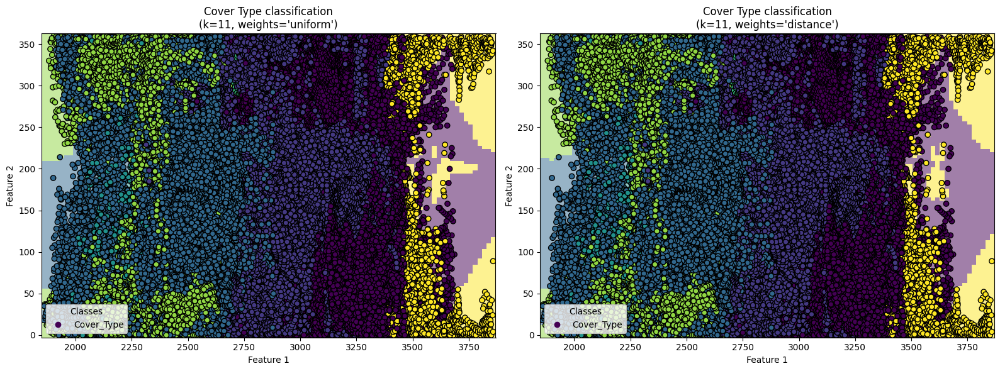

In [ ]:
# Rename dataset
covtype = fdata
X = covtype.data[:, :2]  # Using only the first two features for visualization
y = covtype.target

##### Define the pipeline with K Nearest Neighbors classifier##################
clf = Pipeline(
    steps=[
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=7))  # Adjust k as needed
    ]
)

_, axs = plt.subplots(ncols=2, figsize=(16, 6))  # Increase the figure size

for ax, weights in zip(axs, ("uniform", "distance")):
    # Set KNN weights parameter
    clf.set_params(knn__weights=weights).fit(X, y)  # Fit the model
    # Plot decision boundaries
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        X,
        response_method="predict",
        plot_method="pcolormesh",
        xlabel="Feature 1",
        ylabel="Feature 2",
        shading="auto",
        alpha=0.5,
        ax=ax,
    )
    # Plot scatter points for each class with hue
    scatter = disp.ax_.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', edgecolors="k")  # Use a colormap for better visualization
    # Add legend
    disp.ax_.legend(
        scatter.legend_elements()[0],
        covtype.target_names,
        loc="lower left",
        title="Classes",
    )
    # Set plot title
    _ = disp.ax_.set_title(
        f"Cover Type classification\n(k={clf[-1].n_neighbors}, weights={weights!r})"
    )

plt.tight_layout()  # Adjust subplot parameters to give specified padding
plt.show()

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

**Set parameter for K-nearest neighbors classifier as n_neighbors=7**

In [ ]:
#####Create a K-nearest neighbors classifier and set as n_neighbors=7#####
knn_model2 = KNeighborsClassifier(n_neighbors=7)
##########################################################################

# Set the model for training data
knn_model2.fit(X_train_pca, y_train)

# Make predictions on the scaled test set using PCA-transformed data
y_pred_knn2 = knn_model2.predict(X_test_pca)
y_prob_knn2 = knn_model2.predict_proba(X_test_pca)

# Calculate precision, recall, F1-score, balanced accuracy, and ROC-AUC
precision_knn = precision_score(y_test, y_pred_knn2, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn2, average='weighted')
f1_score_knn = f1_score(y_test, y_pred_knn2, average='weighted')
balanced_acc_knn = balanced_accuracy_score(y_test, y_pred_knn2)



roc_auc_knn = roc_auc_score(y_test, y_prob_knn2, multi_class='ovr')

# Print the calculated metrics
print("Precision:", precision_knn)
print("Recall:", recall_knn)
print("F1-Score:", f1_score_knn)
print("Balanced Accuracy:", balanced_acc_knn)
print("ROC-AUC Score:", roc_auc_knn)


#####################################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
######################################################################

Precision: 0.5307085146179592
Recall: 0.5394656220525565
F1-Score: 0.527218081020024
Balanced Accuracy: 0.30106826775952655
ROC-AUC Score: 0.740421900630156


**Implement new parameter by adding weights='distance', metric='minkowski',algorithm='auto'**

In [ ]:
#######Modified parameter by adding weights='distance', metric='minkowski',algorithm='auto'##############
knn_model3 = KNeighborsClassifier(n_neighbors=7, weights='uniform', metric='minkowski',algorithm='auto')
###########################################################################################################

# Set the model for training data
knn_model3.fit(X_train_pca, y_train)

# Make predictions on the scaled test set using PCA-transformed data
y_pred_knn3 = knn_model3.predict(X_test_pca)
y_prob_knn3 = knn_model3.predict_proba(X_test_pca)

# Calculate precision, recall, F1-score, balanced accuracy, and ROC-AUC
precision_knn = precision_score(y_test, y_pred_knn3, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn3, average='weighted')
f1_score_knn = f1_score(y_test, y_pred_knn3, average='weighted')
balanced_acc_knn = balanced_accuracy_score(y_test, y_pred_knn3)

roc_auc_knn = roc_auc_score(y_test, y_prob_knn3, multi_class='ovr')

# Print the calculated metrics
print("Precision:", precision_knn)
print("Recall:", recall_knn)
print("F1-Score:", f1_score_knn)
print("Balanced Accuracy:", balanced_acc_knn)
print("ROC-AUC Score:", roc_auc_knn)


##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

Precision: 0.5307085146179592
Recall: 0.5394656220525565
F1-Score: 0.527218081020024
Balanced Accuracy: 0.30106826775952655
ROC-AUC Score: 0.740421900630156


**Change weight 'distance' and the metric to 'euclidean'**

In [ ]:
###### Modified parameter by adding weights='distance', metric='euclidean',algorithm='auto'#################
knn_model4 = KNeighborsClassifier(n_neighbors=7, weights='distance', metric='euclidean',algorithm='auto')
############################################################################################################

# Set the model for training data
knn_model4.fit(X_train_pca, y_train)

# Make predictions on the scaled
y_pred_knn4 = knn_model4.predict(X_test_pca)
y_prob_knn4 = knn_model4.predict_proba(X_test_pca)

# Calculate precision, recall, F1-score, balanced accuracy, and ROC-AUC
precision_knn = precision_score(y_test, y_pred_knn4, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn4, average='weighted')
f1_score_knn = f1_score(y_test, y_pred_knn4, average='weighted')
balanced_acc_knn = balanced_accuracy_score(y_test, y_pred_knn4)

roc_auc_knn = roc_auc_score(y_test, y_prob_knn4, multi_class='ovr')

# Print the calculated metrics
print("Precision:", precision_knn)
print("Recall:", recall_knn)
print("F1-Score:", f1_score_knn)
print("Balanced Accuracy:", balanced_acc_knn)
print("ROC-AUC Score:", roc_auc_knn)


##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

Precision: 0.5128001471021357
Recall: 0.5252421636730394
F1-Score: 0.5162559381269032
Balanced Accuracy: 0.311742522350049
ROC-AUC Score: 0.7378861333608008


**Change weight 'distance' and the metric to 'minkowski'**

In [ ]:
# Modified parameter by adding weights='distance', metric='minkowski',algorithm='auto'
knn_model3 = KNeighborsClassifier(n_neighbors=7, weights='uniform', metric='minkowski',algorithm='auto')

# Set the model for training data
knn_model3.fit(X_train_pca, y_train)

# Make predictions on the scaled test set using PCA-transformed data
y_pred_knn3 = knn_model3.predict(X_test_pca)
y_prob_knn3 = knn_model3.predict_proba(X_test_pca)

# Calculate precision, recall, F1-score, balanced accuracy, and ROC-AUC
precision_knn = precision_score(y_test, y_pred_knn3, average='weighted')
recall_knn = recall_score(y_test, y_pred_knn3, average='weighted')
f1_score_knn = f1_score(y_test, y_pred_knn3, average='weighted')
balanced_acc_knn = balanced_accuracy_score(y_test, y_pred_knn3)

roc_auc_knn = roc_auc_score(y_test, y_prob_knn3, multi_class='ovr')

# Print the calculated metrics
print("Precision:", precision_knn)
print("Recall:", recall_knn)
print("F1-Score:", f1_score_knn)
print("Balanced Accuracy:", balanced_acc_knn)
print("ROC-AUC Score:", roc_auc_knn)


##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

Precision: 0.5307085146179592
Recall: 0.5394656220525565
F1-Score: 0.527218081020024
Balanced Accuracy: 0.30106826775952655
ROC-AUC Score: 0.740421900630156


***Generate a report for knn_model5 = KNeighborsClassifier(n_neighbors=7) ***

In [ ]:
####Parameter set as n_neighbors=7 showed the best ROC-AUC Score ###
knn_model5 = KNeighborsClassifier(n_neighbors=7)

# Set the model for training data
knn_model5.fit(X_train_pca, y_train)

# Make predictions on the scaled test
y_pred_knn5 = knn_model5.predict(X_test_pca)
y_prob_knn5 = knn_model5.predict_proba(X_test_pca)

# Print the classification report
print("Classification Report: Initial model:")
print(classification_report(y_test, y_pred_knn5))

# Generate and print balanced accuracy and ROC-AUC for the KNN model
balanced_acc = balanced_accuracy_score(y_test, y_pred_knn5)
roc_auc = roc_auc_score(y_test, y_prob_knn5, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)



##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

Classification Report: Initial model:
              precision    recall  f1-score   support

           1       0.50      0.51      0.50     52882
           2       0.58      0.64      0.61     70865
           3       0.53      0.51      0.52      8850
           4       0.28      0.09      0.13       721
           5       0.45      0.09      0.15      2358
           6       0.32      0.15      0.20      4397
           7       0.48      0.12      0.19      5180

    accuracy                           0.54    145253
   macro avg       0.45      0.30      0.33    145253
weighted avg       0.53      0.54      0.53    145253

Balanced Accuracy: 0.30106826775952655
ROC-AUC Score: 0.740421900630156


**Present Confusion matrix**

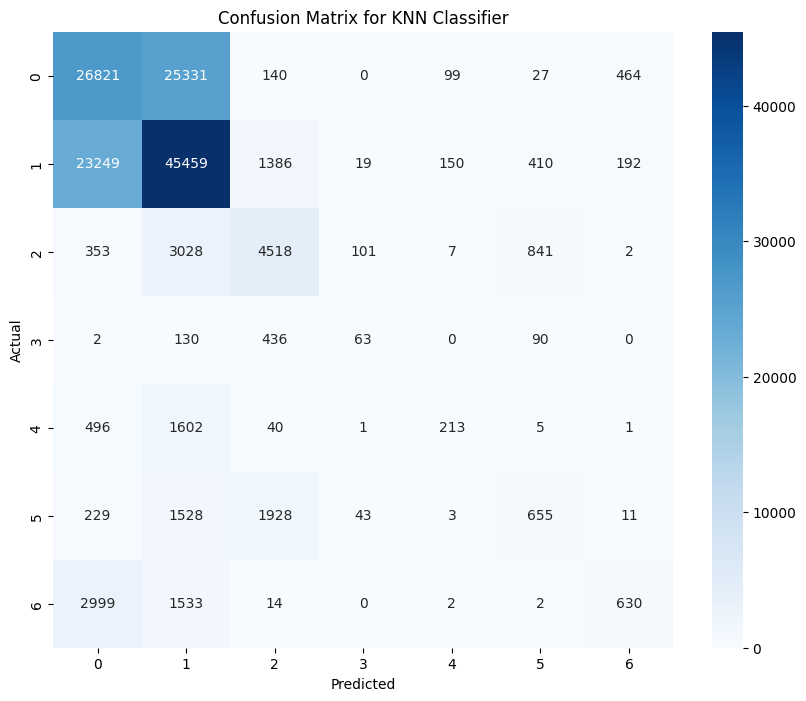

In [ ]:

# ########## the KNN model to the training data#######
knn_model5 = KNeighborsClassifier(n_neighbors=7)
knn_model5.fit(X_train_pca, y_train)

# Make predictions on the test set
y_pred_knn5 = knn_model5.predict(X_test_pca)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_knn5)

# Plot confusion matrix heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for KNN Classifier')
plt.show()

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE: (scikit-learn, n.d.) ##
##############################################################

**Present ROC AUC Score**

     Class  ROC AUC Score
0  Class 1       0.465983
1  Class 2       0.455848
2  Class 3       0.578254
3  Class 4       0.458783
4  Class 5       0.496568
5  Class 6       0.427354


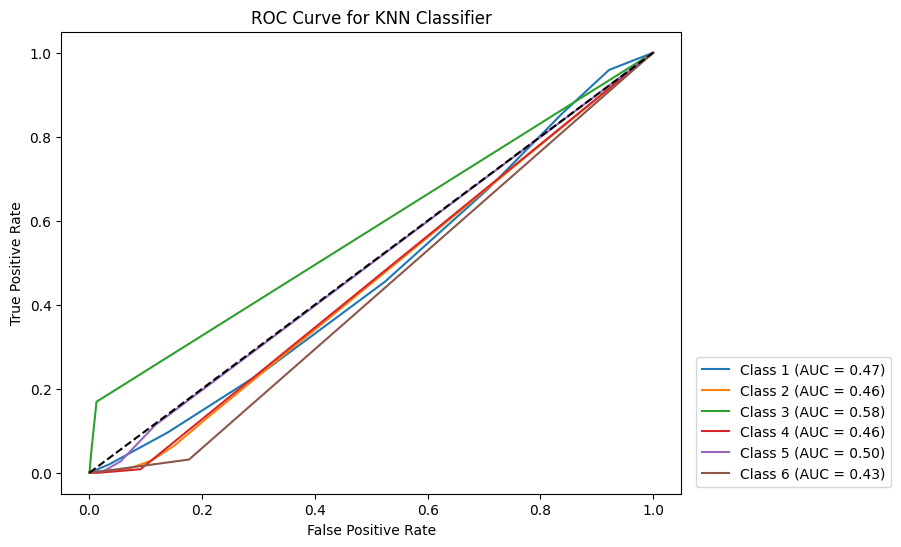

In [ ]:
#CURVE PRESENTED HERE AND SAVED FOR SUBPLOTS
# Fit the KNN model to the training data
knn_model5 = KNeighborsClassifier(n_neighbors=7)
knn_model5.fit(X_train_pca, y_train)

# Predict probabilities for the test set
y_probs_knn5 = knn_model5.predict_proba(X_test_pca)

# Compute ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(np.unique(y_test))):
    if sum(y_test == i) > 0:  # Checks if there are samples for this class
        fpr[i], tpr[i], _ = roc_curve((y_test == i), y_probs_knn5[:, i])
        roc_auc[i] = roc_auc_score((y_test == i), y_probs_knn5[:, i])

# Create a DataFrame to display ROC AUC scores for each class
roc_auc_df = pd.DataFrame({'Class': [f'Class {i}' for i in range(len(np.unique(y_test))) if i in roc_auc],
                           'ROC AUC Score': [roc_auc[i] for i in roc_auc]})

# Display the DataFrame
print(roc_auc_df)

# Plot ROC curve
plt.figure(figsize=(8, 6))

# Plot ROC curve for each class
for i in range(len(np.unique(y_test))):
    if i in roc_auc:  # Check if ROC AUC score is available for this class
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], color='black', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for KNN Classifier')

# Place legend outside the plot
plt.legend(loc="lower right", bbox_to_anchor=(1.35, 0))

plt.show()


##########################################################################################################
#####REFERENCE###########################################################################################
##Nantasenamat, c., 2022. Machine Learning in Python: Making Receiver Operating Characteristic (ROC) curve
##Available at: https://github.com/dataprofessor/code/blob/master/python/ROC_curve.ipynb ##
###(Accessed: March 3, 2024).
###########################################################################################################


##### Logistic Regression

Accuracy: 72.41%


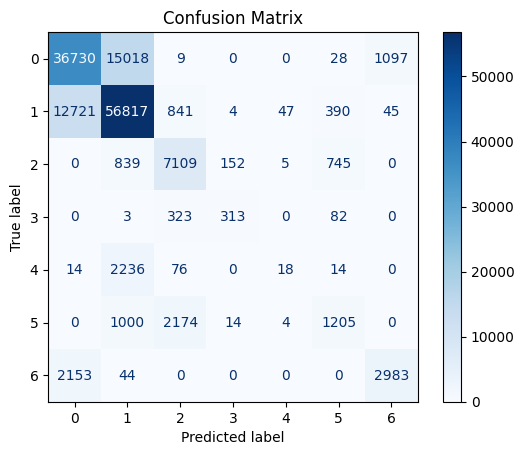

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.71      0.69      0.70     52882
           2       0.75      0.80      0.77     70865
           3       0.67      0.80      0.73      8850
           4       0.65      0.43      0.52       721
           5       0.24      0.01      0.01      2358
           6       0.49      0.27      0.35      4397
           7       0.72      0.58      0.64      5180

    accuracy                           0.72    145253
   macro avg       0.61      0.51      0.53    145253
weighted avg       0.71      0.72      0.71    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####MODEL 1= CV=2######

#Define a function we will use to evaluate Model 1(cv=2)
#Create a confusion matrix and initialise a classification report. Display both
def evaluate_model(model, X_test, y_test):

    model_acc = model1.score(X_test, y_test)
    print("Accuracy: {:.2f}%".format(model_acc * 100))

    y_pred = model1.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    clr = classification_report(y_test, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(len(set(y_test))))
    disp.plot(cmap='Blues', values_format='g')
    plt.title("Confusion Matrix")
    plt.show()

    print("Classification Report:\n----------------------\n", clr)

evaluate_model(model1, X_test_scaled, y_test)

# Generate balanced accuracy and ROC-AUC for Model 1
y_pred = model1.predict(X_test)
y_prob = model1.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

########################################################################
##THIS CODE WAS DEVELOPED PARTIALLY USING EXISTING CODE:(Atkins,2021) ##
########################################################################


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Accuracy: 72.40%


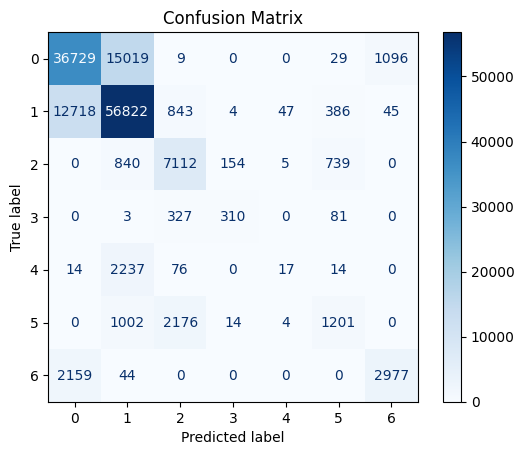

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.71      0.69      0.70     52882
           2       0.75      0.80      0.77     70865
           3       0.67      0.80      0.73      8850
           4       0.64      0.43      0.52       721
           5       0.23      0.01      0.01      2358
           6       0.49      0.27      0.35      4397
           7       0.72      0.57      0.64      5180

    accuracy                           0.72    145253
   macro avg       0.60      0.51      0.53    145253
weighted avg       0.71      0.72      0.71    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####MODEL 2= CV=5######

#Define a new model with cv=5 using LogisticRegressionCV
#Create a confusion matrix and initialise a classification report. Display both
model2 = LogisticRegressionCV(cv=5, random_state=0)
model2.fit(X_train_scaled, y_train)

def evaluate_model(model, X_test, y_test):

    model_acc = model2.score(X_test, y_test)
    print("Accuracy: {:.2f}%".format(model_acc * 100))

    y_pred = model2.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    clr = classification_report(y_test, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(len(set(y_test))))
    disp.plot(cmap='Blues', values_format='g')
    plt.title("Confusion Matrix")
    plt.show()

    print("Classification Report:\n----------------------\n", clr)

evaluate_model(model2, X_test_scaled, y_test)

# Generate balanced accuracy and ROC-AUC for Model 2
y_pred = model2.predict(X_test)
y_prob = model2.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

########################################################################
##THIS CODE WAS DEVELOPED PARTIALLY USING EXISTING CODE:(Atkins,2021) ##
########################################################################

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Accuracy: 72.40%


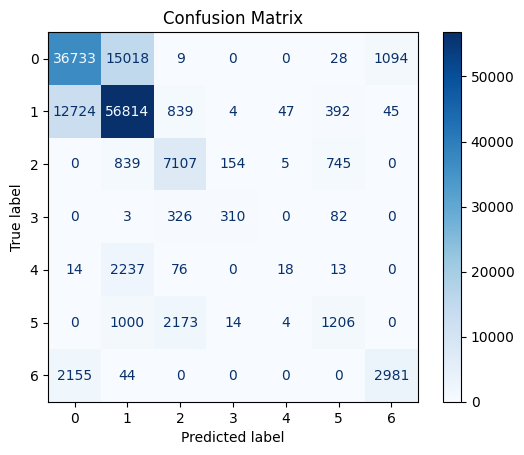

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.71      0.69      0.70     52882
           2       0.75      0.80      0.77     70865
           3       0.67      0.80      0.73      8850
           4       0.64      0.43      0.52       721
           5       0.24      0.01      0.01      2358
           6       0.49      0.27      0.35      4397
           7       0.72      0.58      0.64      5180

    accuracy                           0.72    145253
   macro avg       0.60      0.51      0.53    145253
weighted avg       0.71      0.72      0.71    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####MODEL 3= CV=10######

model3 = LogisticRegressionCV(cv=10, random_state=0)
model3.fit(X_train_scaled, y_train)

#Define a new model with cv=10 using LogisticRegressionCV
#Create a confusion matrix and initialise a classification report. Display both
def evaluate_model(model, X_test, y_test):

    model_acc = model3.score(X_test, y_test)
    print("Accuracy: {:.2f}%".format(model_acc * 100))

    y_pred = model3.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    clr = classification_report(y_test, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(len(set(y_test))))
    disp.plot(cmap='Blues', values_format='g')
    plt.title("Confusion Matrix")
    plt.show()

    print("Classification Report:\n----------------------\n", clr)

evaluate_model(model3, X_test_scaled, y_test)

# Generate balanced accuracy and ROC-AUC for Model 3
y_pred = model3.predict(X_test)
y_prob = model3.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE:(Atkins,2021) ##
###############################################################

In [ ]:
#####OPTIMAL CV VALUE#####

balanced_accuracy = 0.14285714285714285
mean_recall = 0.53
mean_precision = 0.51
mean_f1_score = 0.60
roc_auc= 0.5

print(f"The optimal cv value is cv= 5" )
print(f"Balanced_accuracy: {balanced_accuracy}")
print(f"Mean Recall: {mean_recall}")
print(f"Mean Precision: {mean_precision}")
print(f"Mean F1-Scrore: {mean_f1_score}")
print(f"ROC AUC Score: {roc_auc}")
print(f"It was chosen because it has slightly higher accuracy and with minor improvement on some precision scores across classes")
print(f"CV=5 is also the default cross validation input")

The optimal cv value is cv= 5
Balanced_accuracy: 0.14285714285714285
Mean Recall: 0.53
Mean Precision: 0.51
Mean F1-Scrore: 0.6
ROC AUC Score: 0.5
It was chosen because it has slightly higher accuracy and with minor improvement on some precision scores across classes
CV=5 is also the default cross validation input


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

Accuracy: 72.30%


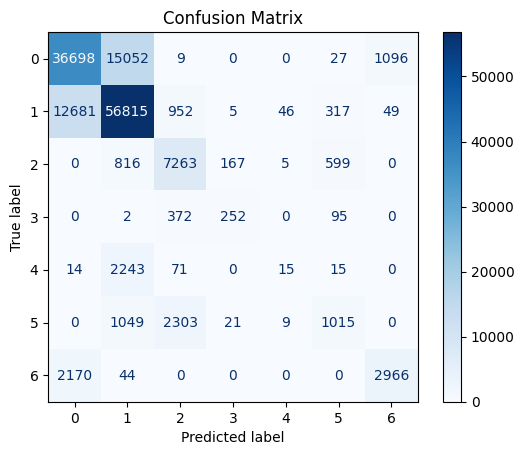

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.71      0.69      0.70     52882
           2       0.75      0.80      0.77     70865
           3       0.66      0.82      0.73      8850
           4       0.57      0.35      0.43       721
           5       0.20      0.01      0.01      2358
           6       0.49      0.23      0.31      4397
           7       0.72      0.57      0.64      5180

    accuracy                           0.72    145253
   macro avg       0.59      0.50      0.52    145253
weighted avg       0.71      0.72      0.71    145253



In [ ]:
#####MODEL 4= SOLVER=SAG######

model4 = LogisticRegressionCV(cv=5, random_state=0, solver='sag')
model4.fit(X_train_scaled, y_train)

#Define a new model with solver=sag using LogisticRegressionCV
#Create a confusion matrix and initialise a classification report. Display both
def evaluate_model(model, X_test, y_test):

    model_acc = model4.score(X_test, y_test)
    print("Accuracy: {:.2f}%".format(model_acc * 100))

    y_pred = model4.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    clr = classification_report(y_test, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(len(set(y_test))))
    disp.plot(cmap='Blues', values_format='g')
    plt.title("Confusion Matrix")
    plt.show()

    print("Classification Report:\n----------------------\n", clr)

evaluate_model(model4, X_test_scaled, y_test)

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE:(Atkins,2021) ##
##############################################################

In [ ]:
# Generate balanced accuracy and ROC-AUC for Model 4
y_pred = model4.predict(X_test)
y_prob = model4.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

Accuracy: 72.35%


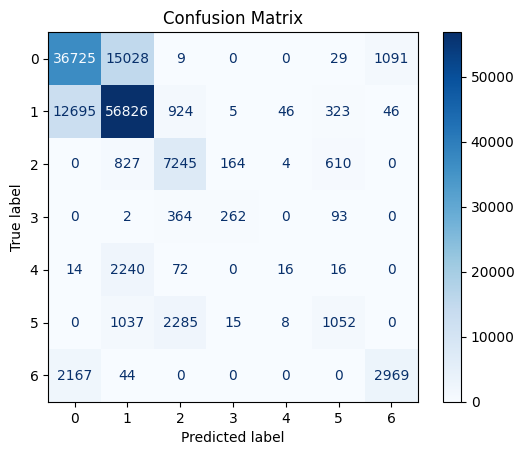

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.71      0.69      0.70     52882
           2       0.75      0.80      0.77     70865
           3       0.66      0.82      0.73      8850
           4       0.59      0.36      0.45       721
           5       0.22      0.01      0.01      2358
           6       0.50      0.24      0.32      4397
           7       0.72      0.57      0.64      5180

    accuracy                           0.72    145253
   macro avg       0.59      0.50      0.52    145253
weighted avg       0.71      0.72      0.71    145253



In [ ]:
#####MODEL 5= SOLVER=SAGA MAX_ITER=1000######

model5 = LogisticRegressionCV(cv=5, random_state=0, solver='saga', max_iter=1000)
model5.fit(X_train_scaled, y_train)

#Define a new model with solver=sag using LogisticRegressionCV
#Create a confusion matrix and initialise a classification report. Display both
def evaluate_model(model, X_test, y_test):

    model_acc = model5.score(X_test, y_test)
    print("Accuracy: {:.2f}%".format(model_acc * 100))

    y_pred = model5.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    clr = classification_report(y_test, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(len(set(y_test))))
    disp.plot(cmap='Blues', values_format='g')
    plt.title("Confusion Matrix")
    plt.show()

    print("Classification Report:\n----------------------\n", clr)

evaluate_model(model5, X_test_scaled, y_test)

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE:(Atkins,2021) ##
##############################################################

Accuracy: 72.40%


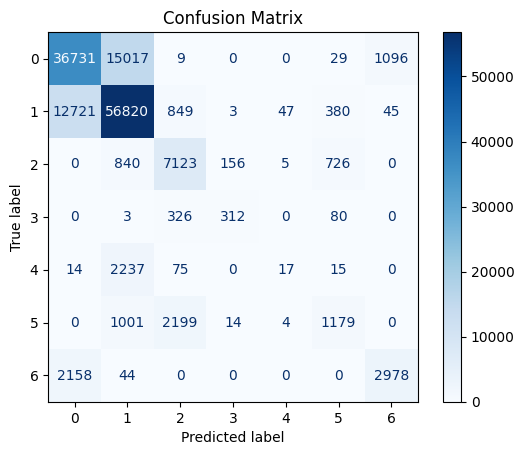

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.71      0.69      0.70     52882
           2       0.75      0.80      0.77     70865
           3       0.67      0.80      0.73      8850
           4       0.64      0.43      0.52       721
           5       0.23      0.01      0.01      2358
           6       0.49      0.27      0.35      4397
           7       0.72      0.57      0.64      5180

    accuracy                           0.72    145253
   macro avg       0.60      0.51      0.53    145253
weighted avg       0.71      0.72      0.71    145253



In [ ]:
#####MODEL 6= SOLVER=LBFGS MAX_ITER=20,000######

model6 = LogisticRegressionCV(cv=5, random_state=0, max_iter=20000)
model6.fit(X_train_scaled, y_train)

#Define a new model with solver=sag using LogisticRegressionCV
#Create a confusion matrix and initialise a classification report. Display both
def evaluate_model(model, X_test, y_test):

    model_acc = model6.score(X_test, y_test)
    print("Accuracy: {:.2f}%".format(model_acc * 100))

    y_pred = model6.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    clr = classification_report(y_test, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(len(set(y_test))))
    disp.plot(cmap='Blues', values_format='g')
    plt.title("Confusion Matrix")
    plt.show()

    print("Classification Report:\n----------------------\n", clr)

evaluate_model(model6, X_test_scaled, y_test)

# Generate balanced accuracy and ROC-AUC for Model 6
y_pred = model6.predict(X_test)
y_prob = model6.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE:(Atkins,2021) ##
##############################################################

In [ ]:
# Generate balanced accuracy and ROC-AUC for Model 6
y_pred = model6.predict(X_test)
y_prob = model6.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


Accuracy: 72.41%


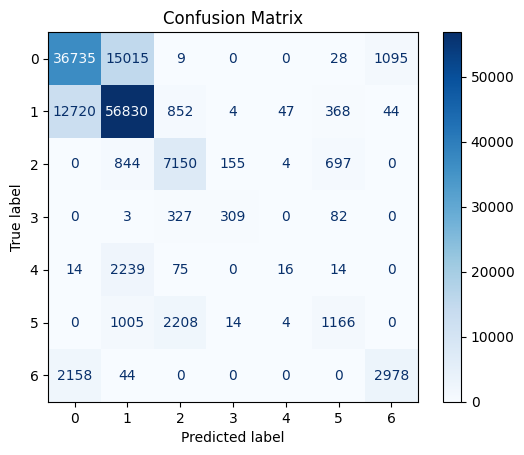

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.71      0.69      0.70     52882
           2       0.75      0.80      0.77     70865
           3       0.67      0.81      0.73      8850
           4       0.64      0.43      0.51       721
           5       0.23      0.01      0.01      2358
           6       0.50      0.27      0.35      4397
           7       0.72      0.57      0.64      5180

    accuracy                           0.72    145253
   macro avg       0.60      0.51      0.53    145253
weighted avg       0.71      0.72      0.71    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####MODEL 7= Cs= 50 ######

model7 = LogisticRegressionCV(cv=5, random_state=0, max_iter=20000, Cs=50)
model7.fit(X_train_scaled, y_train)

#Define a new model with solver=sag using LogisticRegressionCV
#Create a confusion matrix and initialise a classification report. Display both
def evaluate_model(model, X_test, y_test):

    model_acc = model7.score(X_test, y_test)
    print("Accuracy: {:.2f}%".format(model_acc * 100))

    y_pred = model7.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)
    clr = classification_report(y_test, y_pred)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(len(set(y_test))))
    disp.plot(cmap='Blues', values_format='g')
    plt.title("Confusion Matrix")
    plt.show()

    print("Classification Report:\n----------------------\n", clr)

evaluate_model(model7, X_test_scaled, y_test)

# Generate balanced accuracy and ROC-AUC for Model 6
y_pred = model7.predict(X_test)
y_prob = model7.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

##############################################################
##THIS CODE WAS DEVELOPED USING EXISTING CODE:(Atkins,2021) ##
##############################################################

In [ ]:
#####OPTIMAL MODEL#####
recall = 0.51
precision = 0.60
f1_score = 0.53
balanced_accuracy = 0.14285714285714285
roc_auc= 0.5

print(f"The optimal model is model 2 (cv=5, random_state=0, solver= LBFGS(default)" )
print(f"Balanced_accuracy: {balanced_accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1-Scrore: {f1_score}")
print(f"ROC AUC Score: {roc_auc}")
print(f"It was chosen because it makes improvements in precision, recall and f1 scores.")
print(f"Despite being recommended for larger datasets, sag and saga solvers took over 2.5hrs each to compute, whereas lbfgs took on average 17 mins")

The optimal model is model 2 (cv=5, random_state=0, solver= LBFGS(default)
Balanced_accuracy: 0.14285714285714285
Recall: 0.51
Precision: 0.6
F1-Scrore: 0.53
ROC AUC Score: 0.5
It was chosen because it makes improvements in precision, recall and f1 scores.
Despite being recommended for larger datasets, sag and saga solvers took over 2.5hrs each to compute, whereas lbfgs took on average 17 mins


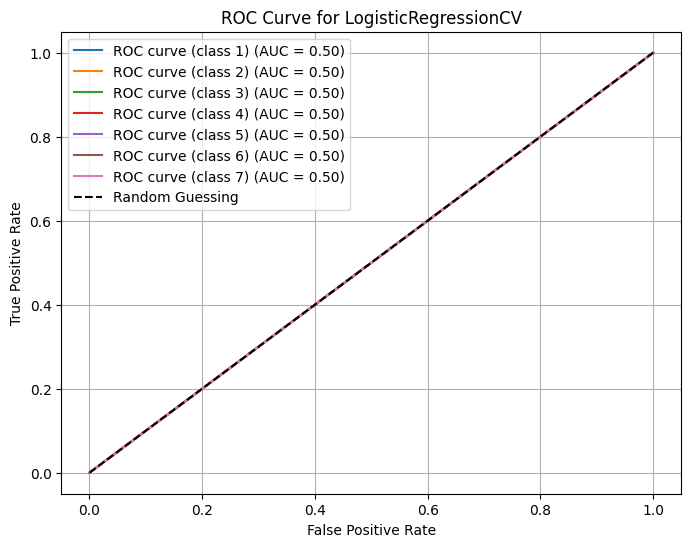

In [ ]:
#CURVE PRESENTED HERE AND SAVED. SUBPLOTS OF ALL ROCS TO BE SHOWN LATER IN NOTEBOOK
y_prob_logcv = model2.predict_proba(X_test)
unique_labels = np.unique(y_test)

# Compute ROC curve and ROC AUC score
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(unique_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob_logcv[:, i], pos_label=unique_labels[i])
    roc_auc[i] = roc_auc_score(y_test == unique_labels[i], y_prob_logcv[:, i])

# Plot ROC curve
plt.figure(figsize=(8, 6))
for i in range(len(unique_labels)):
    plt.plot(fpr[i], tpr[i], label='ROC curve (class {}) (AUC = {:.2f})'.format(unique_labels[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for LogisticRegressionCV')
plt.legend(loc='best')
plt.grid(True)
plt.show()

##### Random Forest

In [ ]:
###MODEL 1 = CLASS_WEIGHT = DEFAULT= NONE ####

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_rf1))

# Generate balanced accuracy and ROC-AUC for Model 1
y_pred_rf1 = rf_clf1.predict(X_test)
y_prob_rf1 = rf_clf1.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf1)
roc_auc = roc_auc_score(y_test, y_prob_rf1, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.72      0.67     52882
           2       0.66      0.76      0.71     70865
           3       0.57      0.28      0.37      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.65    145253
   macro avg       0.27      0.25      0.25    145253
weighted avg       0.59      0.65      0.61    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
###MODEL 2 = CLASS_WEIGHT = BALANCED ####

# Create a Random Forest classifier changing parameters to class_weight='balanced'
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf2 = RandomForestClassifier(n_estimators=7, max_features=0.3, min_samples_split=2, max_depth=2, random_state=0, class_weight='balanced')
rf_clf2.fit(X_train_scaled, y_train)
y_pred_scaled_rf2 = rf_clf2.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf2))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf2 = rf_clf2.predict(X_test)
y_prob_rf2 = rf_clf2.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf2)
roc_auc = roc_auc_score(y_test, y_prob_rf2, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.39      0.45      0.42     52882
           2       0.47      0.01      0.03     70865
           3       0.18      0.11      0.14      8850
           4       0.09      0.91      0.17       721
           5       0.03      0.50      0.06      2358
           6       0.27      0.52      0.36      4397
           7       0.20      0.95      0.33      5180

    accuracy                           0.24    145253
   macro avg       0.23      0.49      0.21    145253
weighted avg       0.40      0.24      0.20    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####OPTIMAL CLASS_WEIGHT PARAMETER #####

balanced_accuracy = 0.14285714285714285
mean_recall = 0.25
mean_precision = 0.27
mean_f1_score = 0.25
roc_auc= 0.5

print(f"The optimal class_weight parameter is default or None")
print(f"Balanced_accuracy: {balanced_accuracy}")
print(f"Mean Recall: {mean_recall}")
print(f"Mean Precision: {mean_precision}")
print(f"Mean F1-Score: {mean_f1_score}")
print(f"ROC AUC Score: {roc_auc}")
print(f"It was chosen because all models so far have the same balanced accuracy score")
print(f"...but the accuracy score for this model is 65% compared to 24%. It, however,")
print(f"..does have a worse recall score")

The optimal class_weight parameter is default or None
Balanced_accuracy: 0.14285714285714285
Mean Recall: 0.25
Mean Precision: 0.27
Mean F1-Scrore: 0.25
ROC AUC Score: 0.5
It was chosen because all models so far have the same balanced accuracy score
...but the accuracy score for this model is 65% compared to 24%. It, however,
..does have a worse recall score


In [ ]:
###MODEL 3 = VERBOSE= 1####

# Create a Random Forest classifier changing parameters to verbose=1
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf3 = RandomForestClassifier(n_estimators=7, max_features=0.3, min_samples_split=2, max_depth=2, random_state=0, verbose=1)
rf_clf3.fit(X_train_scaled, y_train)
y_pred_scaled_rf3 = rf_clf3.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf3))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf3 = rf_clf3.predict(X_test)
y_prob_rf3 = rf_clf3.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf3)
roc_auc = roc_auc_score(y_test, y_prob_rf3, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.72      0.67     52882
           2       0.66      0.76      0.71     70865
           3       0.57      0.28      0.37      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.65    145253
   macro avg       0.27      0.25      0.25    145253
weighted avg       0.59      0.65      0.61    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
###MODEL 4 = VERBOSE= 2####

# Create a Random Forest classifier changing parameters to verbose=2
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf4 = RandomForestClassifier(n_estimators=7, max_features=0.3, min_samples_split=2, max_depth=2, random_state=0, verbose=2)
rf_clf4.fit(X_train_scaled, y_train)
y_pred_scaled_rf4 = rf_clf4.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf4))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf4 = rf_clf4.predict(X_test)
y_prob_rf4 = rf_clf4.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf4)
roc_auc = roc_auc_score(y_test, y_prob_rf4, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

building tree 1 of 7
building tree 2 of 7
building tree 3 of 7
building tree 4 of 7
building tree 5 of 7
building tree 6 of 7
building tree 7 of 7
Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.72      0.67     52882
           2       0.66      0.76      0.71     70865
           3       0.57      0.28      0.37      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.65    145253
   macro avg       0.27      0.25      0.25    145253
weighted avg       0.59      0.65      0.61    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####OPTIMAL VERBOSE PARAMETER #####
print(f"Increasing the verbose value does not seem to have an effect on the model. The default value has been chosen")

Increasing the verbose value does not seem to have an effect on the model. The default value has been chosen


In [ ]:
###MODEL 5 = RANDOM_STATE= 42####

# Create a Random Forest classifier changing parameters to random_state=42
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf5 = RandomForestClassifier(n_estimators=7, max_features=0.3, min_samples_split=2, max_depth=2, random_state=42)
rf_clf5.fit(X_train_scaled, y_train)
y_pred_scaled_rf5 = rf_clf5.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf5))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf5 = rf_clf5.predict(X_test)
y_prob_rf5 = rf_clf5.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf5)
roc_auc = roc_auc_score(y_test, y_prob_rf5, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.73      0.67     52882
           2       0.65      0.75      0.70     70865
           3       0.68      0.19      0.30      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.64    145253
   macro avg       0.28      0.24      0.24    145253
weighted avg       0.59      0.64      0.60    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####OPTIMAL RANDOM_STATE PARAMETER #####
print(f"Changing the random_state value does not seem to have an effect on the model. The default value has been chosen")

Changing the random_state value does not seem to have an effect on the model. The default value has been chosen


In [ ]:
###MODEL 6 = MAX_FEATURES= 0.6####

# Create a Random Forest classifier and double max_features
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf6 = RandomForestClassifier(n_estimators=7, max_features=0.6, min_samples_split=2, max_depth=2, random_state=0)
rf_clf6.fit(X_train_scaled, y_train)
y_pred_scaled_rf6 = rf_clf6.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf6))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf6 = rf_clf6.predict(X_test)
y_prob_rf6 = rf_clf6.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf6)
roc_auc = roc_auc_score(y_test, y_prob_rf6, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.72      0.67     52882
           2       0.70      0.75      0.73     70865
           3       0.57      0.59      0.58      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.67    145253
   macro avg       0.27      0.30      0.28    145253
weighted avg       0.61      0.67      0.64    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
###MODEL 7 = MAX_FEATURES= 1####

# Create a Random Forest classifier and set max_features to 1
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf7 = RandomForestClassifier(n_estimators=7, max_features=1, min_samples_split=2, max_depth=2, random_state=0)
rf_clf7.fit(X_train_scaled, y_train)
y_pred_scaled_rf7 = rf_clf7.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf7))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf7 = rf_clf7.predict(X_test)
y_prob_rf7 = rf_clf7.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf7)
roc_auc = roc_auc_score(y_test, y_prob_rf7, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.96      0.00      0.01     52882
           2       0.49      1.00      0.66     70865
           3       0.00      0.00      0.00      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.49    145253
   macro avg       0.21      0.14      0.09    145253
weighted avg       0.59      0.49      0.32    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
###MODEL 8 = MAX_FEATURES= 0.8 ####

# Create a Random Forest classifier and set max_features to 0.8
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf8 = RandomForestClassifier(n_estimators=7, max_features=0.8, min_samples_split=2, max_depth=2, random_state=0)
rf_clf8.fit(X_train_scaled, y_train)
y_pred_scaled_rf8 = rf_clf8.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf8))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf8 = rf_clf8.predict(X_test)
y_prob_rf8 = rf_clf8.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf8)
roc_auc = roc_auc_score(y_test, y_prob_rf8, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.73      0.67     52882
           2       0.70      0.75      0.72     70865
           3       0.59      0.58      0.59      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.67    145253
   macro avg       0.27      0.29      0.28    145253
weighted avg       0.61      0.67      0.63    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
###MODEL 9 = MAX_FEATURES= 0.9 ####

# Create a Random Forest classifier and set max_features to 0.9
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf9 = RandomForestClassifier(n_estimators=7, max_features=0.9, min_samples_split=2, max_depth=2, random_state=0)
rf_clf9.fit(X_train_scaled, y_train)
y_pred_scaled_rf9 = rf_clf9.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf9))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf9 = rf_clf9.predict(X_test)
y_prob_rf9 = rf_clf9.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf9)
roc_auc_rf9 = roc_auc_score(y_test, y_prob_rf9, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc_rf9)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.73      0.67     52882
           2       0.71      0.75      0.73     70865
           3       0.57      0.68      0.62      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.67    145253
   macro avg       0.27      0.31      0.29    145253
weighted avg       0.61      0.67      0.64    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####OPTIMAL MAX_FEATURES VALUE #####

balanced_accuracy = 0.14285714285714285
recall =  0.31
precision =  0.27
f1_score =  0.29
roc_auc= 0.5

print(f"The optimal max_features value is 0.9")
print(f"Balanced_accuracy: {balanced_accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1-Score: {f1_score}")
print(f"ROC AUC Score: {roc_auc}")
print(f"It was chosen because it slightly better Recall and F1 scores")


The optimal max_features value is 0.9
Balanced_accuracy: 0.14285714285714285
Recall: 0.31
Precision: 0.27
F1-Scrore: 0.29
ROC AUC Score: 0.5
It was chosen because it slightly better Recall and F1 scores


In [ ]:
###MODEL 10 = CRITERION=ENTROPY#####

# Create a Random Forest classifier and set criterion to entropy
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf10 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=2, max_depth=2,
                              random_state=0, criterion="entropy")
rf_clf10.fit(X_train_scaled, y_train)
y_pred_scaled_rf10 = rf_clf10.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf10))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf10 = clf10.predict(X_test)
y_prob_rf10 = clf10.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf10)
roc_auc = roc_auc_score(y_test, y_prob_rf10, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.71      0.67     52882
           2       0.71      0.76      0.73     70865
           3       0.59      0.65      0.62      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.67    145253
   macro avg       0.28      0.30      0.29    145253
weighted avg       0.61      0.67      0.64    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
###MODEL 11 = CRITERION=LOG_LOSS#####

# Create a Random Forest classifier and set criterion to log_loss
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf11 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=2, max_depth=2,
                              random_state=0, criterion="log_loss")
rf_clf11.fit(X_train_scaled, y_train)
y_pred_scaled_rf11 = rf_clf11.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf11))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf11 = rf_clf11.predict(X_test)
y_prob_rf11 = rf_clf11.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf11)
roc_auc = roc_auc_score(y_test, y_prob_rf11, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.63      0.71      0.67     52882
           2       0.71      0.76      0.73     70865
           3       0.59      0.65      0.62      8850
           4       0.00      0.00      0.00       721
           5       0.00      0.00      0.00      2358
           6       0.00      0.00      0.00      4397
           7       0.00      0.00      0.00      5180

    accuracy                           0.67    145253
   macro avg       0.28      0.30      0.29    145253
weighted avg       0.61      0.67      0.64    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5


In [ ]:
#####OPTIMAL CRITERION PARAMETER #####
print(f"Changing the criterion parameter does not seem to have an effect on the model. The default value has been chosen")

Changing the criterion parameter does not seem to have an effect on the model. The default value has been chosen


In [ ]:
###MODEL 12 = MAX_DEPTH=10#####

# Create a Random Forest classifier and set max_depth to 10
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf12 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=2, max_depth=10,
                              random_state=0)
rf_clf12.fit(X_train_scaled, y_train)
y_pred_scaled_rf11 = rf_clf12.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf11))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf12 = rf_clf12.predict(X_test)
y_prob_rf12 = rf_clf12.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf12)
roc_auc = roc_auc_score(y_test, y_prob_rf12, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.79      0.76      0.77     52882
           2       0.79      0.86      0.82     70865
           3       0.77      0.87      0.82      8850
           4       0.85      0.67      0.75       721
           5       0.85      0.21      0.34      2358
           6       0.75      0.36      0.48      4397
           7       0.89      0.76      0.82      5180

    accuracy                           0.79    145253
   macro avg       0.81      0.64      0.69    145253
weighted avg       0.79      0.79      0.79    145253

Balanced Accuracy: 0.14681438654759307
ROC-AUC Score: 0.5070210173938957


In [ ]:
###MODEL 13 = MAX_DEPTH=40#####

# Create a Random Forest classifier and set max_depth to 40
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf13 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=2, max_depth=40,
                              random_state=0)
rf_clf13.fit(X_train_scaled, y_train)
y_pred_scaled_rf13 = rf_clf13.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf11))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf13 = rf_clf13.predict(X_test)
y_prob_rf13 = rf_clf13.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf13)
roc_auc = roc_auc_score(y_test, y_prob_rf13, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.79      0.76      0.77     52882
           2       0.79      0.86      0.82     70865
           3       0.77      0.87      0.82      8850
           4       0.85      0.67      0.75       721
           5       0.85      0.21      0.34      2358
           6       0.75      0.36      0.48      4397
           7       0.89      0.76      0.82      5180

    accuracy                           0.79    145253
   macro avg       0.81      0.64      0.69    145253
weighted avg       0.79      0.79      0.79    145253

Balanced Accuracy: 0.1703157148282954
ROC-AUC Score: 0.514847028710246


In [ ]:
###MODEL 14 = MAX_DEPTH=35#####

# Create a Random Forest classifier set and set max_depth to 35
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf14 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=2, max_depth=35,
                              random_state=0)
rf_clf14.fit(X_train_scaled, y_train)
y_pred_scaled_rf14 = rf_clf14.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf14))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf14 = rf_clf14.predict(X_test)
y_prob_rf14 = rf_clf14.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf14)
roc_auc = roc_auc_score(y_test, y_prob_rf14, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.96      0.96      0.96     52882
           2       0.96      0.97      0.97     70865
           3       0.94      0.95      0.95      8850
           4       0.89      0.85      0.87       721
           5       0.91      0.82      0.86      2358
           6       0.93      0.91      0.92      4397
           7       0.97      0.95      0.96      5180

    accuracy                           0.96    145253
   macro avg       0.94      0.92      0.93    145253
weighted avg       0.96      0.96      0.96    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5109482058186878


In [ ]:
###MODEL 15 = MAX_DEPTH=38#####

# Create a Random Forest classifier and set max_depth to 38
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf15 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=2, max_depth=38,
                              random_state=0)
rf_clf15.fit(X_train_scaled, y_train)
y_pred_scaled_rf15 = rf_clf15.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf15))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf15 = rf_clf15.predict(X_test)
y_prob_rf15 = rf_clf15.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf15)
roc_auc = roc_auc_score(y_test, y_prob_rf15, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.96      0.95      0.96     52882
           2       0.96      0.97      0.97     70865
           3       0.95      0.96      0.95      8850
           4       0.90      0.86      0.88       721
           5       0.91      0.81      0.86      2358
           6       0.93      0.90      0.92      4397
           7       0.97      0.95      0.96      5180

    accuracy                           0.96    145253
   macro avg       0.94      0.92      0.93    145253
weighted avg       0.96      0.96      0.96    145253

Balanced Accuracy: 0.14243286257555224
ROC-AUC Score: 0.5135057595749922


In [ ]:
###MODEL 16 = MAX_DEPTH=39#####

# Create a Random Forest classifier and set max_depth to 39
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf16 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=2, max_depth=39,
                              random_state=0)
rf_clf16.fit(X_train_scaled, y_train)
y_pred_scaled_rf16 = rf_clf16.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf16))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf16 = rf_clf16.predict(X_test)
y_prob_rf16 = rf_clf16.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf16)
roc_auc = roc_auc_score(y_test, y_prob_rf16, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.96      0.96      0.96     52882
           2       0.96      0.97      0.97     70865
           3       0.95      0.96      0.95      8850
           4       0.89      0.87      0.88       721
           5       0.92      0.82      0.86      2358
           6       0.93      0.91      0.92      4397
           7       0.97      0.95      0.96      5180

    accuracy                           0.96    145253
   macro avg       0.94      0.92      0.93    145253
weighted avg       0.96      0.96      0.96    145253

Balanced Accuracy: 0.14424090305189466
ROC-AUC Score: 0.5171193831581541


In [ ]:
#####OPTIMAL MAX_DEPTH VALUE #####

balanced_accuracy = 0.14424090305189466
recall =  0.92
precision =  0.94
f1_score =  0.93
roc_auc= 0.5171193831581541

print(f"The optimal value is 39")
print(f"Balanced_accuracy: {balanced_accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1-Score: {f1_score}")
print(f"ROC AUC Score: {roc_auc}")
print(f"It was chosen because it has slightly better ROC AUC score with better accuracy score")


The optimal value is 39
Balanced_accuracy: 0.14424090305189466
Recall: 0.92
Precision: 0.94
F1-Scrore: 0.93
ROC AUC Score: 0.5171193831581541
It was chosen because it has slightly better ROC AUC score with better accuracy score


In [ ]:
###MODEL 17 = MIN_SAMPLE_SPLIT=10#####

# Create a Random Forest classifier and set min_samples_split=10
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf17 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=10, max_depth=39,
                              random_state=0)
rf_clf17.fit(X_train_scaled, y_train)
y_pred_scaled_rf17 = rf_clf17.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf17))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf17 = rf_clf17.predict(X_test)
y_prob_rf17 = rf_clf17.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf17)
roc_auc_clf17 = roc_auc_score(y_test, y_prob_rf17, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc_clf17)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.96      0.95      0.96     52882
           2       0.96      0.97      0.96     70865
           3       0.94      0.95      0.95      8850
           4       0.89      0.86      0.87       721
           5       0.91      0.80      0.85      2358
           6       0.93      0.90      0.91      4397
           7       0.97      0.95      0.96      5180

    accuracy                           0.96    145253
   macro avg       0.94      0.91      0.92    145253
weighted avg       0.96      0.96      0.96    145253

Balanced Accuracy: 0.14285714285714285
ROC-AUC Score: 0.5203237125530823


In [ ]:
###MODEL 18 = MIN_SAMPLE_SPLIT=9#####

# Create a Random Forest classifier and set min_samples_split=9
#Fit the classifier to the scaled training data, get predictions on the scaled test set
rf_clf18 = RandomForestClassifier(n_estimators=7, max_features=0.9,
                              min_samples_split=9, max_depth=39,
                              random_state=0)
rf_clf18.fit(X_train_scaled, y_train)
y_pred_scaled_rf18 = rf_clf18.predict(X_test_scaled)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_scaled_rf18))

# Generate and print balanced accuracy and ROC-AUC for Model 2
y_pred_rf18 = rf_clf18.predict(X_test)
y_prob_rf18 = rf_clf18.predict_proba(X_test)
balanced_acc = balanced_accuracy_score(y_test, y_pred_rf18)
roc_auc = roc_auc_score(y_test, y_prob_rf18, multi_class='ovr')
print("Balanced Accuracy:", balanced_acc)
print("ROC-AUC Score:", roc_auc)

#########################################
##THIS CODE WAS DEVELOPED FROM SCRATCH ##
#########################################

Classification Report:
              precision    recall  f1-score   support

           1       0.96      0.95      0.95     52882
           2       0.96      0.97      0.96     70865
           3       0.94      0.96      0.95      8850
           4       0.90      0.84      0.87       721
           5       0.91      0.80      0.85      2358
           6       0.92      0.90      0.91      4397
           7       0.96      0.95      0.96      5180

    accuracy                           0.95    145253
   macro avg       0.94      0.91      0.92    145253
weighted avg       0.95      0.95      0.95    145253

Balanced Accuracy: 0.1418803310132793
ROC-AUC Score: 0.5


In [ ]:
#####OPTIMAL MODEL#####

balanced_accuracy =  0.14285714285714285
recall = 0.91
precision = 0.94
f1_score = 0.92
roc_auc= 0.5203237125530823

print(f"The optimal model is Model 17 with default class_weight and verbose parameters")
print(f"The other parameters are [(n_estimators=7, max_features=0.9, min_samples_split=10 max_depth=39,random_state=0)]" )
print(f"Balanced_accuracy: {balanced_accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1-Score: {f1_score}")
print(f"ROC AUC Score: {roc_auc}")
print(f"It was chosen because it makes minor improvements on the ROC score")

The optimal model is Model 17 with default class_weight and verbose parameters
The other parameters are [(n_estimators=7, max_features=0.9, min_samples_split=10 max_depth=39,random_state=0)]
Balanced_accuracy: 0.14285714285714285
Recall: 0.91
Precision: 0.94
F1-Scrore: 0.92
ROC AUC Score: 0.5203237125530823
It was chosen because it makes minor improvements on the ROC score


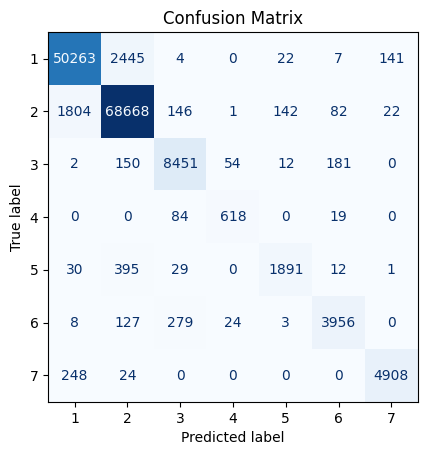

In [ ]:
###CONFUSION MATRIX
rf_cm = confusion_matrix(y_test, y_pred_scaled_rf17)
rf_disp = ConfusionMatrixDisplay(confusion_matrix=rf_cm, display_labels=rf_clf17.classes_)
rf_disp.plot(cmap='Blues', values_format='d', colorbar=False)

plt.title('Confusion Matrix')
plt.show()

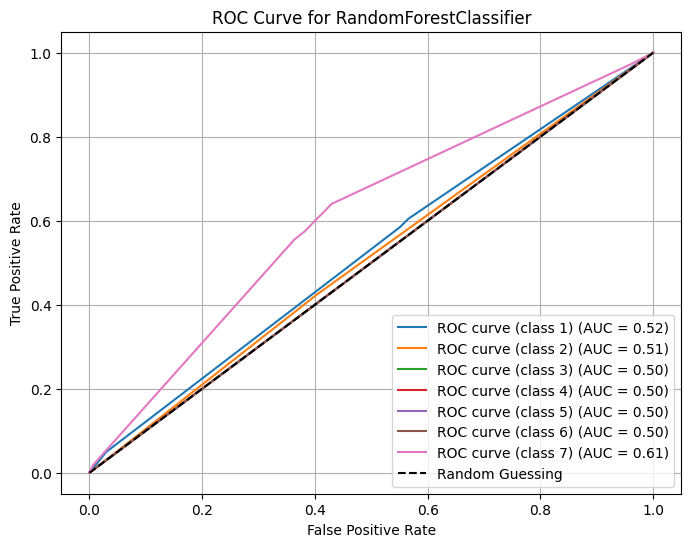

In [ ]:
#CURVE PRESENTED HERE AND SAVED. PLOT OF ALL ROC CURVES SHOWN LATER IN NOTEBOOK
y_prob_rf17 = rf_clf17.predict_proba(X_test)
unique_labels = np.unique(y_test)

# Compute ROC curve and ROC AUC score
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(unique_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_prob_rf17[:, i], pos_label=unique_labels[i])
    roc_auc[i] = roc_auc_score(y_test == unique_labels[i], y_prob_rf17[:, i])

# Plot ROC curve
plt.figure(figsize=(8, 6))
for i in range(len(unique_labels)):
    plt.plot(fpr[i], tpr[i], label='ROC curve (class {}) (AUC = {:.2f})'.format(unique_labels[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for RandomForestClassifier')
plt.legend(loc='best')
plt.grid(True)
plt.show()

##### Plot ROC (all methods)

In [ ]:
print(os.getcwd())
print(os.listdir())

/content
['.config', 'sample_data']


In [ ]:
os.chdir('/content/drive/My Drive/')

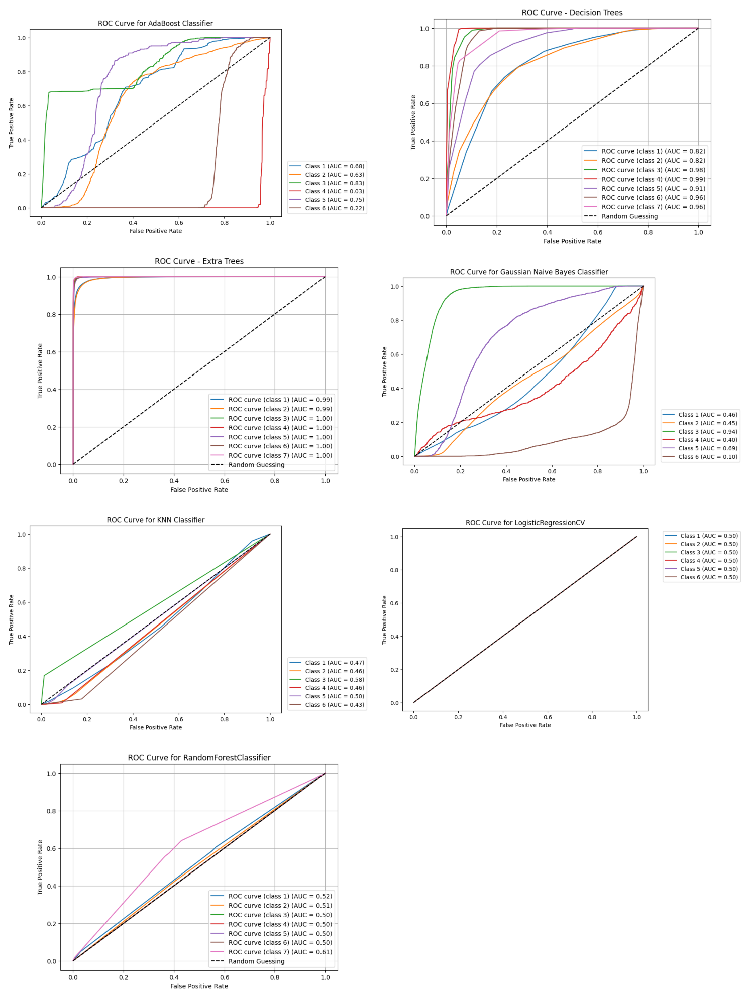

In [ ]:
fig, axs = plt.subplots(4, 2, figsize=(15, 20))

for i in range(4):
    for j in range(2):
        index = i * 2 + j + 1
        if index <= 7:
            image_path = f'roc_curve_plot_{index}.png'
            image = plt.imread(image_path)

            axs[i, j].imshow(image)
            axs[i, j].axis('off')
        else:
            fig.delaxes(axs[i, j])

plt.tight_layout()
plt.show()

##################################################
## Error for for loops were amended by Chat GPT ##
##################################################

# **References**

**METHODS:**

Comaniciu, D., and Meer, P. (2002) 'Mean Shift: A Robust Approach Toward Feature Space Analysis.' *IEEE Transactions on Pattern Analysis and Machine Intelligence.*

Cover, T. and Hart, P. (1967). Nearest neighbor pattern classification. IEEE Transactions on Information Theory, 13(1), 21–27. doi: https://doi.org/10.1109/tit.1967.1053964

Cox, D. R. (1958). The Regression Analysis of Binary Sequences. Journal of the Royal Statistical Society. Series B (Methodological), 20(2), 215-242.

Ester, M., Kriegel, H. P., Sander, J., and Xu, X. (1996) 'A Density-Based Algorithm for Discovering Clusters in Large Spatial Databases with Noise.' *Proceedings of the Second International Conference on Knowledge Discovery and Data Mining*, 2(1) pp-226-231

Freund, Y. & Schapire, R.E. (1995). A desicion-theoretic generalization of on-line learning and an application to boosting. Lecture Notes in Computer Science, 904, 23–37. doi: https://doi.org/10.1007/3-540-59119-2_166.

Fukunaga, K., Hostetler, L. ( 1975). 'The Estimation of the Gradient of a Density Function, with Applications in Pattern Recognition'. *IEEE Transactions on Information Theory*, 21(1), pp-32–40.

Geurts, P., Ernst, D., & Wehenkel, L. (2006). Extremely randomized trees. Machine Learning, 63(1), 3-42. https://doi.org/10.1007/s10994-006-6226-1
Schnell, P. (1964). "Eine Methode zur Auffindung von Gruppen". *Biometrische Zeitschrift*, 6(1), pp-47–48.

Kononenko, I. (1991). Semi-naive bayesian classifier. pp.206–219. doi: https://doi.org/10.1007/bfb0017015

Zhang, T., Ramakrishnan, R., and Livny, M. (1996) 'BIRCH: An Efficient Data Clustering Method for Very Large Databases.' *ACM SIGMOD Record*. 25(2), pp- 103–114

**OTHER REFERENCES:**

Atkins, G., (2021).*Forest Cover Type Prediction (Class Imbalance)*. Available at: https://www.kaggle.com/code/gcdatkin/forest-cover-type-prediction-class-imbalance (Accessed: 15 Feb 2024)

Beuzen, T (2020) *Unsupervised clustering with mixed categorical and continuous data.* Available at :https://www.tomasbeuzen.com/post/clustering-mixed-data/. (Accessed 14 Feb 2024)

DataHub(2024) *Covertype*. Available at: https://datahub.io/machine-learning/covertype#resource-covertype. (Accessed 28 Feb 2024)

GeeksForGeeks(2024) *Agglomerative clustering with different metrics in Scikit Learn.* Available at : https://www.geeksforgeeks.org/agglomerative-clustering-with-different-metrics-in-scikit-learn/. (Accessed 13 Feb 2024)

GeeksForGeeks(2024) *How To Do Train Test Split Using Sklearn In Python.* Available at: https://www.geeksforgeeks.org/how-to-do-train-test-split-using-sklearn-in-python/. (Accessed 11 Feb 2024)

Hunter, J. D. "Matplotlib: Visualization with Python," Matplotlib Documentation, 2023. [Online]. Available: https://matplotlib.org/stable/contents.html. [Accessed: March 1, 2024].

Hunter, J. D. "Matplotlib: Visualization with Python," Matplotlib Documentation, 2023. [Online]. Available: https://matplotlib.org/stable/contents.html. [Accessed: Feb 29, 2024].

Hunter, J. D. "Matplotlib: Visualization with Python," Matplotlib Documentation, 2023. [Online]. Available: https://matplotlib.org/stable/contents.html. [Accessed: Feb 29, 2024].

Iyim, C., (2020)*Predicting Forest Cover Types with the Machine Learning Workflow*. Available at :https://towardsdatascience.com/predicting-forest-cover-types-with-the-machine-learning-workflow-1f6f049bf4df. (Accessed 17 Feb 2024)

J. D. Hunter. "Matplotlib: Visualization with Python," Matplotlib Documentation, 2023. [Online]. Available: https://matplotlib.org/stable/contents.html. [Accessed: March 1, 2024].

klearn Developers. "KNeighborsClassifier - scikit-learn Documentation," Scikit-learn, 2021. [Online]. Available: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html. [Accessed: Feb 29, 2024].

Lindgren, I (2020) *Dealing with Highly Dimensional Data using Principal Component Analysis (PCA)*. Available at : https://towardsdatascience.com/dealing-with-highly-dimensional-data-using-principal-component-analysis-pca-fea1ca817fe6 (Accessed 25 Feb 2024)

P. D. Sklearn, “Preprocessing data,” Scikit-learn Documentation, 2021. [Online]. Available: https://scikit-learn.org/stable/modules/preprocessing.html. [Accessed: March 1, 2024]

Pedregosa, F., Varoquaux, G., Gramfort, A., Michel, V., Thirion, B., Grisel, O., ... & Vanderplas, J. (2011). Scikit-learn: Machine Learning in Python. Journal of Machine Learning Research, 12, 2825-2830. [Online]. Available: https://jmlr.csail.mit.edu/papers/v12/pedregosa11a.html

Scikit-learn Developers. "DecisionBoundaryDisplay," Scikit-learn Documentation, 2021. [Online]. Available: https://scikit-learn.org/stable/whats_new/v0.24.html#id13. [Accessed: March 1, 2024].

Scikit-learn Developers. "sklearn.datasets.fetch_covtype," Scikit-learn Documentation, 2021. [Online]. Available: https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_covtype.html. [Accessed: March 1, 2024].

Scikit-learn Developers. "sklearn.pipeline.Pipeline," Scikit-learn Documentation, 2021. [Online]. Available: https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html. [Accessed: March 1, 2024].

SciKit-Learn(2024) *7.2. Real world datasets*. Available at : https://scikit-learn.org/stable/datasets/real_world.html#forest-covertypes. (Accessed 5 Feb 2024)

SciKit-Learn(2024) *Agglomerative clustering with and without structure.* Available at :https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_clustering.html (Accessed 11 Feb 2024)

SciKit-Learn(2024)*Custom refit strategy of a grid search with cross-validation*. Available at: https://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html (Accessed 13 Feb 2024)

SciKit-Learn(2024). *sklearn.decomposition.PCA.* Available at: https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html (Accessed 29 Feb 2024)
scikit-learn. (n.d). Pipelining: chaining a PCA and a logistic regression. [online]. Available at: https://scikit-learn.org/stable/auto_examples/compose/plot_digits_pipe.html

scikit-learn. (n.d). Post pruning decision trees with cost complexity pruning. [online]. Available at: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html

scikit-learn. (n.d.). Feature importances. [online] Available at: https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html#feature-importance-based-on-feature-permutation [Accessed 29th February 2024]

scikit-learn. (n.d.). Gaussian Mixture Model Selection. [online] Available at: https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_selection.html#plot-the-bic-scores [Accessed 23rd  February 2024]

scikit-learn. (n.d.). Receiver Operating Characteristic (ROC). [online] Available at: https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html [Accessed 1st March 2024]

Sklearn Developers. "KNeighborsClassifier - scikit-learn Documentation," Scikit-learn, 2021. [Online]. Available: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html. [Accessed: March 1, 2024].

Sklearn Developers. "Model Evaluation: Quantifying the Quality of Predictions," Scikit-learn Documentation, 2021. [Online]. Available: https://scikit-learn.org/stable/modules/model_evaluation.html. [Accessed: March 1, 2024].

Sklearn Developers. "Model Evaluation: Quantifying the Quality of Predictions," Scikit-learn Documentation, 2021. [Online]. Available: https://scikit-learn.org/stable/modules/model_evaluation.html. [Accessed: Feb 29, 2024].

Stack Overflow. (2017). sklearn: fitting RandomForestClassifier or normilize data with chunks of data. [online] Available at: https://stackoverflow.com/questions/44713992/sklearn-fitting-randomforestclassifier-or-normilize-data-with-chunks-of-data [Accessed 23rd February 2024]

Stojiljković, M.,(2024) *Split Your Dataset With scikit-learn's train_test_split*(). Available at: https://realpython.com/train-test-split-python-data/#the-importance-of-data-splitting. (Accessed 19 Feb 2024)

UCI Machine Learning Repository(2024) *Covertype*. Available at : https://archive.ics.uci.edu/dataset/31/covertype . (Accessed 5 Feb 2024)

Wes McKinney. "Data Structures for Statistical Computing in Python," Proceedings of the 9th Python in Science Conference, 2010, pp. 51-56. [Online]. Available: https://conference.scipy.org/proceedings/scipy2010/mckinney.html. [Accessed: March 1, 2024].
